# ANALYSIS OF ALL MOVIES

In [113]:
import os
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap
from fa2_modified import ForceAtlas2
import seaborn as sns
from collections import Counter, defaultdict
import community.community_louvain as community_louvain
import numpy as np
import random
import re
import math
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud

# Ensure necessary NLTK resources are downloaded
nltk.download('punkt')
nltk.download('stopwords')


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Alba\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Alba\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

## TOP MOVIES
Create directed network with the top 250 and their related movies.

In [2]:
# Load the CSV file into a DataFrame
df = pd.read_csv('top_movie_data_with_similar.csv')

# Create an empty directed graph
D1 = nx.DiGraph()

# Add nodes and edges based on the similarity list
for index, row in df.iterrows():
    film = row['Name']
    similar_films = row['Similar Movies'].split(', ')  # Splitting the similar films into a list
    
    # Add the film as a node (it will be added automatically when creating edges)
    D1.add_node(film)
    
    # Add edges between the film and its similar films
    for similar_film in similar_films:
        D1.add_edge(film, similar_film)

# Delete self-loops
self_loops = list(nx.selfloop_edges(D1))
D1.remove_edges_from(self_loops)

# Num of nodes and edges
print("Number of nodes:", D1.number_of_nodes())
print("Number of edges:", D1.number_of_edges())

Number of nodes: 646
Number of edges: 3022


Add metadata to each node as attribute.

In [3]:
# Folder containing the text files
metadata_folder = 'top_net_movies_info'

# Function to parse a metadata text file and exclude the "Synopsis" field
def parse_metadata(file_path):
    metadata = {}
    with open(file_path, 'r', encoding='utf-8') as file:
        lines = file.readlines()
        key = None
        for line in lines:
            line = line.strip()
            if line.endswith(':'):
                key = line[:-1]  # Remove the colon
                if key == 'Synopsis':  # Skip "Synopsis"
                    key = None
                else:
                    metadata[key] = ''
            elif key:  # Append the value to the current key
                metadata[key] += (' ' + line if metadata[key] else line)
    return metadata

# Add metadata to the nodes in the graph
for node in D1.nodes():
    # First, assume the filename matches the node title directly
    metadata_file = os.path.join(metadata_folder, f"{node}.txt")
    
    # If the file doesn't exist, try replacing ":" and "?" with "_"
    if not os.path.exists(metadata_file):
        if node == "Car Crash: Who's Lying?":
            sanitized_node = "Car Crash_ Who's Lying_"
            metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
        else:
            for char in [':', '?']:
                sanitized_node = node.replace(char, '_')
                metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
                if os.path.exists(metadata_file):
                    break
    
    # If the file exists, parse the metadata and add it to the node
    if os.path.exists(metadata_file):
        metadata = parse_metadata(metadata_file)
        nx.set_node_attributes(D1, {node: metadata})
    else:
        print(f"Metadata file not found for {node}")

In [4]:
# Check attributes of a specific node
sample_node = "Fight Club"
if sample_node in D1.nodes:
    # Print the metadata of the node in one line each
    for key, value in D1.nodes[sample_node].items():
        print(f"{key}: {value}")

Title: Fight Club 
Rating: 8.8 
Top 250 Rank: 13 
Duration: 139 
Release Date: 05 Nov 1999 (Denmark) 
Genres: Drama 
Director: David Fincher 
Actors: Edward Norton, Brad Pitt, Meat Loaf, Zach Grenier, Richmond Arquette, David Andrews, George Maguire, Eugenie Bondurant, Christina Cabot, Helena Bonham Carter 
Languages: English 
Description: A nameless first-person narrator attends support groups in an attempt to subdue his emotional state and relieve his insomniac state. When he meets Marla, another fake attendee of support groups, his life seems to become a little more bearable. However, when he associates himself with Tyler he is dragged into an underground fight club and soap-making scheme. Together the two men spiral out of control and engage in competitive rivalry for love and power. 
Plot: ['An insomniac office worker and a devil-may-care soap maker form an underground fight club that evolves into much more.', 'A nameless first-person narrator attends support groups in an attempt 

Keep only movies with a **rating greater than 7.8**. This will help expand the network and increase connectivity, as the top 250 movies start at a minimum rating of 8.

In [5]:
# Take only the movies with more than 7.8 rating
nodes_to_remove = []
for node in D1.nodes():
    if 'Rating' in D1.nodes[node]:
        rating = D1.nodes[node]['Rating']
        if rating:
            if rating == 'N/A ':
                nodes_to_remove.append(node)
            else:
                rating = float(rating)
                if rating < 7.8:
                    nodes_to_remove.append(node)

D2 = D1.copy()
D2.remove_nodes_from(nodes_to_remove)
print("Number of nodes after removing:", D2.number_of_nodes())
print("Number of edges after removing:", D2.number_of_edges())

Number of nodes after removing: 395
Number of edges after removing: 2478


Keep only the largest connected component.

Number of nodes: 391
Number of edges: 2478


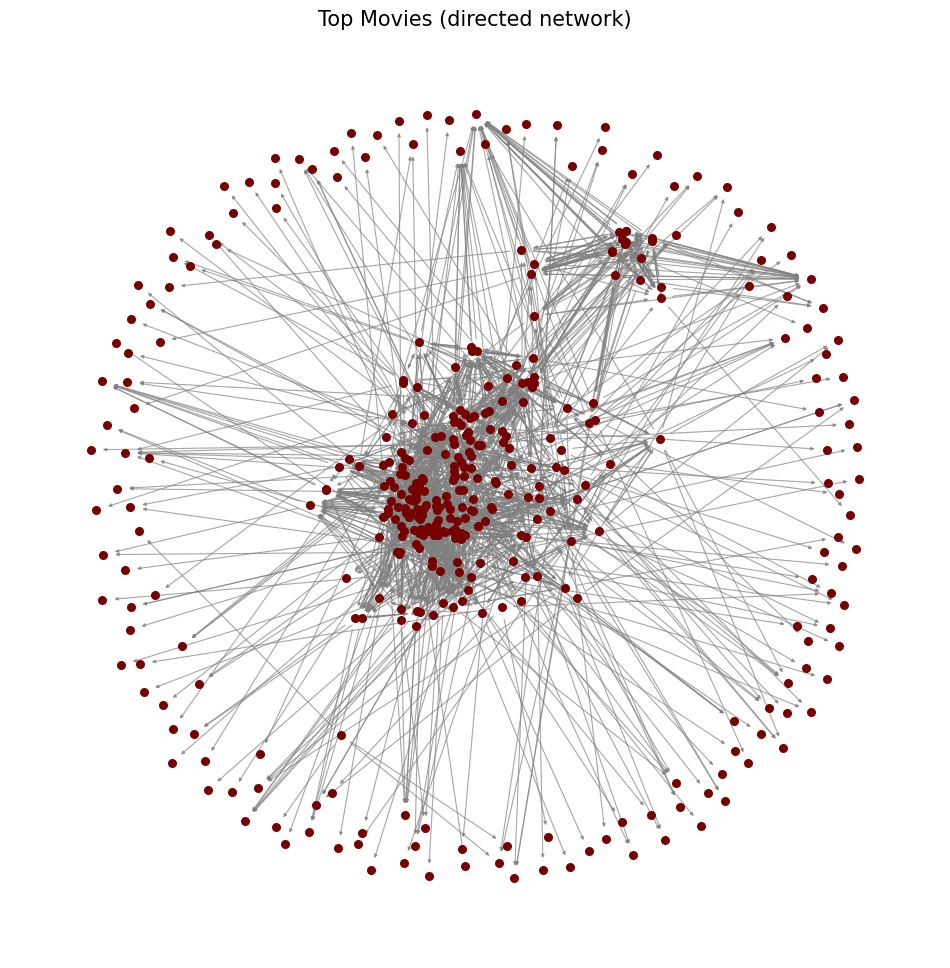

In [6]:
# Take the largest connected component
largest_cc = max(nx.weakly_connected_components(D2), key=len)
D = D2.subgraph(largest_cc)

# Num of nodes and edges
print("Number of nodes:", D.number_of_nodes())
print("Number of edges:", D.number_of_edges())

# Plot the graph
plt.figure(figsize=(12, 12))

# Positions for nodes
pos = nx.spring_layout(D, seed=1)  # Layout for consistent

# Draw edges and nodes
nx.draw_networkx_edges(D, pos, edge_color='gray', alpha=0.7, width=0.8, arrowsize=5)
nx.draw_networkx_nodes(D, pos, node_color='#760000', node_size=30)

plt.title('Top Movies (directed network)', fontsize=15)
plt.axis('off')
plt.show()

Save all node names in a txt.

<div class="alert alert-warning">
DONT RUN AGAIN!
</div>

In [126]:
# Save node names to a text file
node_names = list(D.nodes)
with open('top_net_movies_titles.txt', 'w') as file:
    for node in node_names:
        file.write(f"{node}\n")

print(f"Node names have been saved.")

Node names have been saved.


### Distributions
We calculate the out and in degree distributions of the network.

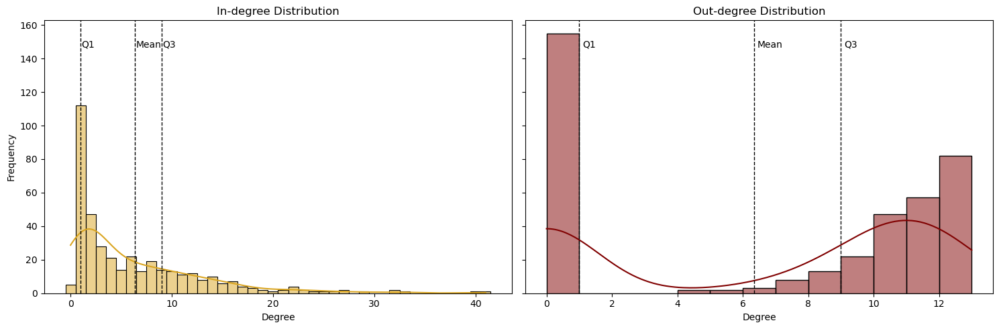

In [7]:
# Get the in-degree and out-degree for each node
in_degrees = [d for n, d in D.in_degree()]
out_degrees = [d for n, d in D.out_degree()]

# Create a pandas Series from the degree lists
in_degree_series = pd.Series(in_degrees)
out_degree_series = pd.Series(out_degrees)

# Create a figure with two subplots that share the same y-axis
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), sharey=True)

# Define bin width and range
binwidth = 1
binrange = (min(in_degrees) - 0.5, max(in_degrees) + 0.5)

# Plot the in-degree distribution as a histogram in the first subplot with the same color
sns.histplot(in_degree_series, color='goldenrod', kde=True, ax=ax1, binwidth=binwidth, binrange=binrange)
ax1.set_title("In-degree Distribution")
ax1.set_xlabel("Degree")
ax1.set_ylabel("Frequency")

# Plot the out-degree distribution as a histogram in the second subplot with the same color
sns.histplot(out_degree_series, color='maroon', kde=True, ax=ax2, binwidth=binwidth)
ax2.set_title("Out-degree Distribution")
ax2.set_xlabel("Degree")
ax2.set_ylabel("Frequency")

# plot lines showing the quartiles and the mean with new colors
for ax in [ax1, ax2]:
    mean_line = ax.axvline(in_degree_series.mean(), color='black', linestyle='dashed', linewidth=1)  # Mean
    q1_line = ax.axvline(in_degree_series.quantile(0.25), color='black', linestyle='dashed', linewidth=1)  # Quartile 1
    q3_line = ax.axvline(in_degree_series.quantile(0.75), color='black', linestyle='dashed', linewidth=1)  # Quartile 3
    
    # Annotate the lines
    ax.text(in_degree_series.mean() + 0.1, ax.get_ylim()[1]*0.9, 'Mean', color='black', fontsize=10)
    ax.text(in_degree_series.quantile(0.25) + 0.1, ax.get_ylim()[1]*0.9, 'Q1', color='black', fontsize=10)
    ax.text(in_degree_series.quantile(0.75) + 0.1, ax.get_ylim()[1]*0.9, 'Q3', color='black', fontsize=10)

plt.tight_layout()
plt.show()


Some nodes have a zero out-degree because the related movies that are not part of the original top 250 do not have any edges pointing to other nodes, only the top 250 movies have outgoing edges.

In [8]:
print("In-degree distribution:")
print(in_degree_series.describe())
print()
print("Out-degree distribution:")
print(out_degree_series.describe())


In-degree distribution:
count    391.000000
mean       6.337596
std        6.764431
min        0.000000
25%        1.000000
50%        4.000000
75%        9.000000
max       41.000000
dtype: float64

Out-degree distribution:
count    391.000000
mean       6.337596
std        5.303950
min        0.000000
25%        0.000000
50%        9.000000
75%       11.000000
max       13.000000
dtype: float64


Show the 10 nodes with highest in-degree connections.

In [9]:
# Top 10 nodes with highest in-degree with its genre and rating
in_degrees = dict(D.in_degree())
top_10_indegree = sorted(in_degrees.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 nodes with highest in-degree:")
for node, indegree in top_10_indegree:
    print(f"{node} (In-degree: {indegree})")
    print(f"    Genres: {D.nodes[node].get('Genres')}")
    print(f"    Rating: {D.nodes[node].get('Rating')}")
    print(F"    Director: {D.nodes[node].get('Director')}")
    print(F"    Cast: {D.nodes[node].get('Actors')}")

Top 10 nodes with highest in-degree:
Fight Club (In-degree: 41)
    Genres: Drama 
    Rating: 8.8 
    Director: David Fincher 
    Cast: Edward Norton, Brad Pitt, Meat Loaf, Zach Grenier, Richmond Arquette, David Andrews, George Maguire, Eugenie Bondurant, Christina Cabot, Helena Bonham Carter 
Forrest Gump (In-degree: 40)
    Genres: Drama, Romance 
    Rating: 8.8 
    Director: Robert Zemeckis 
    Cast: Tom Hanks, Rebecca Williams, Sally Field, Michael Conner Humphreys, Harold G. Herthum, George Kelly, Bob Penny, John Randall, Sam Anderson, Margo Moorer 
Pulp Fiction (In-degree: 33)
    Genres: Crime, Drama 
    Rating: 8.9 
    Director: Quentin Tarantino 
    Cast: Tim Roth, Amanda Plummer, Laura Lovelace, John Travolta, Samuel L. Jackson, Phil LaMarr, Frank Whaley, Burr Steers, Bruce Willis, Ving Rhames 
Inception (In-degree: 32)
    Genres: Action, Adventure, Sci-Fi, Thriller 
    Rating: 8.8 
    Director: Christopher Nolan 
    Cast: Leonardo DiCaprio, Joseph Gordon-Levitt,

In [12]:
# Top 10 nodes with highest out-degree with its genre and rating
out_degrees = dict(D.out_degree())
top_10_outdegree = sorted(out_degrees.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 5 nodes with highest out-degree:")
for node, outdegree in top_10_outdegree:
    print(f"{node} (Out-degree: {outdegree})")
    print(f"    Genres: {D.nodes[node].get('Genres')}")
    print(f"    Rating: {D.nodes[node].get('Rating')}")
    print(F"    Director: {D.nodes[node].get('Director')}")
    print(F"    Cast: {D.nodes[node].get('Actors')}")

Top 5 nodes with highest out-degree:
The Iron Giant (Out-degree: 13)
    Genres: Animation, Action, Adventure, Comedy, Drama, Family, Sci-Fi 
    Rating: 8.1 
    Director: Brad Bird 
    Cast: Jennifer Aniston, Harry Connick Jr., Vin Diesel, James Gammon, Cloris Leachman, Christopher McDonald, John Mahoney, Eli Marienthal, M. Emmet Walsh, Jack Angel 
Room (Out-degree: 13)
    Genres: Drama, Thriller 
    Rating: 8.1 
    Director: Lenny Abrahamson 
    Cast: Brie Larson, Jacob Tremblay, Sean Bridgers, Wendy Crewson, Sandy McMaster, Matt Gordon, Amanda Brugel, Joe Pingue, Joan Allen, Zarrin Darnell-Martin 
Hachi: A Dog's Tale (Out-degree: 13)
    Genres: Biography, Drama, Family 
    Rating: 8.1 
    Director: Lasse Hallström 
    Cast: Richard Gere, Joan Allen, Cary-Hiroyuki Tagawa, Sarah Roemer, Jason Alexander, Erick Avari, Davenia McFadden, Robbie Sublett, Kevin DeCoste, Rob Degnan 
The Shawshank Redemption (Out-degree: 12)
    Genres: Drama 
    Rating: 9.3 
    Director: Frank Da

### Communities
First, we make the network undirected.

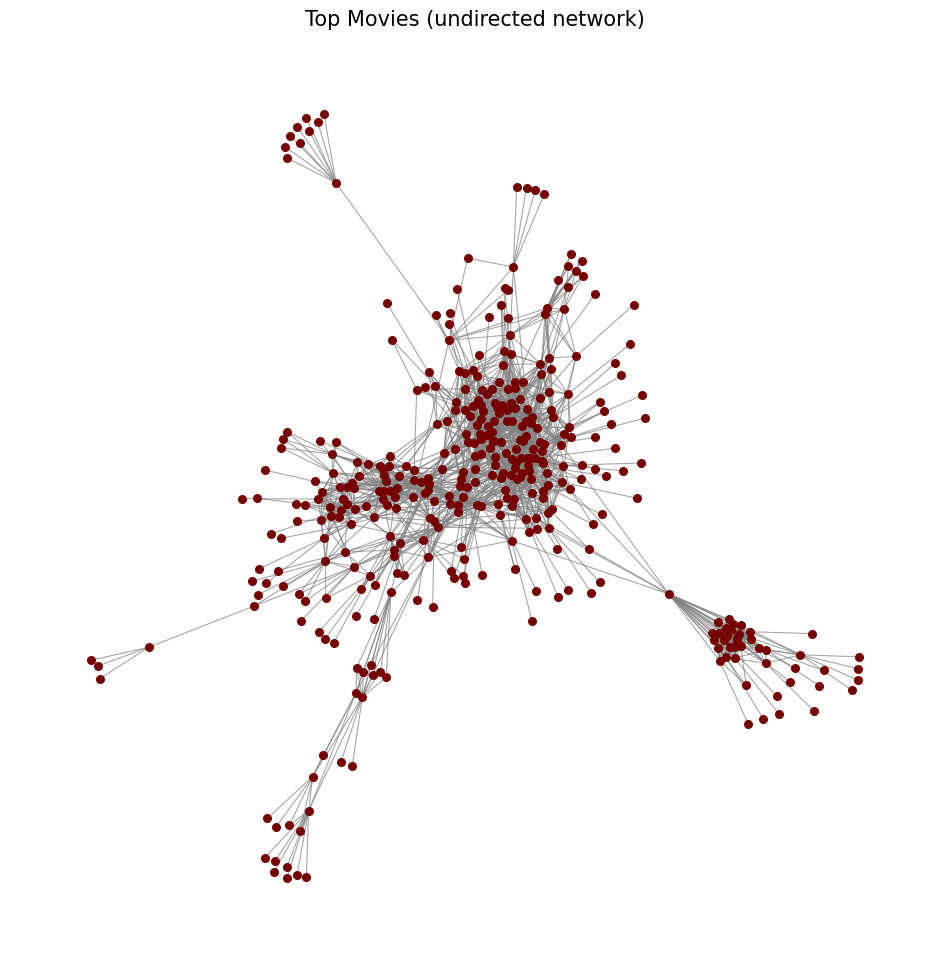

In [13]:
# Make undirected graph
G = D.to_undirected()

# Plot the graph
plt.figure(figsize=(12, 12))

# Positions for nodes
pos = nx.spring_layout(G, seed=42)  # Layout for consistent

# Draw edges and nodes
nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.7, width=0.8)
nx.draw_networkx_nodes(G, pos, node_color='#760000', node_size=30)

plt.title('Top Movies (undirected network)', fontsize=15)
plt.axis('off')
plt.show()

Plot the same net using ForceAtlas2 to modify the size of the node based on the degree, and show the names of those nodes with a degree higher than 20.

100%|██████████| 1000/1000 [00:04<00:00, 247.41it/s]


BarnesHut Approximation  took  0.69  seconds
Repulsion forces  took  3.05  seconds
Gravitational forces  took  0.02  seconds
Attraction forces  took  0.04  seconds
AdjustSpeedAndApplyForces step  took  0.14  seconds


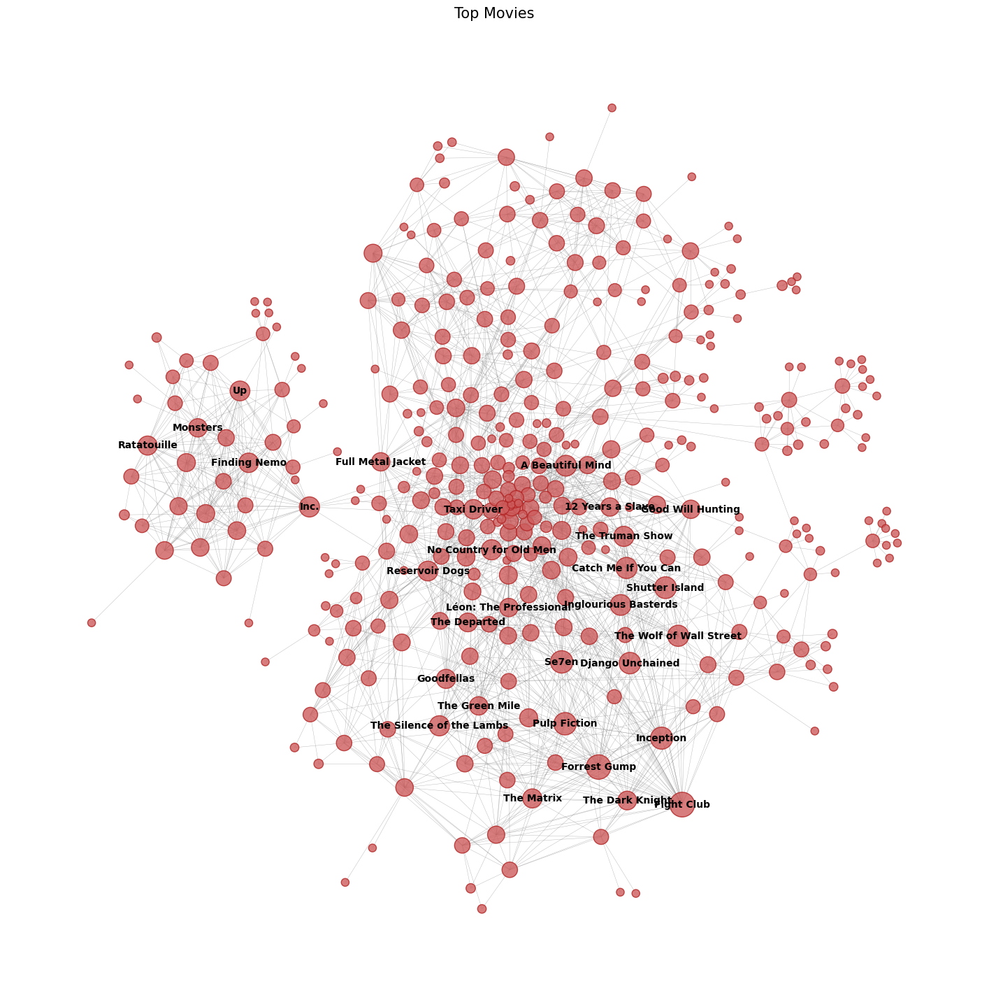

In [14]:
# Calculate the degree of each node
node_degrees = dict(G.degree())  # Returns a dictionary with nodes as keys and their degrees as values

# Normalize node sizes for better visualization
max_degree = max(node_degrees.values())  # Find the maximum degree
node_sizes = [((degree / max_degree) * 600) + 50 for degree in node_degrees.values()]  # Scale node sizes

# Use ForceAtlas2 to compute positions
forceatlas2 = ForceAtlas2(
    outboundAttractionDistribution=True,
    linLogMode=False,
    adjustSizes=False,
    edgeWeightInfluence=1.0,
    jitterTolerance=0.5,
    barnesHutOptimize=True,
    barnesHutTheta=1.2,
    multiThreaded=False,
    scalingRatio=7.0,
    strongGravityMode=False,
    gravity=80,
    verbose=True
)

# Set global random seed for reproducibility
random.seed(42)
np.random.seed(42)
positions = forceatlas2.forceatlas2_networkx_layout(G, iterations=1000)

# Plot the graph with node sizes based on degree
plt.figure(figsize=(18, 18))

# Draw nodes with sizes proportional to their degree
nodes = nx.draw_networkx_nodes(
    G,
    pos=positions,
    node_color='indianred', #'#E64F4F',
    edgecolors='firebrick', #'#C92626', # Set the node border color
    node_size=node_sizes,  # Set node sizes based on degree
    alpha=0.8
)

# Draw edges with a single color
edges = nx.draw_networkx_edges(
    G,
    pos=positions,
    width=0.3,
    edge_color='gray',
    alpha=0.6
)

# Set the degree threshold for which we will show node labels
degree_threshold = 20  # You can adjust this value

# Get the nodes that exceed the degree threshold
high_degree_nodes = [node for node, degree in node_degrees.items() if degree > degree_threshold]

# Draw labels for the nodes with degree above the threshold
labels = {node: node for node in high_degree_nodes}  # Use node name as label
nx.draw_networkx_labels(
    G,
    pos=positions,
    labels=labels,
    font_size=10,
    font_color='black',
    font_weight='semibold',
    verticalalignment='center'
)

# Title and axis settings
plt.title('Top Movies', fontsize=15) # node sizes based on degree
plt.axis('off')
plt.show()


#### Genre partition

Group nodes based on their **genres**. Nodes without any genre information will be assigned to a "None" category.

In [15]:
# Create a dictionary to hold the partition
genre_partition = {}

# Iterate over nodes in the graph and assign them to communities based on their first genre
for node, data in G.nodes(data=True):
    # Get the 'Genres' attribute and split it into a list, if present
    genres = data.get("Genres", "")  # Default to an empty string if 'Genres' is missing
    genres_list = [g.strip() for g in genres.split(",")] if genres else []  # Split and strip spaces
    
    # Get the first genre, or None if no genres are available
    first_genre = genres_list[0] if genres_list else None
    
    # Add node to the appropriate community in the partition
    if first_genre not in genre_partition:
        genre_partition[first_genre] = []
    genre_partition[first_genre].append(node)

print("Total number of genres:", len(genre_partition), "\n")
for genre, nodes in genre_partition.items():
    print(f"{genre}: {len(nodes)} nodes")

Total number of genres: 12 

Drama: 99 nodes
Action: 78 nodes
Crime: 46 nodes
Biography: 30 nodes
Adventure: 25 nodes
Comedy: 42 nodes
Short: 7 nodes
Animation: 46 nodes
Mystery: 3 nodes
Horror: 3 nodes
Documentary: 10 nodes
Film-Noir: 2 nodes


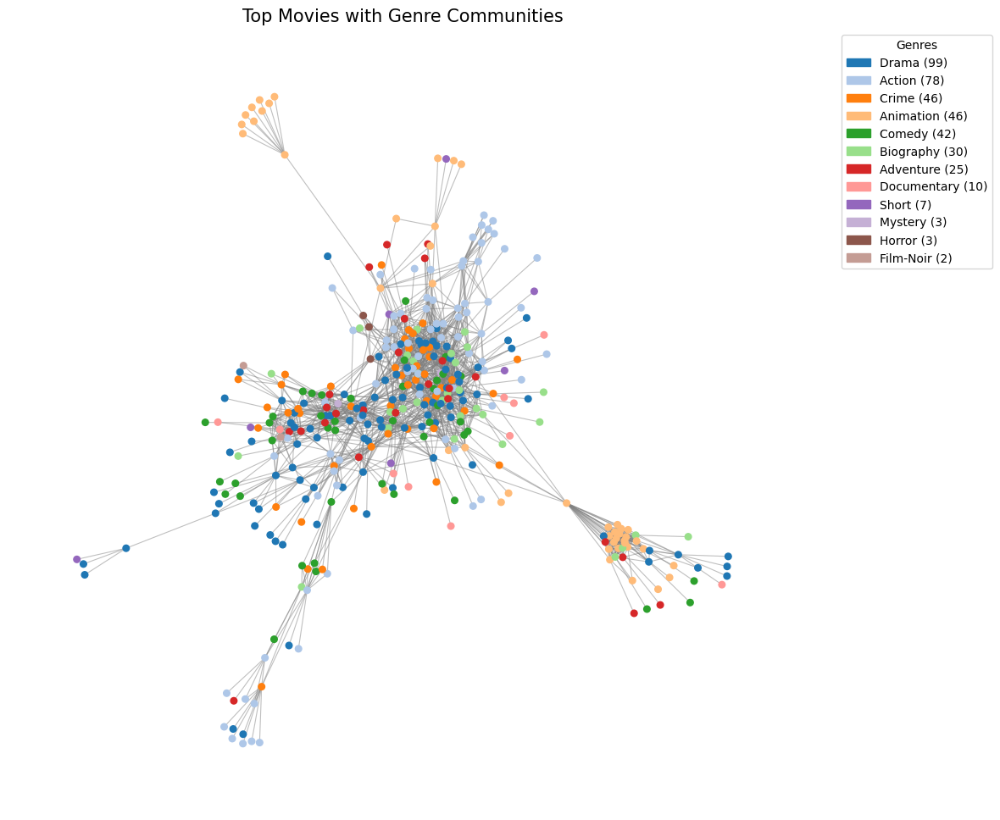

In [16]:
# Sort genres by the number of nodes, descending
sorted_genres = sorted(genre_partition.items(), key=lambda x: len(x[1]), reverse=True)

# Create a color map for each genre based on the sorted order
genre_to_color = {genre: plt.cm.tab20.colors[i % 20] for i, (genre, _) in enumerate(sorted_genres)}

# Create a list of colors for the nodes based on their genre
node_colors = []
for node in G.nodes:
    # Assign the corresponding color, default to "Unknown"
    assigned_color = "gray"  # Default to gray for nodes not matching any genre
    for genre, nodes in genre_partition.items():
        if node in nodes:
            assigned_color = genre_to_color[genre]
            break
    node_colors.append(assigned_color)

# Plot the graph
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42)  # Layout for consistent positioning

nx.draw_networkx_edges(G, pos, edge_color="gray", alpha=0.5, width=0.8)
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=30)

# Create a sorted legend
legend_handles = [
    mpatches.Patch(color=genre_to_color[genre], label=f"{genre} ({len(nodes)})")
    for genre, nodes in sorted_genres
]
plt.legend(handles=legend_handles, title="Genres", bbox_to_anchor=(1.05, 1), loc="upper left")

plt.title("Top Movies with Genre Communities", fontsize=15)

plt.axis("off")
plt.show()


100%|██████████| 1000/1000 [00:04<00:00, 208.95it/s]


BarnesHut Approximation  took  0.83  seconds
Repulsion forces  took  3.53  seconds
Gravitational forces  took  0.07  seconds
Attraction forces  took  0.07  seconds
AdjustSpeedAndApplyForces step  took  0.14  seconds


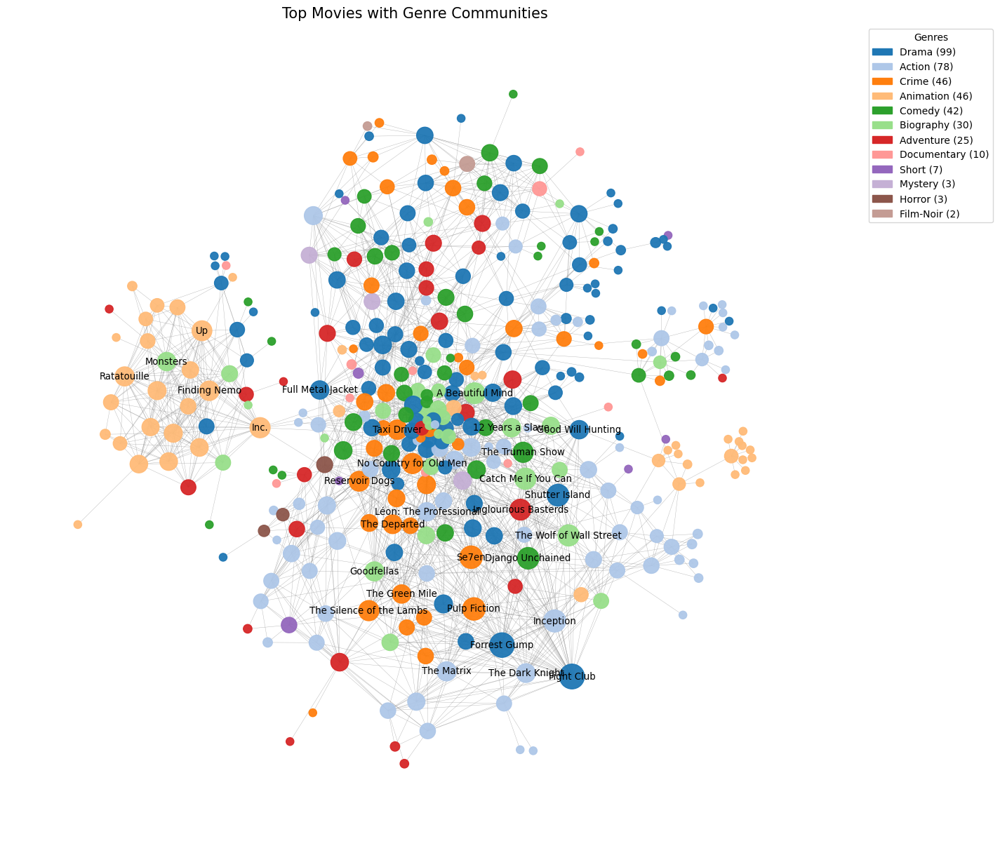

In [17]:
# Calculate the degree of each node
node_degrees = dict(G.degree())  # Returns a dictionary with nodes as keys and their degrees as values

# Normalize node sizes for better visualization
max_degree = max(node_degrees.values())  # Find the maximum degree
node_sizes = [((degree / max_degree) * 600) + 50 for degree in node_degrees.values()]  # Scale node sizes

# Use ForceAtlas2 to compute positions
forceatlas2 = ForceAtlas2(
    outboundAttractionDistribution=True,
    linLogMode=False,
    adjustSizes=False,
    edgeWeightInfluence=1.0,
    jitterTolerance=0.5,
    barnesHutOptimize=True,
    barnesHutTheta=1.2,
    multiThreaded=False,
    scalingRatio=7.0,
    strongGravityMode=False,
    gravity=80,
    verbose=True
)

# Set global random seed for reproducibility
random.seed(42)
np.random.seed(42)

positions = forceatlas2.forceatlas2_networkx_layout(G, iterations=1000)

# Sort genres by the number of nodes, descending
sorted_genres = sorted(genre_partition.items(), key=lambda x: len(x[1]), reverse=True)

# Create a color map for each genre based on the sorted order
genre_to_color = {genre: plt.cm.tab20.colors[i % 20] for i, (genre, _) in enumerate(sorted_genres)}

# Create a list of colors for the nodes based on their genre
node_colors = []
for node in G.nodes:
    # Assign the corresponding color, default to "Unknown"
    assigned_color = "gray"  # Default to gray for nodes not matching any genre
    for genre, nodes in genre_partition.items():
        if node in nodes:
            assigned_color = genre_to_color[genre]
            break
    node_colors.append(assigned_color)

# Plot the graph with node sizes based on degree and genre-based colors
plt.figure(figsize=(15, 15))

# Draw nodes with sizes proportional to their degree
nodes = nx.draw_networkx_nodes(
    G,
    pos=positions,
    node_color=node_colors,  # Set node colors based on genre
    node_size=node_sizes,  # Set node sizes based on degree
    alpha=0.95
)

# Draw edges with a single color
edges = nx.draw_networkx_edges(
    G,
    pos=positions,
    width=0.3,
    edge_color='gray',
    alpha=0.6
)

# Set the degree threshold for which we will show node labels
degree_threshold = 20  # You can adjust this value

# Get the nodes that exceed the degree threshold
high_degree_nodes = [node for node, degree in node_degrees.items() if degree > degree_threshold]

# Draw labels for the nodes with degree above the threshold
labels = {node: node for node in high_degree_nodes}  # Use node name as label
nx.draw_networkx_labels(
    G,
    pos=positions,
    labels=labels,
    font_size=9.5,
    font_color='black',
    verticalalignment='center'
)

# Create a sorted legend
legend_handles = [
    mpatches.Patch(color=genre_to_color[genre], label=f"{genre} ({len(nodes)})")
    for genre, nodes in sorted_genres
]
plt.legend(handles=legend_handles, title="Genres", bbox_to_anchor=(1.05, 1), loc="upper left")

# Title and axis settings
plt.title('Top Movies with Genre Communities', fontsize=15)
plt.axis('off')
plt.show()


Calculate the **modularity** of the genre-based partition.

In [19]:
# Calculate L (total links) in the entire network
L = G.number_of_edges()

# Calculate modularity using the formula from chapter 9
modularity_genre = 0
for community in genre_partition.values():
    subgraph = G.subgraph(community)
    
    # L_c: Count of edges within the community
    L_c = subgraph.number_of_edges()
    
    # k_c: Total degree of the nodes in this community
    k_c = sum(deg for node, deg in subgraph.degree())

    # Calculate modularity contribution for this community 
    # (L_C/L is the fraction of edges within the community, and k_c/(2L) is the expected fraction of edges in a random network)
    modularity_genre += ((L_c / L) - (k_c / (2 * L)) ** 2)

print("Modularity of the genre-based partition:", modularity_genre)

Modularity of the genre-based partition: 0.3161048406139315


#### Director partition
Group nodes based on their **director**. Nodes without any genre information will be assigned to a "None" category.

In [20]:
# Create a dictionary to hold the partition
director_partition = {}

# Iterate over nodes in the graph and assign them to communities based on their first genre
for node, data in G.nodes(data=True):
    # Get the 'Directors' attribute and split it into a list, if present
    directors = data.get("Director", "")  # Default to an empty string if 'Genres' is missing
    directors_list = [g.strip() for g in directors.split(",")] if directors else []  # Split and strip spaces
    
    # Get the first genre, or None if no genres are available
    first_director = directors_list[0] if directors_list else None
    
    # Add node to the appropriate community in the partition
    if first_director not in director_partition:
        director_partition[first_director] = []
    director_partition[first_director].append(node)

print("Total number of directors:", len(director_partition), "\n")
for director, nodes in director_partition.items():
    print(f"{director}: {len(nodes)} nodes")

Total number of directors: 206 

Frank Darabont: 2 nodes
Christopher Nolan: 9 nodes
Francis Ford Coppola: 3 nodes
Robert Zemeckis: 3 nodes
David Fincher: 3 nodes
Quentin Tarantino: 8 nodes
Steven Spielberg: 7 nodes
Peter Jackson: 5 nodes
Sidney Lumet: 3 nodes
Martin Scorsese: 8 nodes
Jonathan Demme: 1 nodes
Lana Wachowski: 1 nodes
None: 28 nodes
Roman Polanski: 3 nodes
Irvin Kershner: 1 nodes
Milos Forman: 2 nodes
Vidhu Vinod Chopra: 1 nodes
Rajkumar Hirani: 3 nodes
Nithilan Saminathan: 1 nodes
Nitesh Tiwari: 2 nodes
Kiran Rao: 1 nodes
T.J. Gnanavel: 1 nodes
Nadine Labaki: 1 nodes
Nishikant Kamat: 1 nodes
Pete Docter: 4 nodes
Roberto Benigni: 1 nodes
Richard Marquand: 1 nodes
J.J. Abrams: 1 nodes
Sudha Kongara: 1 nodes
Lokesh Kanagaraj: 2 nodes
Vetrimaaran: 1 nodes
Hanu Raghavapudi: 1 nodes
Gayatri: 1 nodes
C. Prem Kumar: 1 nodes
Prashanth Neel: 1 nodes
Ram Kumar: 1 nodes
James Cameron: 3 nodes
Joaquim Dos Santos: 1 nodes
Jon Watts: 1 nodes
Anthony Russo: 3 nodes
Denis Villeneuve: 5 no

Assign unique colors to the top 20 directors in the plot. All other directors will be grouped into a single "Others" category, displayed in gray.

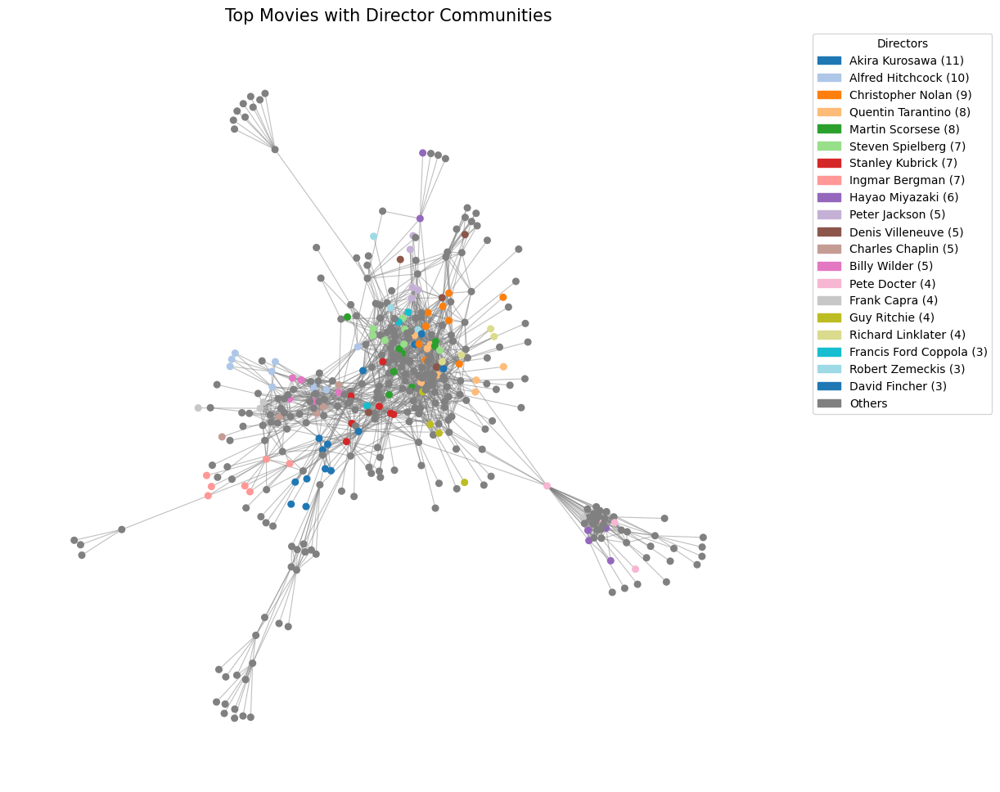

In [21]:
# Get the top 20 directors based on the number of movies (nodes), excluding 'None' or missing directors
top_20_directors = sorted(
    [(director, nodes) for director, nodes in director_partition.items() if director != "None" and director is not None],
    key=lambda x: len(x[1]), reverse=True
)[:20]

# Create a color map for the top 20 directors, excluding the gray color from tab20
tab20_colors = list(plt.cm.tab20.colors)  # Get all 20 colors
tab20_colors.remove(plt.cm.tab20.colors[14])  # Remove the gray color (index 14 in tab20)

# Create a color map for the top 20 directors using the remaining colors
director_to_color = {director: tab20_colors[i % len(tab20_colors)] for i, (director, _) in enumerate(top_20_directors)}

# Add a color for "Others" category using gray
others_color = 'gray'

# Create a list to store the color of each node based on its director
node_colors = []
for node in G.nodes:
    # Find the director of the current node by checking the partition_director dictionary
    assigned_color = others_color  # Default to "Others" for nodes without a top 20 director
    director = None  # Initialize to None (missing director)
    
    # Check the director partition and see if the node has a director
    for dir, nodes in director_partition.items():
        if node in nodes:
            director = dir
            break
    
    if director == "None" or director is None:  # If director is "None" or missing, assign to "Others"
        assigned_color = others_color
    elif director in director_to_color:  # If director is in top 20, assign the corresponding color
        assigned_color = director_to_color[director]
    else:  # If director is not in top 20, assign to "Others"
        assigned_color = others_color

    node_colors.append(assigned_color)

# Plot the graph
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42)  # Layout for consistent positioning

# Draw the edges and nodes
nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.5, width=0.8)
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=30)

# Create a legend for the top 20 directors and "Others"
legend_handles = [
    mpatches.Patch(color=director_to_color[director], label=f"{director} ({len(nodes)})")
    for director, nodes in top_20_directors
]
legend_handles.append(mpatches.Patch(color=others_color, label="Others"))

# Add the legend
plt.legend(handles=legend_handles, title="Directors", bbox_to_anchor=(1.05, 1), loc='upper left')

# Add title
plt.title("Top Movies with Director Communities", fontsize=15)

# Remove axis
plt.axis('off')

# Display the plot
plt.show()


Calculate **modularity** of the director based communities.

In [22]:
# Calculate L (total links) in the entire network
L = G.number_of_edges()

# Calculate modularity using the formula from chapter 9
modularity_director = 0
for community in director_partition.values():
    subgraph = G.subgraph(community)
    
    # L_c: Count of edges within the community
    L_c = subgraph.number_of_edges()
    
    # k_c: Total degree of the nodes in this community
    k_c = sum(deg for node, deg in subgraph.degree())

    # Calculate modularity contribution for this community 
    # (L_C/L is the fraction of edges within the community, and k_c/(2L) is the expected fraction of edges in a random network)
    modularity_director += ((L_c / L) - (k_c / (2 * L)) ** 2)

print("Modularity of the director-based partition:", modularity_director)

Modularity of the director-based partition: 0.11516545791870468


#### Actors partition

In [23]:
# Create a dictionary to hold the partition
actor_partition = {}

# Iterate over nodes in the graph and assign them to communities based on their first actor
for node, data in G.nodes(data=True):
    # Get the 'Actors' attribute and split it into a list, if present
    actors = data.get("Actors", "")  # Default to an empty string if 'Actors' is missing
    actors_list = [g.strip() for g in actors.split(",")] if actors else []  # Split and strip spaces
    
    # Get the first actor, or None if no actors are available
    first_actor = actors_list[0] if actors_list else None
    
    # Add node to the appropriate community in the partition
    if first_actor not in actor_partition:
        actor_partition[first_actor] = []
    actor_partition[first_actor].append(node)

# Output the partition information
print("Total number of actors:", len(actor_partition), "\n")
for actor, nodes in actor_partition.items():
    print(f"{actor}: {len(nodes)} nodes")

Total number of actors: 282 

Tim Robbins: 1 nodes
Christian Bale: 3 nodes
Marlon Brando: 3 nodes
Tom Hanks: 6 nodes
Edward Norton: 2 nodes
Tim Roth: 1 nodes
Leonardo DiCaprio: 5 nodes
Liam Neeson: 1 nodes
Morgan Freeman: 1 nodes
Noel Appleby: 1 nodes
Al Pacino: 3 nodes
Martin Balsam: 1 nodes
Robert De Niro: 6 nodes
Jodie Foster: 1 nodes
Alan Howard: 1 nodes
Keanu Reeves: 1 nodes
Freddie Highmore: 1 nodes
Adrien Brody: 1 nodes
Bruce Allpress: 1 nodes
Mark Hamill: 3 nodes
Ian McKellen: 2 nodes
Michael Berryman: 1 nodes
Jamie Foxx: 2 nodes
Brad Pitt: 1 nodes
Ellen Burstyn: 3 nodes
Hugh Jackman: 4 nodes
Peter Barbour: 1 nodes
Vikrant Massey: 1 nodes
Aamir Khan: 4 nodes
Vijay Sethupathi: 3 nodes
Nitanshi Goel: 1 nodes
Suriya: 2 nodes
Zain Al Rafeea: 1 nodes
Ajay Devgn: 1 nodes
John Goodman: 2 nodes
Roberto Benigni: 1 nodes
Harrison Ford: 4 nodes
Michael J. Fox: 2 nodes
Kamal Haasan: 1 nodes
Karthi: 1 nodes
Dhanush: 1 nodes
Dulquer Salmaan: 1 nodes
Madhavan: 1 nodes
Yash: 1 nodes
Vishnu Vis

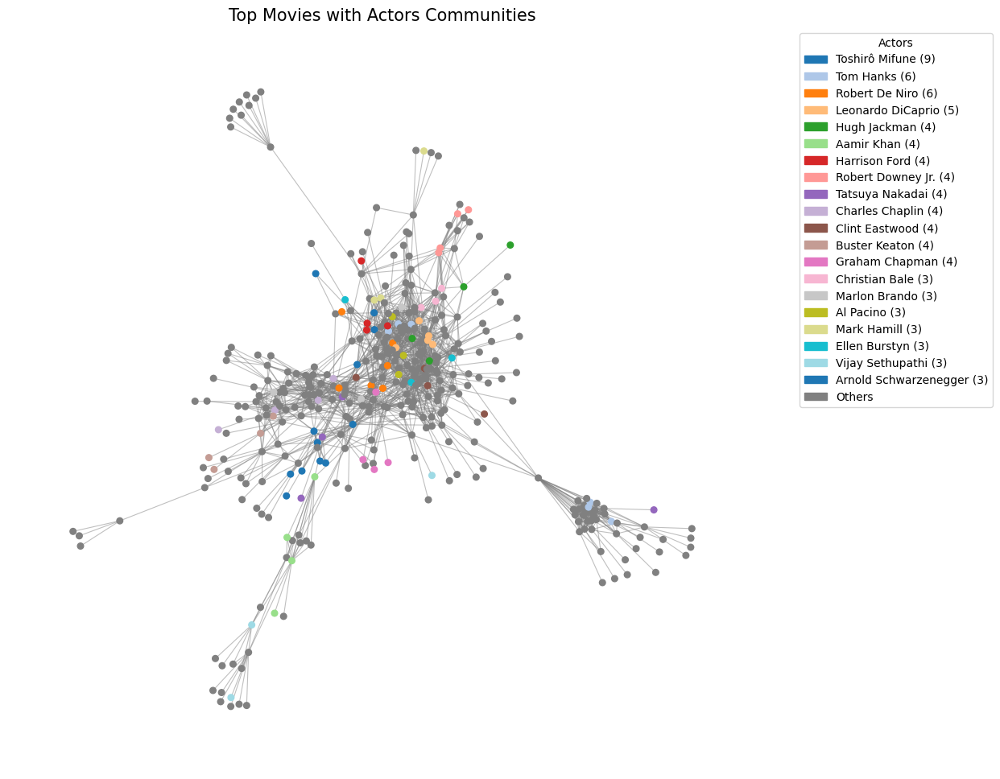

In [24]:
# Get the top 20 directors based on the number of movies (nodes), excluding 'None' or missing directors
top_20_actors = sorted(
    [(actor, nodes) for actor, nodes in actor_partition.items() if actor != "None" and actor is not None],
    key=lambda x: len(x[1]), reverse=True
)[:20]

# Create a color map for the top 20 directors, excluding the gray color from tab20
tab20_colors = list(plt.cm.tab20.colors)  # Get all 20 colors
tab20_colors.remove(plt.cm.tab20.colors[14])  # Remove the gray color (index 14 in tab20)

# Create a color map for the top 20 directors using the remaining colors
actor_to_color = {actor: tab20_colors[i % len(tab20_colors)] for i, (actor, _) in enumerate(top_20_actors)}

# Add a color for "Others" category using gray
others_color = 'gray'

# Create a list to store the color of each node based on its director
node_colors = []
for node in G.nodes:
    # Find the director of the current node by checking the partition_director dictionary
    assigned_color = others_color  # Default to "Others" for nodes without a top 20 director
    actor = None  # Initialize to None (missing director)
    
    # Check the director partition and see if the node has a director
    for dir, nodes in actor_partition.items():
        if node in nodes:
            actor = dir
            break
    
    if actor == "None" or actor is None:  # If director is "None" or missing, assign to "Others"
        assigned_color = others_color
    elif actor in actor_to_color:  # If director is in top 20, assign the corresponding color
        assigned_color = actor_to_color[actor]
    else:  # If director is not in top 20, assign to "Others"
        assigned_color = others_color

    node_colors.append(assigned_color)

# Plot the graph
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42)  # Layout for consistent positioning

# Draw the edges and nodes
nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.5, width=0.8)
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=30)

# Create a legend for the top 20 directors and "Others"
legend_handles = [
    mpatches.Patch(color=actor_to_color[actor], label=f"{actor} ({len(nodes)})")
    for actor, nodes in top_20_actors
]
legend_handles.append(mpatches.Patch(color=others_color, label="Others"))

# Add the legend
plt.legend(handles=legend_handles, title="Actors", bbox_to_anchor=(1.05, 1), loc='upper left')

# Add title
plt.title("Top Movies with Actors Communities", fontsize=15)

# Remove axis
plt.axis('off')

# Display the plot
plt.show()


Calculate **modularity** of actor-based communities.

In [25]:
# Calculate L (total links) in the entire network
L = G.number_of_edges()

# Calculate modularity using the formula from chapter 9
modularity_actor = 0
for community in actor_partition.values():
    subgraph = G.subgraph(community)
    
    # L_c: Count of edges within the community
    L_c = subgraph.number_of_edges()
    
    # k_c: Total degree of the nodes in this community
    k_c = sum(deg for node, deg in subgraph.degree())

    # Calculate modularity contribution for this community 
    # (L_C/L is the fraction of edges within the community, and k_c/(2L) is the expected fraction of edges in a random network)
    modularity_actor += ((L_c / L) - (k_c / (2 * L)) ** 2)

print("Modularity of the actor-based partition:", modularity_actor)

Modularity of the actor-based partition: 0.05436491819868446


#### Louvain partition
Using the Louvain method, we will detect communities within the network, each community representing a cluster of closely related nodes. 

In [26]:
# Compute the Louvain partition
louvain_partition = community_louvain.best_partition(G)

# Group nodes by their assigned community
community_groups = defaultdict(list)
for node, community in louvain_partition.items():
    community_groups[community].append(node)

print("Number of communities:", len(community_groups), "\n")
for community_id, nodes in community_groups.items():
    print(f"Community {community_id}: {len(nodes)} nodes")

Number of communities: 9 

Community 3: 52 nodes
Community 1: 65 nodes
Community 2: 26 nodes
Community 5: 26 nodes
Community 6: 43 nodes
Community 7: 29 nodes
Community 8: 67 nodes
Community 0: 30 nodes
Community 4: 53 nodes


C:\Users\Alba\AppData\Local\Temp\ipykernel_4960\2129060190.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_palette = plt.cm.get_cmap('tab20', num_communities)  # Use 'tab20' for up to 20 colors


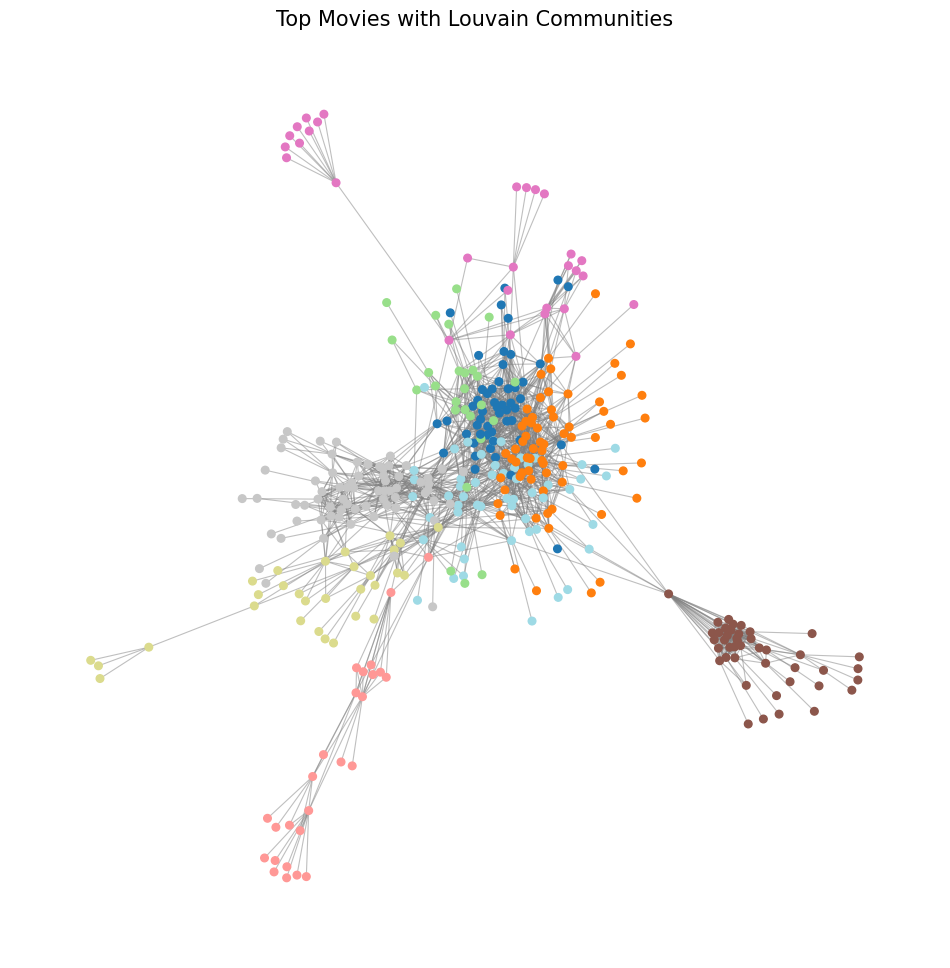

In [27]:
# Assign a unique color to each community
num_communities = len(community_groups)
color_palette = plt.cm.get_cmap('tab20', num_communities)  # Use 'tab20' for up to 20 colors
community_to_color = {community: color_palette(i) for i, community in enumerate(community_groups.keys())}

# Create a list of colors for each node based on its community
node_colors = [community_to_color[louvain_partition[node]] for node in G.nodes]

# Plot the graph with nodes colored by community
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42)  # Layout for consistent positioning

# Draw the edges and nodes
nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.5, width=0.8)
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=30)

# Add a title
plt.title("Top Movies with Louvain Communities", fontsize=15)

# Remove axis
plt.axis('off')

# Display the plot
plt.show()

100%|██████████| 1000/1000 [00:03<00:00, 253.15it/s]


BarnesHut Approximation  took  0.84  seconds
Repulsion forces  took  2.72  seconds
Gravitational forces  took  0.09  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.18  seconds


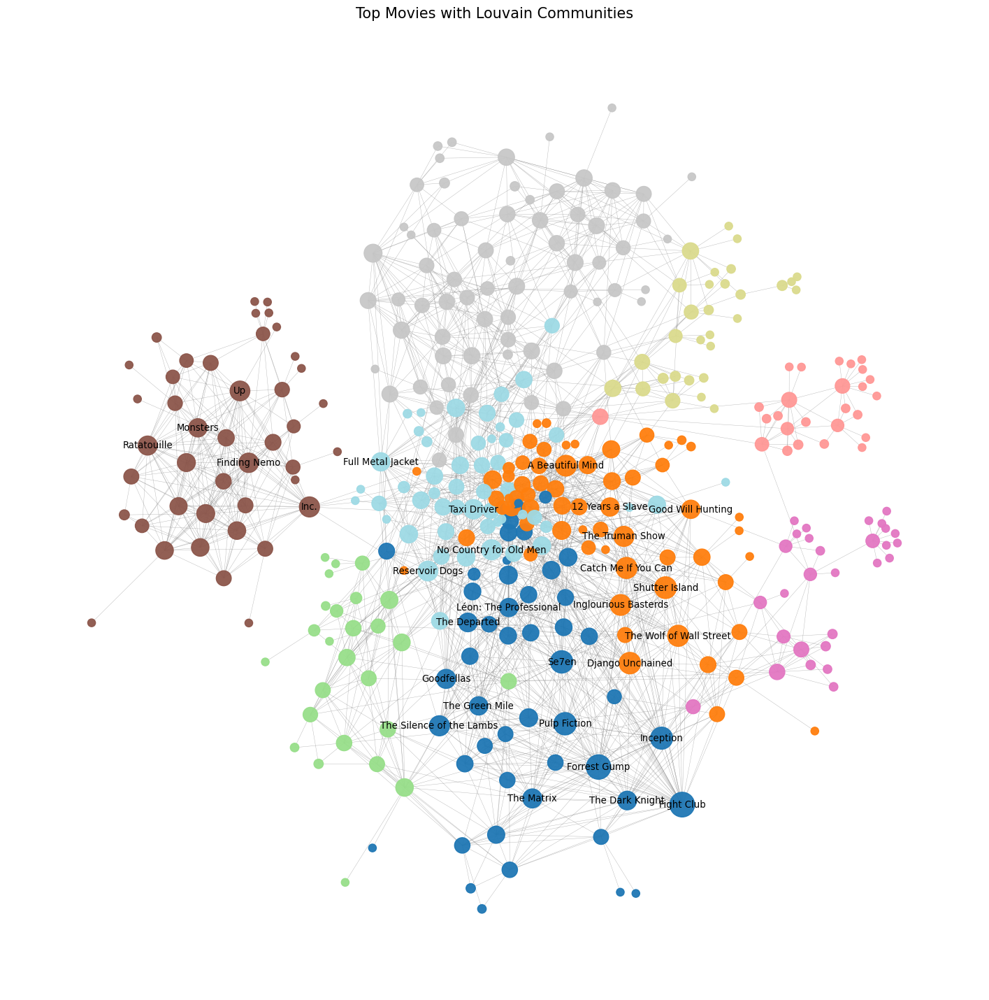

In [28]:

# Use ForceAtlas2 to compute positions
forceatlas2 = ForceAtlas2(
    outboundAttractionDistribution=True,
    linLogMode=False,
    adjustSizes=False,
    edgeWeightInfluence=1.0,
    jitterTolerance=0.5,
    barnesHutOptimize=True,
    barnesHutTheta=1.2,
    multiThreaded=False,
    scalingRatio=7.0,
    strongGravityMode=False,
    gravity=80,
    verbose=True
)

# Set global random seed for reproducibility
random.seed(42)
np.random.seed(42)

positions = forceatlas2.forceatlas2_networkx_layout(G, iterations=1000)

# Plot the graph with node sizes based on degree and community-based colors
plt.figure(figsize=(18, 18))

# Draw nodes with sizes proportional to their degree and community-based colors
nodes = nx.draw_networkx_nodes(
    G,
    pos=positions,
    node_color=node_colors,  # Set node colors based on community
    node_size=node_sizes,  # Set node sizes based on degree
    alpha=0.95
)

# Draw edges with a single color
edges = nx.draw_networkx_edges(
    G,
    pos=positions,
    width=0.3,
    edge_color='gray',
    alpha=0.6
)

# Set the degree threshold for which we will show node labels
degree_threshold = 20  # You can adjust this value

# Get the nodes that exceed the degree threshold
high_degree_nodes = [node for node, degree in node_degrees.items() if degree > degree_threshold]

# Draw labels for the nodes with degree above the threshold
labels = {node: node for node in high_degree_nodes}  # Use node name as label
nx.draw_networkx_labels(
    G,
    pos=positions,
    labels=labels,
    font_size=9.5,
    font_color='black',
    verticalalignment='center'
)

# Title and axis settings
plt.title('Top Movies with Louvain Communities', fontsize=15)
plt.axis('off')
plt.show()

Calculate **modularity** of Louvain communities.

In [29]:
# Calculate modularity for the Louvain partition
modularity_louvain = community_louvain.modularity(louvain_partition, G)
print("Modularity of Louvain partition:", modularity_louvain)

Modularity of Louvain partition: 0.6069376960701636


The nodes in the graph are updated to store metadata fields (e.g., genres, directors, actors, etc.) as **lists instead of strings**. This allows for easier processing and analysis.

In [30]:
# Modify the nodes info to get it as list instead of string
G2 = nx.Graph(G)

# Modify the nodes to have lists of genres and directors
for node in G2.nodes:
    # Get the current node data
    data = G2.nodes[node]
    
    # Get the genres and directors as strings
    genres = data.get("Genres", "")
    directors = data.get("Director", "")
    actors = data.get("Actors", "")
    producers = data.get("Producer", "")
    production_companies = data.get("Production Companies", "")
    
    # Split the strings into lists
    genres_list = [g.strip() for g in genres.split(",")] if genres else []
    directors_list = [d.strip() for d in directors.split(",")] if directors else []
    actors_list = [a.strip() for a in actors.split(",")] if actors else []
    producers_list = [p.strip() for p in producers.split(",")] if producers else []
    production_companies_list = [pc.strip() for pc in production_companies.split(",")] if production_companies else []

    # Update the node data with the lists
    data["Genres"] = genres_list
    data["Director"] = directors_list
    data["Actors"] = actors_list
    data["Producer"] = producers_list
    data["Production Companies"] = production_companies_list

# Check the updated node data for a sample node
sample_node = "A Beautiful Mind"
if sample_node in G2.nodes:
    # Print the metadata of the node in one line each
    for key, value in G2.nodes[sample_node].items():
        print(f"{key}: {value}")

Title: A Beautiful Mind 
Rating: 8.2 
Top 250 Rank: 150 
Duration: 135 
Release Date: 01 Mar 2002 (Denmark) 
Genres: ['Biography', 'Drama', 'Mystery']
Director: ['Ron Howard']
Actors: ['Russell Crowe', 'Ed Harris', 'Jennifer Connelly', 'Christopher Plummer', 'Paul Bettany', 'Adam Goldberg', 'Josh Lucas', 'Anthony Rapp', 'Jason Gray-Stanford', 'Judd Hirsch']
Languages: English 
Description: From the heights of notoriety to the depths of depravity, John Forbes Nash, Jr. experienced it all. A mathematical genius, he made an astonishing discovery early in his career and stood on the brink of international acclaim. But the handsome and arrogant Nash soon found himself on a painful and harrowing journey of self-discovery. After many years of struggle, he eventually triumphed over his tragedy, and finally - late in life - received the Nobel Prize. 
Plot: ['A mathematical genius, John Nash made an astonishing discovery early in his career and stood on the brink of international acclaim. But th

#### Analysis of the top geners, directors, actors and release dates

Check the most common genres across all movies.

In [33]:
# check most common genres taking all into acount and not just the first
all_genres = [genre for data in G2.nodes.values() for genre in data.get("Genres", [])]
common_genres_top = Counter(all_genres).most_common()
print("Most common genres:")
for genre, count in common_genres_top:
    print(f"{genre}: {count}")

Most common genres:
Drama: 274
Action: 98
Thriller: 96
Crime: 86
Adventure: 86
Comedy: 81
Fantasy: 55
Mystery: 55
Animation: 47
Romance: 45
Sci-Fi: 45
Family: 41
Biography: 39
War: 39
History: 17
Sport: 12
Short: 11
Music: 10
Horror: 10
Documentary: 10
Musical: 8
Film-Noir: 8
Western: 6


If we only used the first genre as the main genre of the movie.

In [34]:
# Extract only the first genre from the "Genres" list
first_genres = [data.get("Genres", [None])[0] for data in G2.nodes.values() if data.get("Genres")]

# Count the occurrences of the first genres
common_genres_top2 = Counter(first_genres).most_common()

# Print the most common first genres
print("Most common first genres:")
for genre, count in common_genres_top2:
    print(f"{genre}: {count}")

Most common first genres:
Drama: 99
Action: 78
Crime: 46
Animation: 46
Comedy: 42
Biography: 30
Adventure: 25
Documentary: 10
Short: 7
Mystery: 3
Horror: 3
Film-Noir: 2


Chek most popular actors.

In [35]:
# Create a dictionary to count the number of times each actor has participated in a movie and store movie names
actor_count = {}
actor_movies = {}

# Iterate over nodes in the graph
for node in G2.nodes:
    # Get the actors list for the current node
    actors_list = G2.nodes[node].get("Actors", [])
    
    # Count the participation of each actor and store movie names
    for actor in actors_list:
        if actor not in actor_count:
            actor_count[actor] = 0
            actor_movies[actor] = []
        actor_count[actor] += 1
        actor_movies[actor].append(node)

# Sort actors by the number of movies in descending order
sorted_actors = sorted(actor_count.items(), key=lambda item: item[1], reverse=True)

# Print the top 30 actors with the number of movies and the names of the movies
print("Top 30 Actors with the Number of Movies and Movie Names:\n")
for actor, count in sorted_actors[:30]:
    print(f"{actor}: {count} movies")
    print("Movies:", ", ".join(actor_movies[actor]))
    print()

Top 30 Actors with the Number of Movies and Movie Names:

Robert De Niro: 9 movies
Movies: The Godfather Part II, Goodfellas, Once Upon a Time in America, Taxi Driver, Heat, Casino, Raging Bull, The Deer Hunter, The Irishman

Toshirô Mifune: 9 movies
Movies: Seven Samurai, High and Low, Yojimbo, Rashomon, Red Beard, Sanjuro, Throne of Blood, The Hidden Fortress, Stray Dog

Harrison Ford: 8 movies
Movies: Star Wars: Episode V - The Empire Strikes Back, Star Wars: Episode IV - A New Hope, Star Wars: Episode VI - Return of the Jedi, Star Wars: Episode VII - The Force Awakens, Apocalypse Now, Raiders of the Lost Ark, Indiana Jones and the Last Crusade, Blade Runner

Takashi Shimura: 8 movies
Movies: Seven Samurai, High and Low, Yojimbo, Rashomon, Sanjuro, Throne of Blood, The Hidden Fortress, Stray Dog

Tom Hanks: 7 movies
Movies: Forrest Gump, The Green Mile, Saving Private Ryan, Toy Story, Toy Story 3, Catch Me If You Can, Toy Story 2

Mark Ruffalo: 7 movies
Movies: Shutter Island, Aveng

Find colaborations between actors and directors.

In [36]:
# Create a dictionary to count the number of times each actor has participated in a movie and store movie names
actor_count = {}
actor_movies = {}

# Iterate over nodes in the graph
for node in G2.nodes:
    # Get the actors list for the current node
    actors_list = G2.nodes[node].get("Actors", [])
    
    # Count the participation of each actor and store movie names
    for actor in actors_list:
        if actor not in actor_count:
            actor_count[actor] = 0
            actor_movies[actor] = []
        actor_count[actor] += 1
        actor_movies[actor].append(node)

# Sort actors by the number of movies in descending order
sorted_actors = sorted(actor_count.items(), key=lambda item: item[1], reverse=True)

# Get the top 50 actors
top_50_actors = [actor for actor, count in sorted_actors[:50]]

# Create a dictionary to count collaborations between actors and directors and store movie names
actor_director_collaborations = {}

# Iterate over nodes in the graph to find collaborations for top 50 actors
for node in G2.nodes:
    # Get the actors and directors list for the current node
    actors_list = G2.nodes[node].get("Actors", [])
    directors_list = G2.nodes[node].get("Director", [])
    
    # Count collaborations between actors and directors for top 50 actors and store movie names
    for actor in actors_list:
        if actor in top_50_actors:
            for director in directors_list:
                pair = (actor, director)
                if pair not in actor_director_collaborations:
                    actor_director_collaborations[pair] = {"count": 0, "movies": []}
                actor_director_collaborations[pair]["count"] += 1
                actor_director_collaborations[pair]["movies"].append(node)

# Filter collaborations that are repeated (count > 1)
repeated_collaborations = {pair: info for pair, info in actor_director_collaborations.items() if info["count"] > 1}

# Print repeated collaborations between actors and directors with movie names
print("Repeated Collaborations between Actors and Directors among Top 50 Actors:\n")
for pair, info in repeated_collaborations.items():
    print(f"{pair}: {info['count']} collaborations: {", ".join(info["movies"])}")

Repeated Collaborations between Actors and Directors among Top 50 Actors:

('Christian Bale', 'Christopher Nolan'): 4 collaborations: The Dark Knight, The Dark Knight Rises, Batman Begins, The Prestige
('Michael Caine', 'Christopher Nolan'): 4 collaborations: The Dark Knight, The Dark Knight Rises, Batman Begins, The Prestige
('Gary Oldman', 'Christopher Nolan'): 3 collaborations: The Dark Knight, The Dark Knight Rises, Batman Begins
('Morgan Freeman', 'Christopher Nolan'): 2 collaborations: The Dark Knight, The Dark Knight Rises
('Cillian Murphy', 'Christopher Nolan'): 4 collaborations: The Dark Knight, Inception, Batman Begins, Oppenheimer
('Marlon Brando', 'Francis Ford Coppola'): 2 collaborations: The Godfather, Apocalypse Now
('Al Pacino', 'Francis Ford Coppola'): 2 collaborations: The Godfather, The Godfather Part II
('Robert Duvall', 'Francis Ford Coppola'): 3 collaborations: The Godfather, The Godfather Part II, Apocalypse Now
('Samuel L. Jackson', 'Quentin Tarantino'): 3 colla

Check the release date.

In [37]:
# Extract the year from the release date attribute and check whether movies are from before 2000 or after
before_2000 = 0
after_2000 = 0
years_counter = Counter()

# Initialize variables to store the oldest and newest movies
oldest_movie = None
newest_movie = None
oldest_year = float('inf')
newest_year = float('-inf')

for node in G2.nodes:
    release_date = G2.nodes[node].get("Release Date", "")
    
    # Extract the year using regex
    match = re.search(r'\b(\d{4})\b', release_date)
    if match:
        year = int(match.group(1))
        years_counter[year] += 1
        
        # Check if the movie is before or after 2000
        if year < 2000:
            before_2000 += 1
        else:
            after_2000 += 1

        # Check for the oldest movie
        if year < oldest_year:
            oldest_year = year
            oldest_movie = node
        
        # Check for the newest movie
        if year > newest_year:
            newest_year = year
            newest_movie = node

# Find the top 20 years with the most movies
top_20_years = years_counter.most_common(10)

print(f"Movies before 2000: {before_2000}")
print(f"Movies after 2000: {after_2000}")
print()
print("Top 10 years with the most movies:")
for year, count in top_20_years:
    print(f"{year}: {count} movies")

print()
print(f"The oldest movie is '{oldest_movie}' released in {oldest_year}.")
print(f"The newest movie is '{newest_movie}' released in {newest_year}.")



Movies before 2000: 176
Movies after 2000: 182

Top 10 years with the most movies:
2014: 12 movies
2019: 12 movies
2018: 10 movies
1999: 9 movies
2003: 9 movies
2024: 9 movies
2008: 8 movies
2002: 8 movies
2013: 8 movies
2016: 8 movies

The oldest movie is 'Sherlock Jr.' released in 1924.
The newest movie is 'Maharaja' released in 2024.


#### Confussion matrix
Calculate confussion matrix of genre partition vs Louvain partition.

In [38]:
# Get the 10 most common genres
most_common_genres = sorted(genre_partition.keys(), key=lambda g: len(genre_partition[g]), reverse=True)[:10]

# Get 10 biggest communities
community_count = pd.Series(louvain_partition).value_counts()
most_common_communities = community_count.nlargest(10).index.tolist()

# Confusion matrix
D_matrix = np.zeros((len(most_common_genres), len(most_common_communities)), dtype=int)

for node in G2.nodes():
    # Get the genres directly from the node attributes
    node_genres = G2.nodes[node]['Genres']  # List of genres for the node
    node_community = louvain_partition[node]  # Community ID for the node
    
    # Check if the community is one of the largest ones
    if node_community in most_common_communities:
        community_index = most_common_communities.index(node_community)
        
        # Count all genres of this node
        for genre in node_genres:
            if genre in most_common_genres:
                genre_index = most_common_genres.index(genre)
                D_matrix[genre_index, community_index] += 1  # Increment the count in the matrix

# Display the confusion matrix
D_df = pd.DataFrame(D_matrix, index=most_common_genres, columns=most_common_communities)
print("Confusion Matrix (Genres vs Communities):")
print(D_df)


Confusion Matrix (Genres vs Communities):
              8   1   4   3   6   0   7   2   5
Drama        50  58  36  45  19  29   8   5  24
Action        5  12   8  13   6   4  23  15  12
Crime        12  13  27  17   2   4   2   0   9
Animation     0   3   2   0  24   0  18   0   0
Comedy       16  15  11   3  18   2   3   6   7
Biography     4  15   9   3   5   0   1   0   2
Adventure    10   5   1  10  25   1  16  16   2
Documentary   2   2   3   1   1   0   0   1   0
Short         1   4   3   0   0   1   1   1   0
Mystery      13   8   6   9   5   5   2   2   5


## TF-IDF and wordclouds for genres and communities
First, start with genres.

In [49]:
synopsis = False

# Initialize stop words and lemmatizer
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

genre_text = {}

# Iterate over nodes in the graph and extract text data
for node, data in G2.nodes(data=True):
    genres = data.get("Genres", "")

    metadata_file = os.path.join(metadata_folder, f"{node}.txt")
    
    # If the file doesn't exist, try replacing ":" and "?" with "_"
    if not os.path.exists(metadata_file):
        if node == "Car Crash: Who's Lying?":
            sanitized_node = "Car Crash_ Who's Lying_"
            metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
        else:
            for char in [':', '?', '/']:
                sanitized_node = node.replace(char, '_')
                metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
                if os.path.exists(metadata_file):
                    break
    
    # If the file exists, parse the metadata and add it to the node
    if os.path.exists(metadata_file):
        with open(metadata_file, 'r', encoding='utf-8') as file:
            lines = file.readlines()
            for line in lines:
                if synopsis:
                    synopsis_text = line.strip()
                    synopsis_text = re.sub(r'[^\w\s]', '', synopsis_text) # Remove punctuation
                    synopsis_text = synopsis_text.lower() # Convert to lowercase
                    synopsis_text = re.sub(r"[^a-zA-Z\s]", " ", synopsis_text)  # Remove all non-alphabetic characters
                    synopsis_text = synopsis_text.lower()  # Convert text to lowercase
                    synopsis_text = re.sub(r"\b\w{1,2}\b", "", synopsis_text)  # Remove very short words (1-2 characters)
                    synopsis_text = re.sub(r"\s+", " ", synopsis_text).strip()  # Remove extra whitespace

                    # Remove stop words and lemmatize the words
                    words = word_tokenize(synopsis_text)
                    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]
                    synopsis_text = " ".join(words)

                    # Agregate text for each genre
                    for genre in genres:
                        if genre not in genre_text:
                            genre_text[genre] = ""
                        genre_text[genre] += " " + synopsis_text
                    synopsis = False
                if line.strip().startswith("Synopsis:"):
                    synopsis = True

# Print genre_texts length
print("Genre's text length:")
for genre, text in genre_text.items():
    print(f"{genre}: {len(text)}")

Genre's text length:
Drama: 1152124
Action: 511625
Crime: 400402
Thriller: 461265
Romance: 191158
Adventure: 425361
Sci-Fi: 267288
Biography: 146182
History: 51252
Fantasy: 275649
Mystery: 265446
War: 166266
Music: 23703
Comedy: 333797
Western: 26225
Short: 11
Sport: 34219
Animation: 214528
Family: 198808
Horror: 44063
Musical: 33971
Film-Noir: 47969
Documentary: 6255


In [50]:
# Tokenize the text for each genre
genre_tokens = {genre: word_tokenize(text) for genre, text in genre_text.items()}

# Count the frequency of each word in each genre
genre_word_counts = {genre: Counter(tokens) for genre, tokens in genre_tokens.items()}

In [51]:
# Generate TF list for the top 15 genres
top_genres = sorted(genre_word_counts.keys(), key=lambda x: len(genre_word_counts[x]), reverse=True)[:15]
genre_tf = {genre: {word: count for word, count in genre_word_counts[genre].items()} for genre, tokens in genre_tokens.items() if genre in top_genres}

In [52]:
# log-normalized TF for all the genres
tf_scores = {}
for genre, word_counts in genre_word_counts.items():
    tf_scores[genre] = {}
    for word, count in word_counts.items():
        tf_scores[genre][word] = 1 + math.log(count)

In [53]:
# Calculate the inverse document frequency (IDF) for each word

# Total number of genres
N = len(genre_tf)

# Initialize a Counter to store document frequencies
df_counts = Counter()

# Calculate document frequency for each word
for genre, word_list in genre_tf.items():
    df_counts.update(word_list.keys())

# Calculate IDF for each word
idf_scores = {}
for word, df in df_counts.items():
    idf_scores[word] = math.log(N/df)

In [54]:
# Calculate TF-IDF scores for each word in each genre
tfidf_scores = {}
for genre, word_list in genre_tf.items():
    tfidf_scores[genre] = {word: tf_scores[genre][word] * idf_scores[word] for word in word_list}

In [55]:
# Identify top 10 words based on TF-IDF scores
top_words_tfidf = {}
for genre, scores in tfidf_scores.items():
    # Sort words by TF-IDF score and get the top 10
    top_words = sorted(scores.items(), key=lambda x: x[1], reverse=True)[:10]
    top_words_tfidf[genre] = top_words

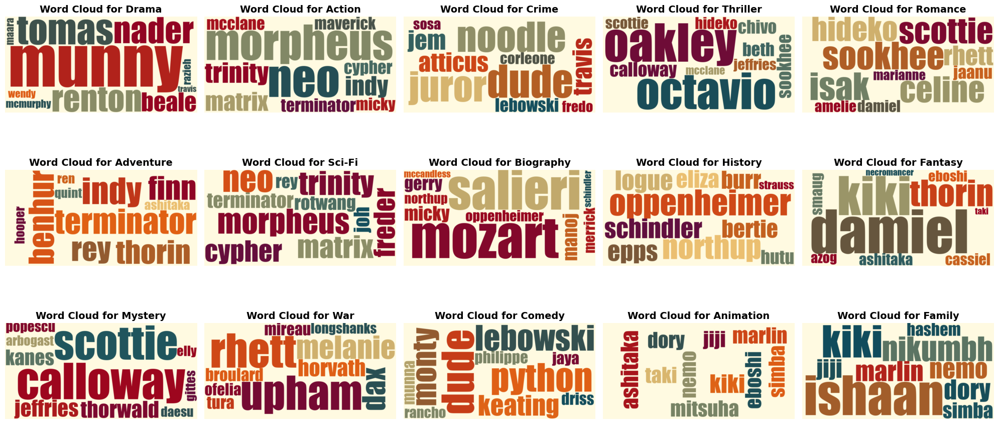

In [56]:
# Number of genres
num_genres = len(top_words_tfidf)

# Determine the number of rows and columns for the subplots
cols = 5
rows = (num_genres + cols - 1) // cols  # Proper ceiling division

# Create a figure and a set of subplots
fig, axs = plt.subplots(rows, cols, figsize=(20, 10))

# Flatten the axs array for easy iteration
axs = axs.flatten()

# Define custom colors
cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#5F0F40", "#9A031E", "#E36414", "#0F4C5C", "#EEC170"])

# Generate word clouds
for i, (genre, top_words) in enumerate(top_words_tfidf.items()):
    # Prepare a single string with each word repeated according to its TF-IDF score
    wordcloud_input = ' '.join([word for word, score in top_words for _ in range(int(score))])
    
    # Create the word cloud with custom font, color map, and background
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='#FFFAE1',
        colormap=cmap,
        font_path='C:/Users/nerea/Documents/MasterDTU/SocialGraphs_fall24/Projects/socialGraphs_fall24/impact.ttf',  # Replace with a path to a custom font (optional)
        collocations=False
    ).generate(wordcloud_input)
    
    # Display the word cloud
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')
    axs[i].set_title(f"Word Cloud for {genre}", fontsize=14, fontweight='bold')

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

Now with the Louvain communities.

In [57]:
synopsis = False

# Initialize stop words and lemmatizer
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

community_text = {}

# Iterate over nodes in the graph and extract text data
for community_id, nodes in community_groups.items():
    community_text[community_id] = ""

    for node in nodes:
        metadata_file = os.path.join(metadata_folder, f"{node}.txt")
        
        # If the file doesn't exist, try replacing ":" and "?" with "_"
        if not os.path.exists(metadata_file):
            if node == "Car Crash: Who's Lying?":
                sanitized_node = "Car Crash_ Who's Lying_"
                metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
            else:
                for char in [':', '?']:
                    sanitized_node = node.replace(char, '_')
                    metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
                    if os.path.exists(metadata_file):
                        break
        
        # If the file exists, parse the metadata and add it to the node
        if os.path.exists(metadata_file):
            with open(metadata_file, 'r', encoding='utf-8') as file:
                lines = file.readlines()
                for line in lines:
                    if synopsis:
                        synopsis_text = line.strip()
                        synopsis_text = re.sub(r'[^\w\s]', '', synopsis_text) # Remove punctuation
                        synopsis_text = synopsis_text.lower() # Convert to lowercase
                        synopsis_text = re.sub(r"[^a-zA-Z\s]", " ", synopsis_text)  # Remove all non-alphabetic characters
                        synopsis_text = synopsis_text.lower()  # Convert text to lowercase
                        synopsis_text = re.sub(r"\b\w{1,2}\b", "", synopsis_text)  # Remove very short words (1-2 characters)
                        synopsis_text = re.sub(r"\s+", " ", synopsis_text).strip()  # Remove extra whitespace

                        # Remove stop words and lemmatize the words
                        words = word_tokenize(synopsis_text)
                        words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]
                        synopsis_text = " ".join(words)

                        # Agregate text for each community
                        community_text[community_id] += " " + synopsis_text
                        synopsis = False
                    elif line.strip().startswith("Synopsis:"):
                        synopsis = True

print("Community's text length:")
for community, text in community_text.items():
    print(f"{community}: {len(text)}")

Community's text length:
0: 336267
1: 112657
2: 149113
3: 266304
4: 82266
5: 198810
6: 277692
7: 66469
8: 187323


In [58]:
# Tokenize the text for each community
community_tokens = {community: word_tokenize(text) for community, text in community_text.items()}
community_word_counts = {community: Counter(tokens) for community, tokens in community_tokens.items()}
community_word_counts = {community: {word: count for word, count in counts.items() if count >= 5} for community, counts in community_word_counts.items()}

In [59]:
comunity_tf = {community: {word: count for word, count in counts.items()} for community, counts in community_word_counts.items()}

In [60]:
# log-normalize Tf for all the communities
tf_scores = {}
for community, word_list in comunity_tf.items():
    tf_scores[community] = {}  # Initialize an empty dictionary for each community
    for word, count in word_list.items():
        tf_scores[community][word] = 1 + math.log(count)

In [61]:
# Calculate the inverse document frequency (IDF) for each word
N = len(comunity_tf)  # Total number of communities
df_counts = Counter()  # Initialize a Counter to store document frequencies

# Calculate document frequency for each word
for community, word_list in comunity_tf.items():
    df_counts.update(word_list.keys())

# Calculate IDF for each word
idf_scores = {}
for word, df in df_counts.items():
    idf_scores[word] = math.log(N / df)

# Calculate TF-IDF scores for each word in each community
tfidf_scores = {}
for community, word_list in comunity_tf.items():
    tfidf_scores[community] = {word: tf_scores[community][word] * idf_scores[word] for word in word_list}

# Print the TF-IDF scores for the communities
# for community, scores in tfidf_scores.items():
    # print(f"TF-IDF scores for {community}:")
    # for word, score in scores.items():
        # print(f"{word}: {score:.4f}")
    # print("\n")

In [62]:
top_words_tfidf = {}
for community, scores in tfidf_scores.items():
    # Sort words by TF-IDF score and get the top 10
    top_words = sorted(scores.items(), key=lambda x: x[1], reverse=True)[:10]
    top_words_tfidf[community] = top_words

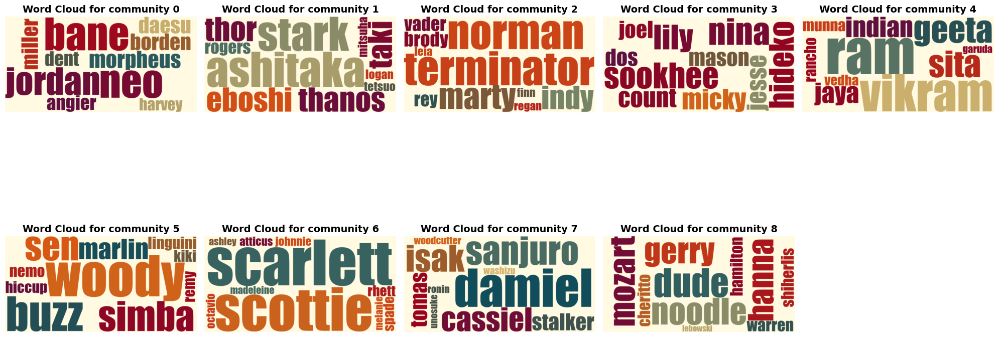

In [63]:

# Number of genres
num_communities = len(top_words_tfidf)

# Determine the number of rows and columns for the subplots
cols = 5
rows = (num_communities + cols - 1) // cols  # Proper ceiling division

# Create a figure and a set of subplots
fig, axs = plt.subplots(rows, cols, figsize=(20, 10))

# Flatten the axs array for easy iteration
axs = axs.flatten()

# Define custom colors
cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#5F0F40", "#9A031E", "#E36414", "#0F4C5C", "#EEC170"])

# Generate word clouds
for i, (community, top_words) in enumerate(top_words_tfidf.items()):
    # Prepare a single string with each word repeated according to its TF-IDF score
    wordcloud_input = ' '.join([word for word, score in top_words for _ in range(int(score))])
    
    # Create the word cloud with custom font, color map, and background
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='#FFFAE1',
        colormap=cmap,
        font_path='C:/Users/nerea/Documents/MasterDTU/SocialGraphs_fall24/Projects/socialGraphs_fall24/impact.ttf',  # Replace with a path to a custom font (optional)
        collocations=False
    ).generate(wordcloud_input)
    
    # Display the word cloud
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')
    axs[i].set_title(f"Word Cloud for community {community}", fontsize=14, fontweight='bold')

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

### Sentiment Analysis

A function is created to calculate the sentiment of a list of tokens (each movie synopsis).

In [123]:
# Function to calculate the sentiment of a list of tokens
def calculate_sentiment(tokens, labmt_dict, movie_name):
    """
    Calculate the sentiment of a list of tokens based on the LabMT word list.

    Parameters:
    tokens (list of str): List of tokens to analyze.
    labmt_dict (dict): Dictionary with words as keys and happiness scores as values.

    Returns:
    average_happiness (float): Average happiness score of the tokens.
    """
    # Filter tokens that are in the LabMT word list
    valid_tokens = [token for token in tokens if token in labmt_dict]
    
    # Calculate the average happiness score
    if valid_tokens:
        happiness_scores = [labmt_dict[token] for token in valid_tokens]
        average_happiness = sum(happiness_scores) / len(happiness_scores)
        return average_happiness
    else:
        print(f"No valid tokens found for artist: {movie_name}")
        return None  # Return None if no valid tokens are found

In [124]:
# Load the LabMT word list
filepath = "Data_Set_S1.txt"

labmt_dict = {}
with open(filepath, 'r') as file:
    # Skip the header lines
    next(file)
    next(file)
    
    for line in file:
        parts = line.strip().split('\t')
        if len(parts) > 2 and parts[2] != 'happiness_average':
            try:
                word = parts[0]
                happiness_score = float(parts[2])
                labmt_dict[word] = happiness_score
            except ValueError:
                continue

The sentiment score is calculated for each movie.

In [127]:
# Path to the folder containing Wikipedia text files
movies_folder = "top_net_movies_info"

stop_words = set(stopwords.words('english'))

# Function to extract the synopsis from a file
def extract_synopsis(file_path):
    with open(file_path, 'r', encoding='utf-8') as file:
        content = file.read()

    # Use a regular expression to extract the synopsis (assuming it's between "Synopsis:" and "]")
    match = re.search(r'Synopsis:\s*\[(.*?)\]', content, re.DOTALL)
    if match:
        synopsis = match.group(1)
        return synopsis
    else:
        return ""

# Calculate sentiment scores for the network
for node in G2.nodes():
    movie_title = node.replace(":", "_").replace("?", "_").replace("/", "_")
    movie_file_path = os.path.join(movies_folder, f"{movie_title}.txt")
    synopsis = extract_synopsis(movie_file_path)
    tokens = word_tokenize(synopsis.lower()) # Convert tokens to lowercase
    tokens = [token for token in tokens if token.isalpha() and token not in stop_words] # Remove non-alphabetic tokens and stopwords
    sentiment = calculate_sentiment(tokens, labmt_dict, movie_title)
    G2.nodes[node]["Sentiment"] = sentiment
    

No valid tokens found for artist: The Good
No valid tokens found for artist: Star Wars_ Episode IV - A New Hope
No valid tokens found for artist: Maharaja
No valid tokens found for artist: Capernaum
No valid tokens found for artist: Spirited Away_ Live on Stage
No valid tokens found for artist: Monsters
No valid tokens found for artist: Rogue One_ A Star Wars Story
No valid tokens found for artist: Modern Times
No valid tokens found for artist: Dune
No valid tokens found for artist: Manjummel Boys
No valid tokens found for artist: Momento
No valid tokens found for artist: Come and See
No valid tokens found for artist: A Silent Voice_ The Movie
No valid tokens found for artist: Death Note
No valid tokens found for artist: Demon Slayer_ Kimetsu no Yaiba - The Movie_ Mugen Train
No valid tokens found for artist: The Killing
No valid tokens found for artist: Spartacus
No valid tokens found for artist: The Hidden Fortress
No valid tokens found for artist: Stray Dog
No valid tokens found for

In [129]:
# Calculate statistics
sentiment_scores = [data['Sentiment'] for _, data in G2.nodes(data=True) if 'Sentiment' in data and data['Sentiment'] is not None]

average_sentiment = np.mean(sentiment_scores)
median_sentiment = np.median(sentiment_scores)
variance_sentiment = np.var(sentiment_scores)
percentile_25_sentiment = np.percentile(sentiment_scores, 25)
percentile_75_sentiment = np.percentile(sentiment_scores, 75)

# Print statistics
print(f"Average sentiment score: {average_sentiment}")
print(f"Median sentiment score: {median_sentiment}")
print(f"Sentiment score variance: {variance_sentiment}")
print(f"25th percentile sentiment score: {percentile_25_sentiment}")
print(f"75th percentile sentiment score: {percentile_75_sentiment}")

Average sentiment score: 5.477085495074458
Median sentiment score: 5.469600828375567
Sentiment score variance: 0.03880982025435039
25th percentile sentiment score: 5.34571607981681
75th percentile sentiment score: 5.603551829268293


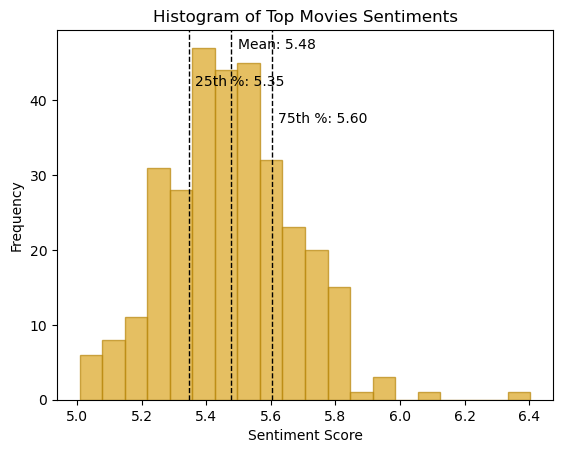

In [137]:
# Plot the histogram of sentiment scores
plt.hist(sentiment_scores, bins=20, alpha=0.7, color='goldenrod', edgecolor='darkgoldenrod')

# Add vertical lines for the mean, median, 25th percentile, and 75th percentile    
plt.axvline(average_sentiment, color='black', linestyle='dashed', linewidth=1)
plt.axvline(percentile_25_sentiment, color='black', linestyle='dashed', linewidth=1)
plt.axvline(percentile_75_sentiment, color='black', linestyle='dashed', linewidth=1)

plt.text(average_sentiment+ 0.02, plt.ylim()[1]*0.95, f"Mean: {average_sentiment:.2f}", color='black')
plt.text(percentile_25_sentiment+ 0.02, plt.ylim()[1]*0.85, f"25th %: {percentile_25_sentiment:.2f}", color='black')
plt.text(percentile_75_sentiment+ 0.02, plt.ylim()[1]*0.75, f"75th %: {percentile_75_sentiment:.2f}", color='black')

plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.title('Histogram of Top Movies Sentiments')

plt.show()

For further analysis, we identify the top happiest and saddest synopsis by collecting and sorting their sentiment scores.

In [139]:
# Collect sentiment scores and corresponding movies names
movie_sentiment = {
    node: data['Sentiment']
    for node, data in G2.nodes(data=True) if 'Sentiment' in data
}

# Convert to a list of tuples for sorting
sentiment_list = [(movie, score) for movie, score in movie_sentiment.items() if score is not None]

# Sort by sentiment scores (happiest first)
sorted_sentiment = sorted(sentiment_list, key=lambda x: x[1], reverse=True)

# Get the top 10 happiest
happiest_movies = sorted_sentiment[:10]

# Get the top 10 saddest
saddest_movies = sorted_sentiment[-10:][::-1]

# Display results
print("Top 10 Happiest Movies:")
for artist, score in happiest_movies:
    print(f"{artist}: {score:.3f}")

print("\nTop 10 Saddest Movies:")
for artist, score in saddest_movies:
    print(f"{artist}: {score:.3f}")

Top 10 Happiest Movies:
Mary Poppins: 6.404
Little Luis: 6.114
Hachi-ko: 5.980
English Vinglish: 5.935
Klaus: 5.923
The Sound of Music: 5.898
Like Stars on Earth: 5.838
Hachi: A Dog's Tale: 5.831
Before Sunset: 5.829
City Lights: 5.824

Top 10 Saddest Movies:
Vikram: 5.008
Three Billboards Outside Ebbing, Missouri: 5.010
Missouri: 5.010
Three Billboards Outside Ebbing: 5.010
Vikram Vedha: 5.010
Harry Potter and the Deathly Hallows: Part 2: 5.030
Jai Bhim: 5.089
The Usual Suspects: 5.093
Platoon: 5.093
The Hateful Eight: 5.114


## BOTTOM MOVIES!
In the top movies the directed network was D and the undirected was G. 
In the bottom movies, the digraph is called K and the undirected graph is called M.

In [39]:
# Load the CSV file into a DataFrame
df = pd.read_csv('bottom_movie_data_with_similar.csv')

# Create an empty directed graph
K1 = nx.DiGraph()

# Add nodes and edges based on the similarity list
for index, row in df.iterrows():
    film = row['Name']
    similar_films = row['Similar Movies'].split(', ')  # Splitting the similar films into a list
    
    # Add the film as a node (it will be added automatically when creating edges)
    K1.add_node(film)
    
    # Add edges between the film and its similar films
    for similar_film in similar_films:
        K1.add_edge(film, similar_film)

# Delete self-loops
self_loops = list(nx.selfloop_edges(K1))
K1.remove_edges_from(self_loops)

# Num of nodes and edges
print("Number of nodes:", K1.number_of_nodes())
print("Number of edges:", K1.number_of_edges())


Number of nodes: 1762
Number of edges: 2911


Add metadata to each node as attribute.

In [40]:
# Folder containing the text files
metadata_folder = 'bottom_net_movies_info'

# Function to parse a metadata text file and exclude the "Synopsis" field
def parse_metadata(file_path):
    metadata = {}
    with open(file_path, 'r', encoding='utf-8') as file:
        lines = file.readlines()
        key = None
        for line in lines:
            line = line.strip()
            if line.endswith(':'):
                key = line[:-1]  # Remove the colon
                if key == 'Synopsis':  # Skip "Synopsis"
                    key = None
                else:
                    metadata[key] = ''
            elif key:  # Append the value to the current key
                metadata[key] += (' ' + line if metadata[key] else line)
    return metadata

# Add metadata to the nodes in the graph
for node in K1.nodes():
    # First, assume the filename matches the node title directly
    metadata_file = os.path.join(metadata_folder, f"{node}.txt")
    
    # If the file doesn't exist, try replacing ":", "?" and "/" with "_"
    if not os.path.exists(metadata_file):
        if node == "Naked Gun 33 1/3: The Final Insult":
            sanitized_node = "Naked Gun 33 1_3_ The Final Insult"
            metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
        elif node == "The Room Actors: Where Are They Now?":
            sanitized_node = "The Room Actors_ Where Are They Now_"
            metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
        elif node == "Enes Batur: Imagination or Reality?":
            sanitized_node = "Enes Batur_ Imagination or Reality_"
            metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
        else:
            for char in [':', '?', '/']:
                sanitized_node = node.replace(char, '_')
                metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
                if os.path.exists(metadata_file):
                    break
    
    # If the file exists, parse the metadata and add it to the node
    if os.path.exists(metadata_file):
        metadata = parse_metadata(metadata_file)
        nx.set_node_attributes(K1, {node: metadata})
    else:
        print(f"Metadata file not found for {node}")

In [41]:
# Check attributes of a specific node
sample_node = "Smolensk"
if sample_node in K1.nodes:
    # Print the metadata of the node in one line each
    for key, value in K1.nodes[sample_node].items():
        print(f"{key}: {value}")

Title: Smolensk 
Rating: 1.2 
Top 250 Rank: N/A 
Duration: 120 
Release Date: 09 Sep 2016 (Poland) 
Genres: Drama, Thriller 
Director: Antoni Krauze 
Actors: Beata Fido, Maciej Póltorak, Aldona Struzik, Lech Lotocki, Redbad Klynstra, Jerzy Zelnik, Halina Labonarska, Dominika Figurska, Maciej Góraj, Marek Probosz 
Languages: Polish, English 
Description: Inspired by true events of 2010 Polish Air Force Tu-154 mysterious crash in Smolensk, the film tells the fictional story of various people affected by the tragedy. The protagonist is a journalist Nina, who refuses to accept the official version of the story and pursues her own independent investigation. 
Plot: ["An inspired story of people affected by the 2010 crash of Polish Air Force Flight 101 in Smolensk, Russia. Fiery reporter Nina won't accept the story she's been given and is determined to find the truth.", 'Inspired by true events of 2010 Polish Air Force Tu-154 mysterious crash in Smolensk, the film tells the fictional story of

Keep only movies with a **rating lower than 5**. This will help expand the network and increase connectivity, as the bottom 250 movies start at a maximum rating of 4.8.

In [42]:
# Take only the movies with less than 5 rating for the network and remove the rest
nodes_to_remove = []

for node in K1.nodes():
    if 'Rating' in K1.nodes[node]:
        rating = K1.nodes[node]['Rating']
        if rating:
            if rating == 'N/A ':
                nodes_to_remove.append(node)
            else:
                rating = float(rating)
                if rating > 5:
                    nodes_to_remove.append(node)

K2 = K1.copy()
K2.remove_nodes_from(nodes_to_remove)
print("Number of nodes after removing:", K2.number_of_nodes())
print("Number of edges after removing:", K2.number_of_edges())

Number of nodes after removing: 640
Number of edges after removing: 1396


Keep only the largest connected component.

Number of nodes: 243
Number of edges: 912


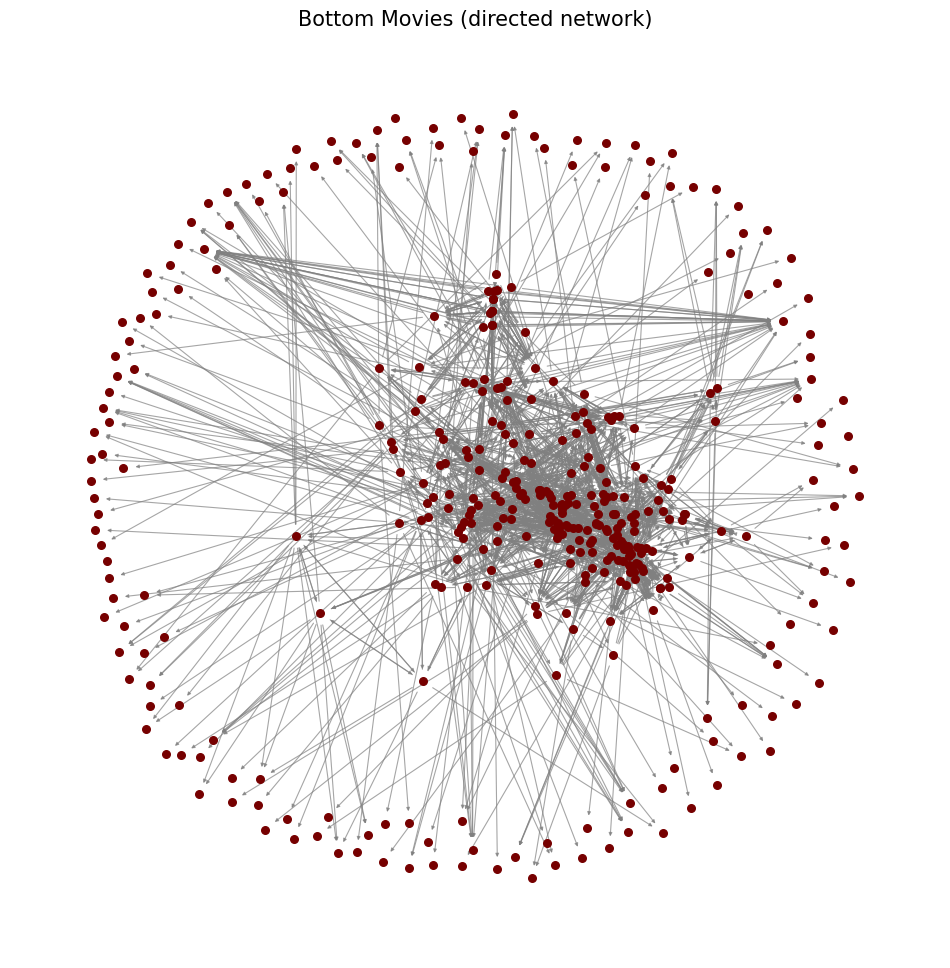

In [43]:
# Take the largest connected component
largest_cc = max(nx.weakly_connected_components(K2), key=len)
K = K2.subgraph(largest_cc)

# Num of nodes and edges
print("Number of nodes:", K.number_of_nodes())
print("Number of edges:", K.number_of_edges())

# Plot the graph
plt.figure(figsize=(12, 12))

# Positions for nodes
pos = nx.spring_layout(D2, seed=42)  # Layout for consistent

# Draw edges and nodes
nx.draw_networkx_edges(D2, pos, edge_color='gray', alpha=0.7, width=0.8, arrowsize=5)
nx.draw_networkx_nodes(D2, pos, node_color='#760000', node_size=30)

plt.title('Bottom Movies (directed network)', fontsize=15)
plt.axis('off')
plt.show()

Save all node names in a txt.

<div class="alert alert-warning">
DONT RUN AGAIN!
</div>

In [127]:
# Save node names to a text file
node_names = list(K.nodes)
with open('bottom_net_movies_titles.txt', 'w') as file:
    for node in node_names:
        file.write(f"{node}\n")

print(f"Node names have been saved.")

Node names have been saved.


### Distributions
Calculate in degree and out degree distributions.

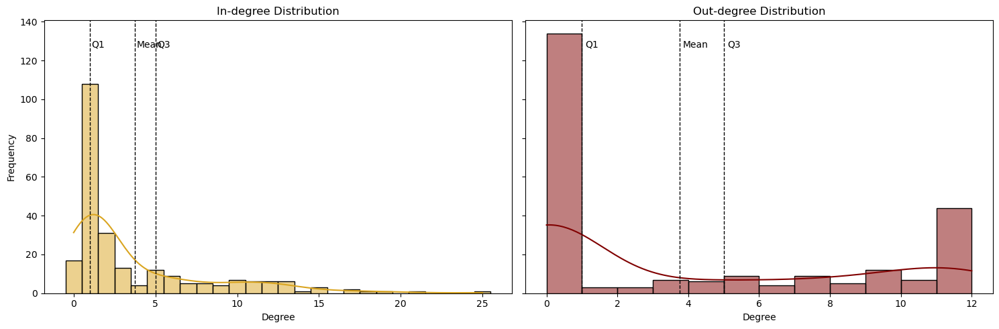

In [48]:
# Get the in-degree and out-degree for each node
in_degrees = [d for n, d in K.in_degree()]
out_degrees = [d for n, d in K.out_degree()]

# Create a pandas Series from the degree lists
in_degree_series = pd.Series(in_degrees)
out_degree_series = pd.Series(out_degrees)

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), sharey=True)

# Define bin width and range
binwidth = 1
binrange = (min(in_degrees) - 0.5, max(in_degrees) + 0.5)

# Plot the in-degree distribution as a histogram in the first subplot
sns.histplot(in_degree_series, color='goldenrod', kde=True, ax=ax1, binwidth=binwidth, binrange=binrange)
ax1.set_title("In-degree Distribution")
ax1.set_xlabel("Degree")
ax1.set_ylabel("Frequency")

# Plot the out-degree distribution as a histogram in the second subplot
sns.histplot(out_degree_series, color='maroon', kde=True, ax=ax2, binwidth=binwidth)
ax2.set_title("Out-degree Distribution")
ax2.set_xlabel("Degree")
ax2.set_ylabel("Frequency")

# plot lines showing the quartiles and the mean with new colors
for ax in [ax1, ax2]:
    mean_line = ax.axvline(in_degree_series.mean(), color='black', linestyle='dashed', linewidth=1)  # Mean
    q1_line = ax.axvline(in_degree_series.quantile(0.25), color='black', linestyle='dashed', linewidth=1)  # Quartile 1
    q3_line = ax.axvline(in_degree_series.quantile(0.75), color='black', linestyle='dashed', linewidth=1)  # Quartile 3
    
    # Annotate the lines
    ax.text(in_degree_series.mean() + 0.1, ax.get_ylim()[1]*0.9, 'Mean', color='black', fontsize=10)
    ax.text(in_degree_series.quantile(0.25) + 0.1, ax.get_ylim()[1]*0.9, 'Q1', color='black', fontsize=10)
    ax.text(in_degree_series.quantile(0.75) + 0.1, ax.get_ylim()[1]*0.9, 'Q3', color='black', fontsize=10)

# Display the plot
plt.tight_layout()
plt.show()

Print top 10 in and in and out-degree movies.

In [ ]:
# Top 10 nodes with highest in-degree with its genre and rating
in_degrees = dict(K.in_degree())
top_10_indegree = sorted(in_degrees.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 nodes with highest in-degree:")
for node, indegree in top_10_indegree:
    print(f"{node} (In-degree: {indegree})")
    print(f"    Genres: {K.nodes[node].get('Genres')}")
    print(f"    Rating: {K.nodes[node].get('Rating')}")
    print(F"    Director: {K.nodes[node].get('Director')}")
    print(F"    Cast: {K.nodes[node].get('Actors')}")

Top 10 nodes with highest in-degree:
Daniel the Wizard (In-degree: 25)
    Genres: Comedy, Crime, Fantasy, Music 
    Rating: 1.2 
    Director: Ulli Lommel 
    Cast: Daniel Küblböck, Ulli Lommel, Rudolf Waldemar Brem, Katja Rupé, Günther Küblböck, Peter Schamoni, Adele Eden, Oliver Möller, Marina Lommel, Roger Fritz 
From Justin to Kelly (In-degree: 21)
    Genres: Comedy, Music, Musical, Romance 
    Rating: 1.9 
    Director: Robert Iscove 
    Cast: Kelly Clarkson, Justin Guarini, Katherine Bailess, Anika Noni Rose, Gregory Siff, Brian Dietzen, Jason Yribar, Theresa San-Nicolas, Justin Gorence, Christopher Bryan 
Pledge This! (In-degree: 19)
    Genres: Comedy 
    Rating: 1.7 
    Director: William Heins, Strathford Hamilton 
    Cast: Paris Hilton, Paula Garcés, Sarah Carter, Simon Rex, Geoffrey Arend, Alexis Thorpe, Bianca Lawson, Noureen DeWulf, Kerri Kenney, Amanda Aday 
Cosmic Sin (In-degree: 18)
    Genres: Action, Sci-Fi 
    Rating: 2.5 
    Director: Edward Drake 
    Ca

In [52]:
# Top 10 nodes with highest out-degree with its genre and rating
out_degrees = dict(K.out_degree())
top_10_outdegree = sorted(out_degrees.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 nodes with highest out-degree:")
for node, outdegree in top_10_outdegree:
    print(f"{node} (Out-degree: {outdegree})")
    print(f"    Genres: {K.nodes[node].get('Genres')}")
    print(f"    Rating: {K.nodes[node].get('Rating')}")
    print(F"    Director: {K.nodes[node].get('Director')}")
    print(F"    Cast: {K.nodes[node].get('Actors')}")

Top 10 nodes with highest out-degree:
Enes Batur: Imagination or Reality? (Out-degree: 12)
    Genres: Comedy 
    Rating: 2.0 
    Director: Kamil Cetin 
    Cast: Enes Batur, Baran Teyin, Egemen Erturk, Mete Güler, Bilal Hanci, Kerem Doker, Swaggybark, Atakan Özyurt, Fatih Yasin, Ceyda Düvenci 
I Know Who Killed Me (Out-degree: 12)
    Genres: Horror, Mystery, Thriller 
    Rating: 3.6 
    Director: Chris Sivertson 
    Cast: Bonnie Aarons, Michael Adler, Garcelle Beauvais, Art Bell, Stacy Daniel, Michael Esparza, David Figlioli, Amy Fuehrer, Jane Galloway Heitz, Spencer Garrett 
Pledge This! (Out-degree: 12)
    Genres: Comedy 
    Rating: 1.7 
    Director: William Heins, Strathford Hamilton 
    Cast: Paris Hilton, Paula Garcés, Sarah Carter, Simon Rex, Geoffrey Arend, Alexis Thorpe, Bianca Lawson, Noureen DeWulf, Kerri Kenney, Amanda Aday 
Left Behind (Out-degree: 12)
    Genres: Action, Fantasy, Sci-Fi, Thriller 
    Rating: 3.1 
    Director: Vic Armstrong 
    Cast: Nicolas C

### Communities
Make the network undirected for the following analysis.

Number of nodes: 243
Number of edges: 636


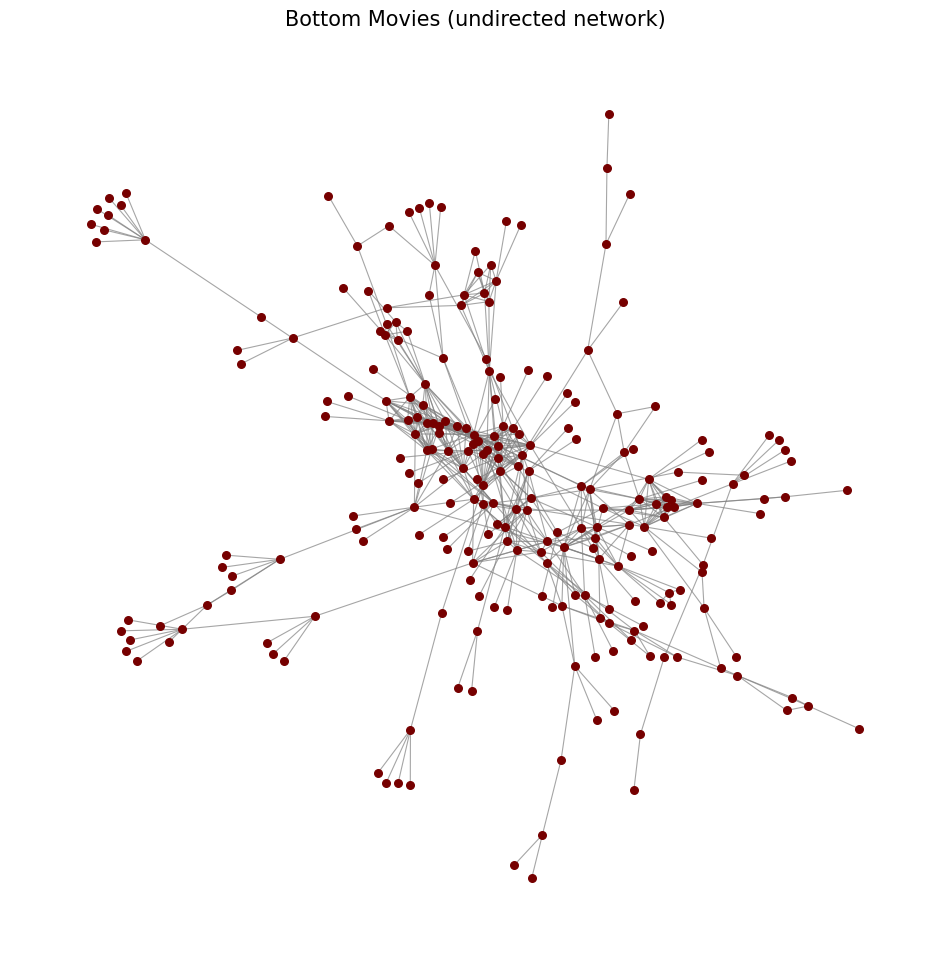

In [53]:
# Make undirected graph
M = K.to_undirected()

# Num of nodes and edges
print("Number of nodes:", M.number_of_nodes())
print("Number of edges:", M.number_of_edges())

# Plot the graph
plt.figure(figsize=(12, 12))

# Positions for nodes
pos = nx.spring_layout(M, seed=42)  # Layout for consistent

# Draw edges and nodes
nx.draw_networkx_edges(M, pos, edge_color='gray', alpha=0.7, width=0.8)
nx.draw_networkx_nodes(M, pos, node_color='#760000', node_size=30)

plt.title('Bottom Movies (undirected network)', fontsize=15)
plt.axis('off')
plt.show()

100%|██████████| 1000/1000 [00:02<00:00, 441.84it/s]


BarnesHut Approximation  took  0.40  seconds
Repulsion forces  took  1.69  seconds
Gravitational forces  took  0.02  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.07  seconds


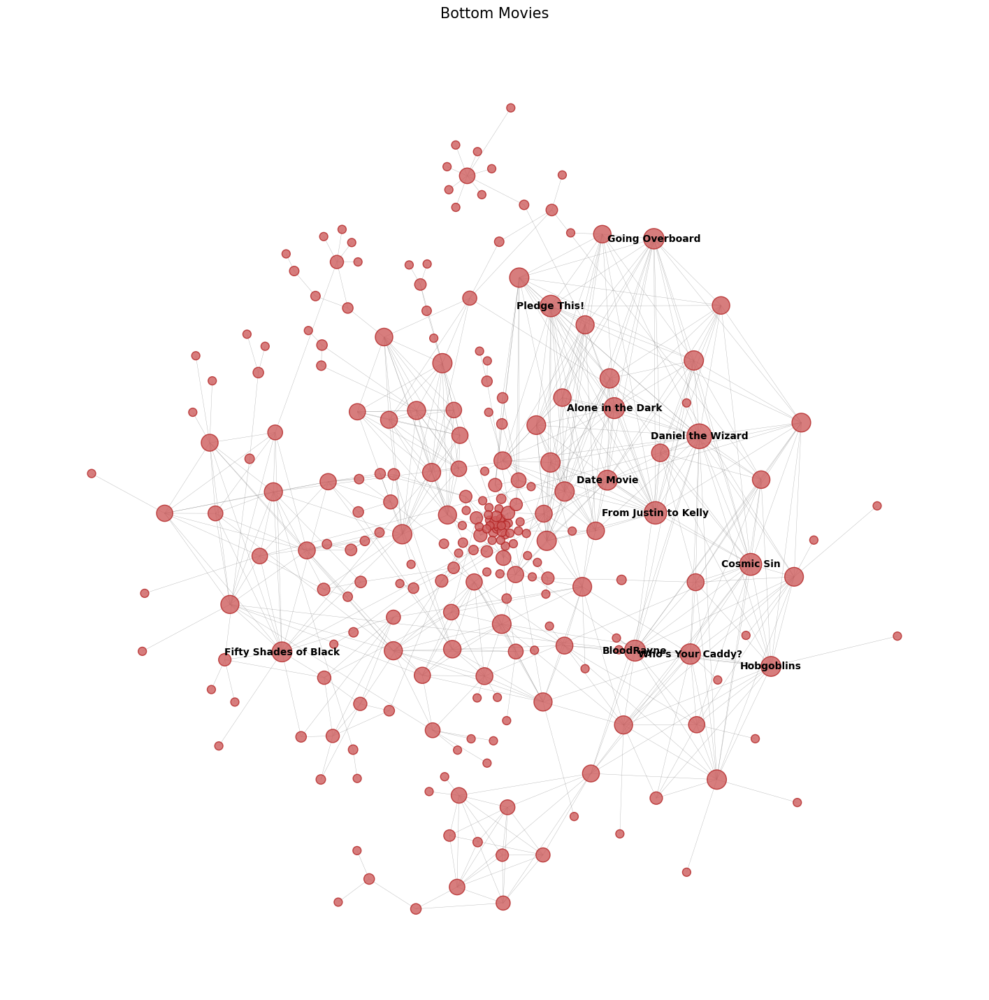

In [68]:
# Calculate the degree of each node
node_degrees = dict(M.degree())  # Returns a dictionary with nodes as keys and their degrees as values

# Normalize node sizes for better visualization
max_degree = max(node_degrees.values())  # Find the maximum degree
node_sizes = [((degree / max_degree) * 600) + 50 for degree in node_degrees.values()]  # Scale node sizes

# Use ForceAtlas2 to compute positions
forceatlas2 = ForceAtlas2(
    outboundAttractionDistribution=True,
    linLogMode=False,
    adjustSizes=False,
    edgeWeightInfluence=1.0,
    jitterTolerance=0.5,
    barnesHutOptimize=True,
    barnesHutTheta=1.2,
    multiThreaded=False,
    scalingRatio=7.0,
    strongGravityMode=False,
    gravity=80,
    verbose=True
)

# Set global random seed for reproducibility
random.seed(42)
np.random.seed(42)
positions = forceatlas2.forceatlas2_networkx_layout(M, iterations=1000)

# Plot the graph with node sizes based on degree
plt.figure(figsize=(18, 18))

# Draw nodes with sizes proportional to their degree
nodes = nx.draw_networkx_nodes(
    M,
    pos=positions,
    node_color='indianred', #'#E64F4F',
    edgecolors='firebrick', #'#C92626', # Set the node border color
    node_size=node_sizes,  # Set node sizes based on degree
    alpha=0.8
)

# Draw edges with a single color
edges = nx.draw_networkx_edges(
    M,
    pos=positions,
    width=0.3,
    edge_color='gray',
    alpha=0.6
)

# Set the degree threshold for which we will show node labels
degree_threshold = 15  # You can adjust this value

# Get the nodes that exceed the degree threshold
high_degree_nodes = [node for node, degree in node_degrees.items() if degree > degree_threshold]

# Draw labels for the nodes with degree above the threshold
labels = {node: node for node in high_degree_nodes}  # Use node name as label
nx.draw_networkx_labels(
    M,
    pos=positions,
    labels=labels,
    font_size=10,
    font_color='black',
    font_weight='semibold',
    verticalalignment='center'
)

# Title and axis settings
plt.title('Bottom Movies', fontsize=15) # node sizes based on degree
plt.axis('off')
plt.show()


#### Genre partition

In [56]:
# Create a dictionary to hold the partition
genre_partition_M = {}

# Iterate over nodes in the graph and assign them to communities based on their first genre
for node, data in M.nodes(data=True):
    # Get the 'Genres' attribute and split it into a list, if present
    genres = data.get("Genres", "")  # Default to an empty string if 'Genres' is missing
    genres_list = [g.strip() for g in genres.split(",")] if genres else []  # Split and strip spaces
    
    # Get the first genre, or None if no genres are available
    first_genre = genres_list[0] if genres_list else None
    
    # Add node to the appropriate community in the partition
    if first_genre not in genre_partition_M:
        genre_partition_M[first_genre] = []
    genre_partition_M[first_genre].append(node)

print("Total number of genres:", len(genre_partition_M), "\n")
for genre, nodes in genre_partition_M.items():
    print(f"{genre}: {len(nodes)} nodes")

Total number of genres: 14 

Comedy: 78 nodes
Action: 95 nodes
Horror: 20 nodes
Thriller: 2 nodes
Adventure: 9 nodes
Documentary: 4 nodes
Drama: 23 nodes
Short: 2 nodes
Crime: 5 nodes
Biography: 1 nodes
Mystery: 1 nodes
Family: 1 nodes
Sci-Fi: 1 nodes
Animation: 1 nodes


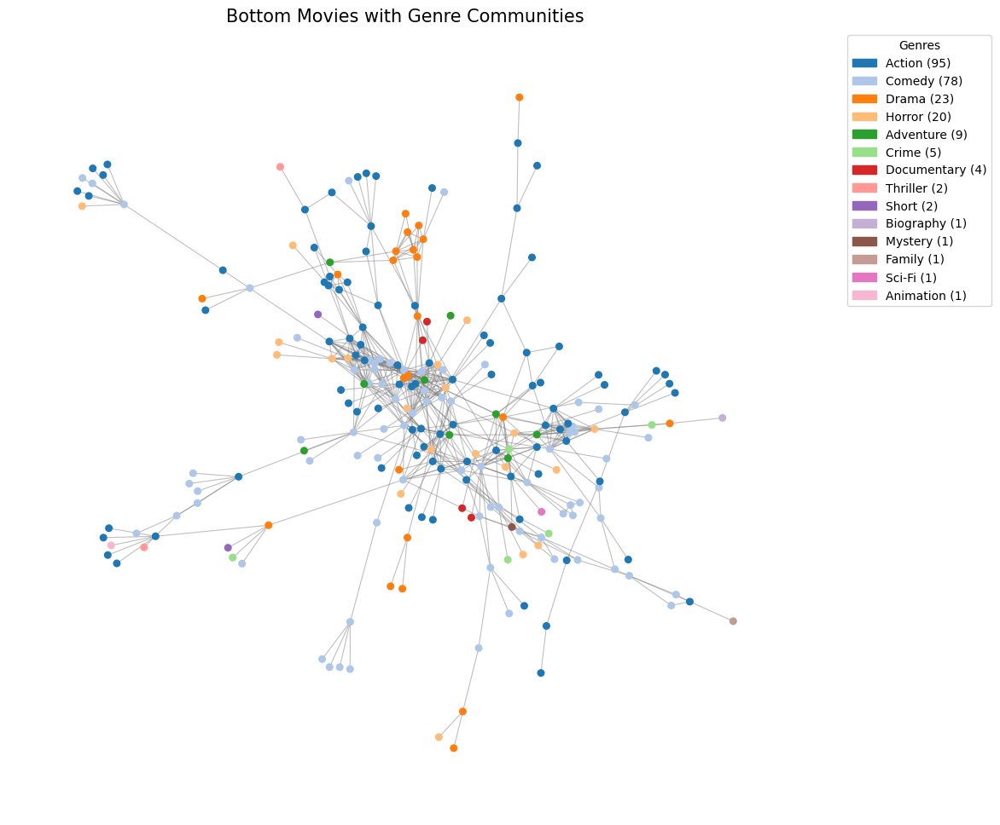

In [57]:
# Sort genres by the number of nodes, descending
sorted_genres = sorted(genre_partition_M.items(), key=lambda x: len(x[1]), reverse=True)

# Create a color map for each genre based on the sorted order
genre_to_color = {genre: plt.cm.tab20.colors[i % 20] for i, (genre, _) in enumerate(sorted_genres)}

# Create a list of colors for the nodes based on their genre
node_colors = []
for node in M.nodes:
    # Assign the corresponding color, default to "Unknown"
    assigned_color = "gray"  # Default to gray for nodes not matching any genre
    for genre, nodes in genre_partition_M.items():
        if node in nodes:
            assigned_color = genre_to_color[genre]
            break
    node_colors.append(assigned_color)

# Plot the graph
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(M, seed=42)  # Layout for consistent positioning

nx.draw_networkx_edges(M, pos, edge_color="gray", alpha=0.5, width=0.8)
nx.draw_networkx_nodes(M, pos, node_color=node_colors, node_size=30)

# Create a sorted legend
legend_handles = [
    mpatches.Patch(color=genre_to_color[genre], label=f"{genre} ({len(nodes)})")
    for genre, nodes in sorted_genres
]
plt.legend(handles=legend_handles, title="Genres", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.title("Bottom Movies with Genre Communities", fontsize=15)
plt.axis("off")
plt.show()


Calculate the **modularity** of the genre-based partition.

In [58]:
# Calculate L (total links) in the entire network
L = M.number_of_edges()

# Calculate modularity using the formula from chapter 9
modularity_genre = 0
for community in genre_partition_M.values():
    subgraph = M.subgraph(community)
    
    # L_c: Count of edges within the community
    L_c = subgraph.number_of_edges()
    
    # k_c: Total degree of the nodes in this community
    k_c = sum(deg for node, deg in subgraph.degree())

    # Calculate modularity contribution for this community 
    # (L_C/L is the fraction of edges within the community, and k_c/(2L) is the expected fraction of edges in a random network)
    modularity_genre += ((L_c / L) - (k_c / (2 * L)) ** 2)

print("Modularity of the genre-based partition:", modularity_genre)

Modularity of the genre-based partition: 0.3628836873541394


#### Director partition

In [59]:
# Create a dictionary to hold the partition
director_partition_M = {}

# Iterate over nodes in the graph and assign them to communities based on their first genre
for node, data in M.nodes(data=True):
    # Get the 'Directors' attribute and split it into a list, if present
    directors = data.get("Director", "")  # Default to an empty string if 'Genres' is missing
    directors_list = [g.strip() for g in directors.split(",")] if directors else []  # Split and strip spaces
    
    # Get the first genre, or None if no genres are available
    first_director = directors_list[0] if directors_list else None
    
    # Add node to the appropriate community in the partition
    if first_director not in director_partition_M:
        director_partition_M[first_director] = []
    director_partition_M[first_director].append(node)

print("Total number of directors:", len(director_partition_M), "\n")
for director, nodes in director_partition_M.items():
    print(f"{director}: {len(nodes)} nodes")

Total number of directors: 184 

John Blanchard: 1 nodes
Punit Malhotra: 1 nodes
James Keach: 1 nodes
Sajid: 2 nodes
David A. Prior: 1 nodes
Charles Robert Carner: 1 nodes
Wych Kaosayananda: 1 nodes
Farhad Samji: 2 nodes
Michael Tiddes: 4 nodes
Ali Abbas Zafar: 2 nodes
Jim Wynorski: 3 nodes
Lisa Azuelos: 1 nodes
Jason Friedberg: 7 nodes
Damien Dante Wayans: 1 nodes
Álvaro de Armiñán: 1 nodes
Kristine Peterson: 2 nodes
Timo Vuorensola: 1 nodes
Robbie Moffat: 1 nodes
Héctor Olivera: 1 nodes
Matt Eskandari: 1 nodes
Sohail Khan: 1 nodes
Thomas J. Wright: 1 nodes
Kamil Cetin: 1 nodes
Chris Sivertson: 1 nodes
William Heins: 1 nodes
None: 4 nodes
Kurt Wimmer: 1 nodes
Marc Fehse: 1 nodes
Russell Mulcahy: 2 nodes
Vic Armstrong: 1 nodes
Barbara Bialowas: 3 nodes
Christopher Hatton: 1 nodes
David Hogan: 1 nodes
David Dhawan: 2 nodes
Kevin O'Neill: 1 nodes
Brian Robbins: 1 nodes
Richard Lester: 1 nodes
Marco Schnabel: 1 nodes
John Gulager: 2 nodes
Amin Hajee: 1 nodes
Edward Drake: 2 nodes
Sabbir K

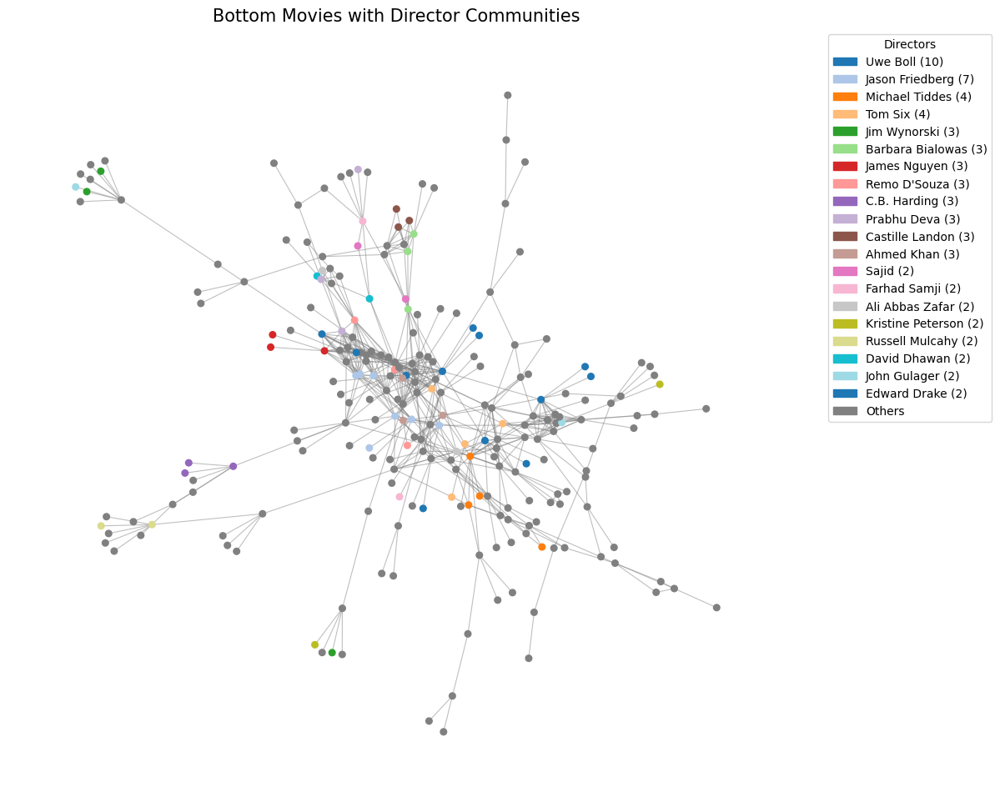

In [60]:
# Get the top 20 directors based on the number of movies (nodes), excluding 'None' or missing directors
top_20_directors = sorted(
    [(director, nodes) for director, nodes in director_partition_M.items() if director != "None" and director is not None],
    key=lambda x: len(x[1]), reverse=True
)[:20]

# Create a color map for the top 20 directors, excluding the gray color from tab20
tab20_colors = list(plt.cm.tab20.colors)  # Get all 20 colors
tab20_colors.remove(plt.cm.tab20.colors[14])  # Remove the gray color (index 14 in tab20)

# Create a color map for the top 20 directors using the remaining colors
director_to_color = {director: tab20_colors[i % len(tab20_colors)] for i, (director, _) in enumerate(top_20_directors)}

# Add a color for "Others" category using gray
others_color = 'gray'

# Create a list to store the color of each node based on its director
node_colors = []
for node in M.nodes:
    # Find the director of the current node by checking the partition_director dictionary
    assigned_color = others_color  # Default to "Others" for nodes without a top 20 director
    director = None  # Initialize to None (missing director)
    
    # Check the director partition and see if the node has a director
    for dir, nodes in director_partition_M.items():
        if node in nodes:
            director = dir
            break
    
    if director == "None" or director is None:  # If director is "None" or missing, assign to "Others"
        assigned_color = others_color
    elif director in director_to_color:  # If director is in top 20, assign the corresponding color
        assigned_color = director_to_color[director]
    else:  # If director is not in top 20, assign to "Others"
        assigned_color = others_color

    node_colors.append(assigned_color)

# Plot the graph
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(M, seed=42)  # Layout for consistent positioning

# Draw the edges and nodes
nx.draw_networkx_edges(M, pos, edge_color='gray', alpha=0.5, width=0.8)
nx.draw_networkx_nodes(M, pos, node_color=node_colors, node_size=30)

# Create a legend for the top 20 directors and "Others"
legend_handles = [
    mpatches.Patch(color=director_to_color[director], label=f"{director} ({len(nodes)})")
    for director, nodes in top_20_directors
]
legend_handles.append(mpatches.Patch(color=others_color, label="Others"))

# Add the legend
plt.legend(handles=legend_handles, title="Directors", bbox_to_anchor=(1.05, 1), loc='upper left')

# Add a title
plt.title("Bottom Movies with Director Communities", fontsize=15)

# Remove axis
plt.axis('off')

# Display the plot
plt.show()


Calculate **modularity** of the director based communities.

In [61]:
# Calculate L (total links) in the entire network
L = M.number_of_edges()

# Calculate modularity using the formula from chapter 9
modularity_director = 0
for community in director_partition_M.values():
    subgraph = M.subgraph(community)
    
    # L_c: Count of edges within the community
    L_c = subgraph.number_of_edges()
    
    # k_c: Total degree of the nodes in this community
    k_c = sum(deg for node, deg in subgraph.degree())

    # Calculate modularity contribution for this community 
    # (L_C/L is the fraction of edges within the community, and k_c/(2L) is the expected fraction of edges in a random network)
    modularity_director += ((L_c / L) - (k_c / (2 * L)) ** 2)

print("Modularity of the director-based partition:", modularity_director)

Modularity of the director-based partition: 0.07161504687314584


#### Actor communities

In [62]:
# Create a dictionary to hold the partition
actor_partition_M = {}

# Iterate over nodes in the graph and assign them to communities based on their first actor
for node, data in M.nodes(data=True):
    # Get the 'Actors' attribute and split it into a list, if present
    actors = data.get("Actors", "")  # Default to an empty string if 'Actors' is missing
    actors_list = [g.strip() for g in actors.split(",")] if actors else []  # Split and strip spaces
    
    # Get the first actor, or None if no actors are available
    first_actor = actors_list[0] if actors_list else None
    
    # Add node to the appropriate community in the partition
    if first_actor not in actor_partition_M:
        actor_partition_M[first_actor] = []
    actor_partition_M[first_actor].append(node)

# Output the partition information
print("Total number of actors:", len(actor_partition_M), "\n")
for actor, nodes in actor_partition_M.items():
    print(f"{actor}: {len(nodes)} nodes")

Total number of actors: 179 

Aimee Graham: 1 nodes
Tiger Shroff: 4 nodes
Leslie Nielsen: 2 nodes
Akshay Kumar: 10 nodes
David Keith: 1 nodes
Larry the Cable Guy: 2 nodes
Antonio Banderas: 1 nodes
Marlon Wayans: 5 nodes
Ranveer Singh: 1 nodes
David Carradine: 1 nodes
Jean-Luc Bilodeau: 1 nodes
Jenn Proske: 1 nodes
Shoshana Bush: 1 nodes
Mike Vogel: 1 nodes
Mark Dacascos: 1 nodes
Jarreau Benjamin: 1 nodes
Suzanne Kendall: 1 nodes
Lana Clarkson: 1 nodes
Bruce Willis: 2 nodes
Salman Khan: 7 nodes
Hulk Hogan: 2 nodes
Enes Batur: 2 nodes
Bonnie Aarons: 1 nodes
Paris Hilton: 2 nodes
Janaya Stephens: 1 nodes
Milla Jovovich: 1 nodes
Yan Birch: 1 nodes
Christopher Lambert: 3 nodes
Nicolas Cage: 2 nodes
Peter Liapis: 2 nodes
Matt Lanter: 1 nodes
Anna-Maria Sieklucka: 3 nodes
Dolph Lundgren: 2 nodes
Amir AboulEla: 1 nodes
Varun Dhawan: 3 nodes
Eric Balfour: 1 nodes
Eddie Murphy: 5 nodes
Christopher Reeve: 2 nodes
Jessica Simpson: 1 nodes
Jenny Wade: 1 nodes
Kunal Kapoor: 1 nodes
Jennifer Garner: 

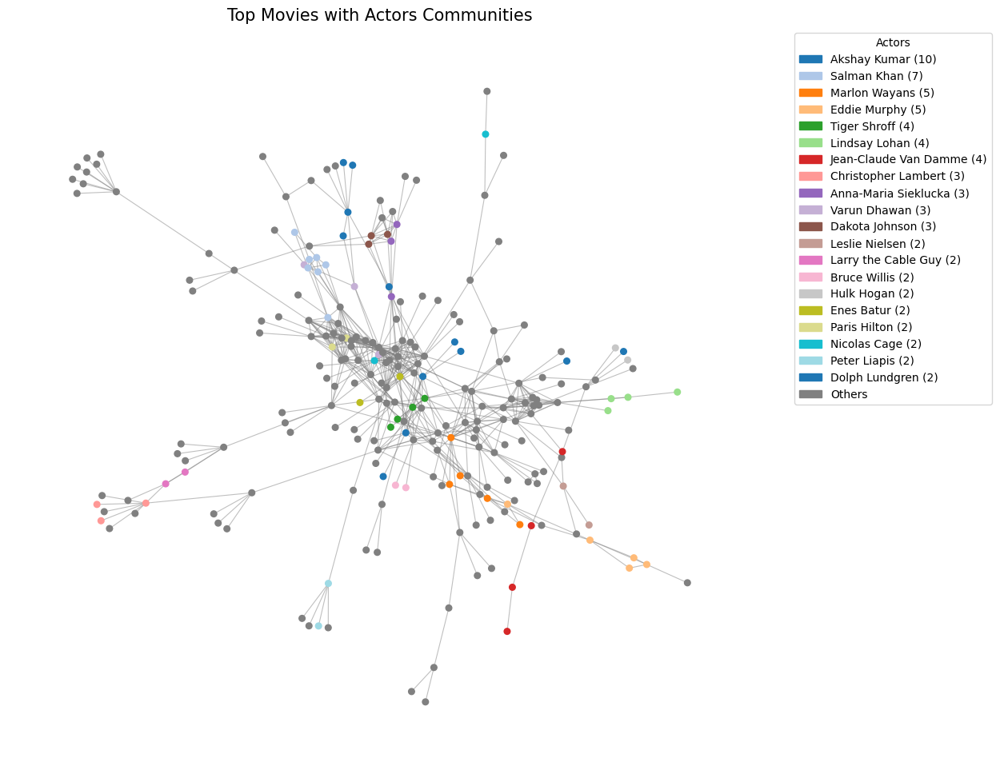

In [63]:
# Get the top 20 directors based on the number of movies (nodes), excluding 'None' or missing directors
top_20_actors = sorted(
    [(actor, nodes) for actor, nodes in actor_partition_M.items() if actor != "None" and actor is not None],
    key=lambda x: len(x[1]), reverse=True
)[:20]

# Create a color map for the top 20 directors, excluding the gray color from tab20
tab20_colors = list(plt.cm.tab20.colors)  # Get all 20 colors
tab20_colors.remove(plt.cm.tab20.colors[14])  # Remove the gray color (index 14 in tab20)

# Create a color map for the top 20 directors using the remaining colors
actor_to_color = {actor: tab20_colors[i % len(tab20_colors)] for i, (actor, _) in enumerate(top_20_actors)}

# Add a color for "Others" category using gray
others_color = 'gray'

# Create a list to store the color of each node based on its director
node_colors = []
for node in M.nodes:
    # Find the director of the current node by checking the partition_director dictionary
    assigned_color = others_color  # Default to "Others" for nodes without a top 20 director
    actor = None  # Initialize to None (missing director)
    
    # Check the director partition and see if the node has a director
    for dir, nodes in actor_partition_M.items():
        if node in nodes:
            actor = dir
            break
    
    if actor == "None" or actor is None:  # If director is "None" or missing, assign to "Others"
        assigned_color = others_color
    elif actor in actor_to_color:  # If director is in top 20, assign the corresponding color
        assigned_color = actor_to_color[actor]
    else:  # If director is not in top 20, assign to "Others"
        assigned_color = others_color

    node_colors.append(assigned_color)

# Plot the graph
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(M, seed=42)  # Layout for consistent positioning

# Draw the edges and nodes
nx.draw_networkx_edges(M, pos, edge_color='gray', alpha=0.5, width=0.8)
nx.draw_networkx_nodes(M, pos, node_color=node_colors, node_size=30)

# Create a legend for the top 20 directors and "Others"
legend_handles = [
    mpatches.Patch(color=actor_to_color[actor], label=f"{actor} ({len(nodes)})")
    for actor, nodes in top_20_actors
]
legend_handles.append(mpatches.Patch(color=others_color, label="Others"))

# Add the legend
plt.legend(handles=legend_handles, title="Actors", bbox_to_anchor=(1.05, 1), loc='upper left')

# Add title
plt.title("Top Movies with Actors Communities", fontsize=15)

# Remove axis
plt.axis('off')

# Display the plot
plt.show()


Calculate **modularity** of the actors based communities.

In [64]:
# Calculate L (total links) in the entire network
L = M.number_of_edges()

# Calculate modularity using the formula from chapter 9
modularity_actor = 0
for community in actor_partition_M.values():
    subgraph = M.subgraph(community)
    
    # L_c: Count of edges within the community
    L_c = subgraph.number_of_edges()
    
    # k_c: Total degree of the nodes in this community
    k_c = sum(deg for node, deg in subgraph.degree())

    # Calculate modularity contribution for this community 
    # (L_C/L is the fraction of edges within the community, and k_c/(2L) is the expected fraction of edges in a random network)
    modularity_actor += ((L_c / L) - (k_c / (2 * L)) ** 2)

print("Modularity of the actor-based partition:", modularity_actor)

Modularity of the actor-based partition: 0.09823830149123844


#### Louvain partition

In [65]:
# Compute the Louvain partition
louvain_partition_M = community_louvain.best_partition(M)

# Group nodes by their assigned community
community_groups = defaultdict(list)
for node, community in louvain_partition_M.items():
    community_groups[community].append(node)

print("Number of communities:", len(community_groups), "\n")
for community_id, nodes in community_groups.items():
    print(f"Community {community_id}: {len(nodes)} nodes")

Number of communities: 14 

Community 0: 30 nodes
Community 1: 34 nodes
Community 2: 27 nodes
Community 3: 19 nodes
Community 4: 25 nodes
Community 5: 8 nodes
Community 6: 10 nodes
Community 7: 15 nodes
Community 8: 19 nodes
Community 9: 9 nodes
Community 10: 25 nodes
Community 11: 6 nodes
Community 12: 10 nodes
Community 13: 6 nodes


C:\Users\Alba\AppData\Local\Temp\ipykernel_4960\3337303700.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_palette = plt.cm.get_cmap('tab20', num_communities)  # Use 'tab20' for up to 20 colors


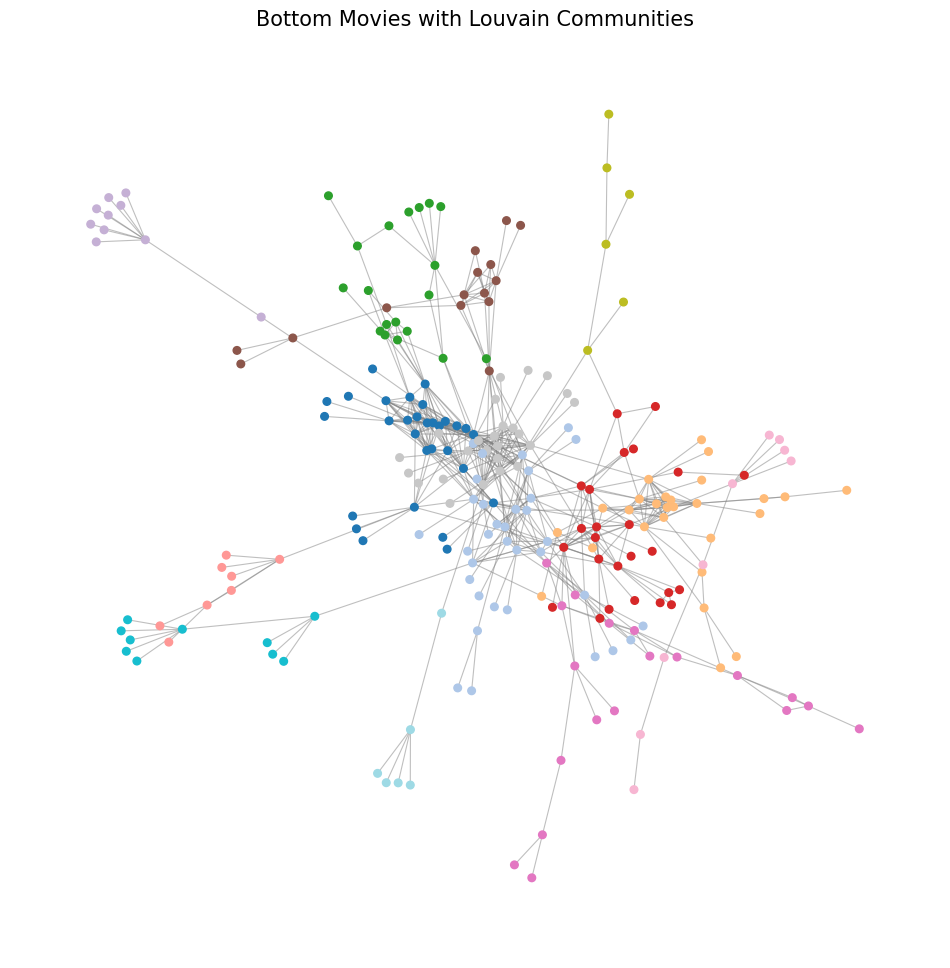

In [66]:
# Assign a unique color to each community
num_communities = len(community_groups)
color_palette = plt.cm.get_cmap('tab20', num_communities)  # Use 'tab20' for up to 20 colors
community_to_color = {community: color_palette(i) for i, community in enumerate(community_groups.keys())}

# Create a list of colors for each node based on its community
node_colors = [community_to_color[louvain_partition_M[node]] for node in M.nodes]

# Plot the graph with nodes colored by community
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(M, seed=42)  # Layout for consistent positioning

# Draw the edges and nodes
nx.draw_networkx_edges(M, pos, edge_color='gray', alpha=0.5, width=0.8)
nx.draw_networkx_nodes(M, pos, node_color=node_colors, node_size=30)

# Add a title
plt.title("Bottom Movies with Louvain Communities", fontsize=15)

# Remove axis
plt.axis('off')

# Display the plot
plt.show()

100%|██████████| 1000/1000 [00:02<00:00, 463.92it/s]


BarnesHut Approximation  took  0.37  seconds
Repulsion forces  took  1.61  seconds
Gravitational forces  took  0.03  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.11  seconds


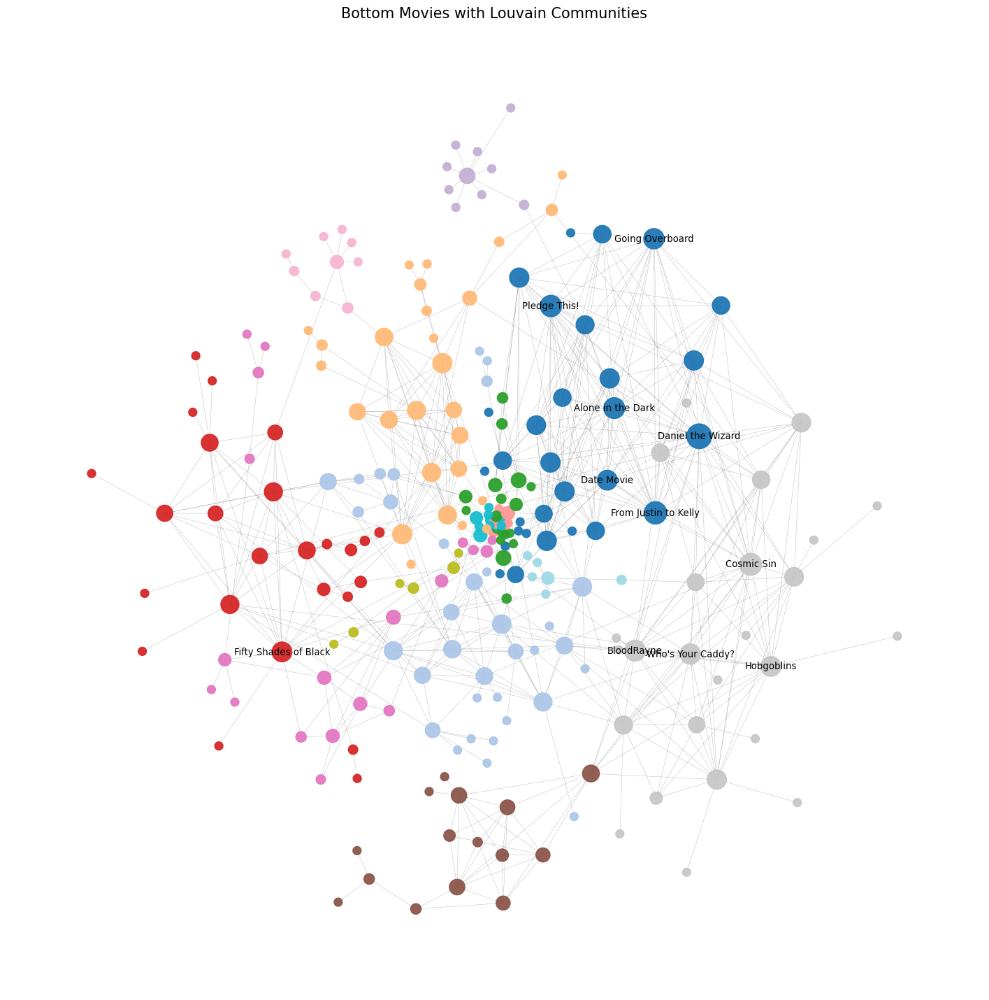

In [69]:

# Use ForceAtlas2 to compute positions
forceatlas2 = ForceAtlas2(
    outboundAttractionDistribution=True,
    linLogMode=False,
    adjustSizes=False,
    edgeWeightInfluence=1.0,
    jitterTolerance=0.5,
    barnesHutOptimize=True,
    barnesHutTheta=1.2,
    multiThreaded=False,
    scalingRatio=7.0,
    strongGravityMode=False,
    gravity=80,
    verbose=True
)

# Set global random seed for reproducibility
random.seed(42)
np.random.seed(42)

positions = forceatlas2.forceatlas2_networkx_layout(M, iterations=1000)

# Plot the graph with node sizes based on degree and community-based colors
plt.figure(figsize=(18, 18))

# Draw nodes with sizes proportional to their degree and community-based colors
nodes = nx.draw_networkx_nodes(
    M,
    pos=positions,
    node_color=node_colors,  # Set node colors based on community
    node_size=node_sizes,  # Set node sizes based on degree
    alpha=0.95
)

# Draw edges with a single color
edges = nx.draw_networkx_edges(
    M,
    pos=positions,
    width=0.3,
    edge_color='gray',
    alpha=0.6
)

# Set the degree threshold for which we will show node labels
degree_threshold = 15  # You can adjust this value

# Get the nodes that exceed the degree threshold
high_degree_nodes = [node for node, degree in node_degrees.items() if degree > degree_threshold]

# Draw labels for the nodes with degree above the threshold
labels = {node: node for node in high_degree_nodes}  # Use node name as label
nx.draw_networkx_labels(
    M,
    pos=positions,
    labels=labels,
    font_size=9.5,
    font_color='black',
    verticalalignment='center'
)

# Title and axis settings
plt.title('Bottom Movies with Louvain Communities', fontsize=15)
plt.axis('off')
plt.show()

Calculate modularity of the director based communities.

In [70]:
# Calculate modularity for the Louvain partition
modularity_louvain = community_louvain.modularity(louvain_partition_M, M)
print("Modularity of Louvain partition:", modularity_louvain)

Modularity of Louvain partition: 0.6939747241011035


The nodes in the graph are updated to store metadata fields (e.g., genres, directors, actors, etc.) as **lists instead of strings**. This allows for easier processing and analysis.

In [71]:
# Modify the nodes info to get it as list instead of string
M2 = nx.Graph(M)

# Modify the nodes to have lists of genres and directors
for node in M2.nodes:
    # Get the current node data
    data = M2.nodes[node]
    
    # Get the genres and directors as strings
    genres = data.get("Genres", "")
    directors = data.get("Director", "")
    actors = data.get("Actors", "")
    producers = data.get("Producer", "")
    production_companies = data.get("Production Companies", "")
    
    # Split the strings into lists
    genres_list = [g.strip() for g in genres.split(",")] if genres else []
    directors_list = [d.strip() for d in directors.split(",")] if directors else []
    actors_list = [a.strip() for a in actors.split(",")] if actors else []
    producers_list = [p.strip() for p in producers.split(",")] if producers else []
    production_companies_list = [pc.strip() for pc in production_companies.split(",")] if production_companies else []

    # Update the node data with the lists
    data["Genres"] = genres_list
    data["Director"] = directors_list
    data["Actors"] = actors_list
    data["Producer"] = producers_list
    data["Production Companies"] = production_companies_list

# Check the updated node data for a sample node
sample_node = "Smolensk"
if sample_node in M2.nodes:
    # Print the metadata of the node in one line each
    for key, value in M2.nodes[sample_node].items():
        print(f"{key}: {value}")

Title: Smolensk 
Rating: 1.2 
Top 250 Rank: N/A 
Duration: 120 
Release Date: 09 Sep 2016 (Poland) 
Genres: ['Drama', 'Thriller']
Director: ['Antoni Krauze']
Actors: ['Beata Fido', 'Maciej Póltorak', 'Aldona Struzik', 'Lech Lotocki', 'Redbad Klynstra', 'Jerzy Zelnik', 'Halina Labonarska', 'Dominika Figurska', 'Maciej Góraj', 'Marek Probosz']
Languages: Polish, English 
Description: Inspired by true events of 2010 Polish Air Force Tu-154 mysterious crash in Smolensk, the film tells the fictional story of various people affected by the tragedy. The protagonist is a journalist Nina, who refuses to accept the official version of the story and pursues her own independent investigation. 
Plot: ["An inspired story of people affected by the 2010 crash of Polish Air Force Flight 101 in Smolensk, Russia. Fiery reporter Nina won't accept the story she's been given and is determined to find the truth.", 'Inspired by true events of 2010 Polish Air Force Tu-154 mysterious crash in Smolensk, the film

#### Analysis of the top geners, directors, actors and release dates

Check the most common genres across all movies.

In [72]:
# check most common genres taking all into acount and not just the first
all_genres = [genre for data in M2.nodes.values() for genre in data.get("Genres", [])]
common_genres_bottom = Counter(all_genres).most_common()
print("Most common genres:")
for genre, count in common_genres_bottom:
    print(f"{genre}: {count}")

Most common genres:
Comedy: 125
Action: 97
Thriller: 77
Horror: 74
Drama: 60
Sci-Fi: 55
Romance: 46
Fantasy: 43
Adventure: 42
Crime: 35
Mystery: 16
Music: 10
Sport: 7
Documentary: 4
Musical: 3
Short: 3
History: 3
War: 3
Western: 2
Biography: 2
Family: 1
Animation: 1


In [73]:
# Extract only the first genre from the "Genres" list
first_genres = [data.get("Genres", [None])[0] for data in M2.nodes.values() if data.get("Genres")]

# Count the occurrences of the first genres
common_genres_bottom2 = Counter(first_genres).most_common()

# Print the most common first genres
print("Most common first genres:")
for genre, count in common_genres_bottom2:
    print(f"{genre}: {count}")

Most common first genres:
Action: 95
Comedy: 78
Drama: 23
Horror: 20
Adventure: 9
Crime: 5
Documentary: 4
Thriller: 2
Short: 2
Biography: 1
Mystery: 1
Family: 1
Sci-Fi: 1
Animation: 1


Check most popular actors.

In [74]:
# Create a dictionary to count the number of times each actor has participated in a movie and store movie names
actor_count = {}
actor_movies = {}

# Iterate over nodes in the graph
for node in M2.nodes:
    # Get the actors list for the current node
    actors_list = M2.nodes[node].get("Actors", [])
    
    # Count the participation of each actor and store movie names
    for actor in actors_list:
        if actor not in actor_count:
            actor_count[actor] = 0
            actor_movies[actor] = []
        actor_count[actor] += 1
        actor_movies[actor].append(node)

# Sort actors by the number of movies in descending order
sorted_actors = sorted(actor_count.items(), key=lambda item: item[1], reverse=True)

# Print the top 30 actors with the number of movies and the names of the movies
print("Top 30 Actors with the Number of Movies and Movie Names:\n")
for actor, count in sorted_actors[:30]:
    print(f"{actor}: {count} movies")
    print("Movies:", ", ".join(actor_movies[actor]))
    print()

Top 30 Actors with the Number of Movies and Movie Names:

Akshay Kumar: 10 movies
Movies: It's Entertainment, Bachchhan Paandey, Housefull 3, Action Replayy, Tees Maar Khan, Housefull 4, CC2C, Singh Is Bliing, Laxmii, Khiladi 786

Salman Khan: 8 movies
Movies: Jai Ho, Radhe, Dabangg 2, Tubelight, Prem Ratan Dhan Payo, Race 3, Dabangg 3, Bharat

Tiger Shroff: 6 movies
Movies: Student of the Year 2, Munna Michael, A Flying Jatt, Heropanti 2, Baaghi 2, Baaghi 3

Jacqueline Fernandez: 6 movies
Movies: Bachchhan Paandey, Judwaa 2, Housefull 3, A Flying Jatt, Baaghi 2, Race 3

Riteish Deshmukh: 6 movies
Movies: Total Dhamaal, Housefull 3, Housefull 4, Baaghi 2, Double Dhamaal, Baaghi 3

Leslie Nielsen: 5 movies
Movies: Camouflage, Repossessed, 2001: A Space Travesty, Stan Helsing, Superhero Movie

Marlon Wayans: 5 movies
Movies: Fifty Shades of Black, A Haunted House, Sextuplets, A Haunted House 2, Little Man

Eddie Murphy: 5 movies
Movies: Norbit, The Adventures of Pluto Nash, Nutty Profess

Find colaborations between actors and directors.

In [75]:
# Create a dictionary to count the number of times each actor has participated in a movie and store movie names
actor_count = {}
actor_movies = {}

# Iterate over nodes in the graph
for node in M2.nodes:
    # Get the actors list for the current node
    actors_list = M2.nodes[node].get("Actors", [])
    
    # Count the participation of each actor and store movie names
    for actor in actors_list:
        if actor not in actor_count:
            actor_count[actor] = 0
            actor_movies[actor] = []
        actor_count[actor] += 1
        actor_movies[actor].append(node)

# Sort actors by the number of movies in descending order
sorted_actors = sorted(actor_count.items(), key=lambda item: item[1], reverse=True)

# Get the top 50 actors
top_50_actors = [actor for actor, count in sorted_actors[:50]]

# Create a dictionary to count collaborations between actors and directors and store movie names
actor_director_collaborations = {}

# Iterate over nodes in the graph to find collaborations for top 50 actors
for node in M2.nodes:
    # Get the actors and directors list for the current node
    actors_list = M2.nodes[node].get("Actors", [])
    directors_list = M2.nodes[node].get("Director", [])
    
    # Count collaborations between actors and directors for top 50 actors and store movie names
    for actor in actors_list:
        if actor in top_50_actors:
            for director in directors_list:
                pair = (actor, director)
                if pair not in actor_director_collaborations:
                    actor_director_collaborations[pair] = {"count": 0, "movies": []}
                actor_director_collaborations[pair]["count"] += 1
                actor_director_collaborations[pair]["movies"].append(node)

# Filter collaborations that are repeated (count > 1)
repeated_collaborations = {pair: info for pair, info in actor_director_collaborations.items() if info["count"] > 1}

# Print repeated collaborations between actors and directors with movie names
print("Repeated Collaborations between Actors and Directors among Top 50 Actors:\n")
for pair, info in repeated_collaborations.items():
    print(f"{pair}: {info['count']} collaborations: {", ".join(info["movies"])}")



Repeated Collaborations between Actors and Directors among Top 50 Actors:

('Akshay Kumar', 'Sajid'): 2 collaborations: It's Entertainment, Housefull 3
('Akshay Kumar', 'Farhad Samji'): 4 collaborations: It's Entertainment, Bachchhan Paandey, Housefull 3, Housefull 4
('Johny Lever', 'Farhad Samji'): 2 collaborations: It's Entertainment, Housefull 4
('Kriti Sanon', 'Farhad Samji'): 2 collaborations: Bachchhan Paandey, Housefull 4
('Jacqueline Fernandez', 'Farhad Samji'): 2 collaborations: Bachchhan Paandey, Housefull 3
('Marlon Wayans', 'Michael Tiddes'): 4 collaborations: Fifty Shades of Black, A Haunted House, Sextuplets, A Haunted House 2
('Affion Crockett', 'Michael Tiddes'): 2 collaborations: Fifty Shades of Black, A Haunted House 2
('Diedrich Bader', 'Jason Friedberg'): 3 collaborations: Vampires Suck, The Starving Games, Meet the Spartans
('Diedrich Bader', 'Aaron Seltzer'): 3 collaborations: Vampires Suck, The Starving Games, Meet the Spartans
('Essence Atkins', 'Michael Tiddes'

Check the release date.

In [76]:
# Extract the year from the release date attribute and check whether movies are from before 2000 or after
before_2000 = 0
after_2000 = 0
years_counter = Counter()

# Initialize variables to store the oldest and newest movies
oldest_movie = None
newest_movie = None
oldest_year = float('inf')
newest_year = float('-inf')

for node in M2.nodes:
    release_date = M2.nodes[node].get("Release Date", "")
    
    # Extract the year using regex
    match = re.search(r'\b(\d{4})\b', release_date)
    if match:
        year = int(match.group(1))
        years_counter[year] += 1
        
        # Check if the movie is before or after 2000
        if year < 2000:
            before_2000 += 1
        else:
            after_2000 += 1

        # Check for the oldest movie
        if year < oldest_year:
            oldest_year = year
            oldest_movie = node
        
        # Check for the newest movie
        if year > newest_year:
            newest_year = year
            newest_movie = node

# Find the top 20 years with the most movies
top_20_years = years_counter.most_common(10)

print(f"Movies before 2000: {before_2000}")
print(f"Movies after 2000: {after_2000}")
print()
print("Top 10 years with the most movies:")
for year, count in top_20_years:
    print(f"{year}: {count} movies")

print()
print(f"The oldest movie is '{oldest_movie}' released in {oldest_year}.")
print(f"The newest movie is '{newest_movie}' released in {newest_year}.")



Movies before 2000: 42
Movies after 2000: 183

Top 10 years with the most movies:
2008: 13 movies
2007: 12 movies
2019: 10 movies
2014: 10 movies
2010: 10 movies
2009: 10 movies
2012: 9 movies
2020: 9 movies
2018: 9 movies
2006: 9 movies

The oldest movie is 'Earth vs. the Spider' released in 1958.
The newest movie is 'Now or Never!' released in 2024.


### Confussion matrix
Calculate confussion matrix of genre partition vs Louvain partition.

In [77]:
# Get the 10 most common genres
most_common_genres = sorted(genre_partition_M.keys(), key=lambda g: len(genre_partition_M[g]), reverse=True)[:10]

# Get 10 biggest communities
community_count = pd.Series(louvain_partition_M).value_counts()
most_common_communities = community_count.nlargest(10).index.tolist()

# Confusion matrix
D_matrix_M = np.zeros((len(most_common_genres), len(most_common_communities)), dtype=int)

for node in M2.nodes():
    # Get the genres directly from the node attributes
    node_genres = M2.nodes[node]['Genres']  # List of genres for the node
    node_community = louvain_partition_M[node]  # Community ID for the node
    
    # Check if the community is one of the largest ones
    if node_community in most_common_communities:
        community_index = most_common_communities.index(node_community)
        
        # Count all genres of this node
        for genre in node_genres:
            if genre in most_common_genres:
                genre_index = most_common_genres.index(genre)
                D_matrix_M[genre_index, community_index] += 1  # Increment the count in the matrix

# Display the confusion matrix
D_df = pd.DataFrame(D_matrix_M, index=most_common_genres, columns=most_common_communities)
print("Confusion Matrix (Genres vs Communities):")
print(D_df)


Confusion Matrix (Genres vs Communities):
             1   0   2   4   10  3   8   7   6   12
Action       13   9   8   9  11  15   3   2   6   6
Comedy       14  19  12  12   8  13  15   3   9   2
Drama        13   0   5   3   8   9   4  12   0   4
Horror       16   9   9   4   9   2   7   0  10   0
Adventure     4   5   5   7   4   2   0   1   4   4
Crime         6   5   4   7   1   3   2   1   0   1
Documentary   0   0   1   1   2   0   0   0   0   0
Thriller     16   7  12  10   8   1   2   4   7   2
Short         0   1   0   0   1   0   0   0   0   1
Biography     0   0   1   0   1   0   0   0   0   0


## TF-IDF and wordclouds for genres and communities
First, start with genres.


In [78]:
synopsis = False

# Initialize stop words and lemmatizer
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

genre_text = {}

# Iterate over nodes in the graph and extract text data
for node, data in M2.nodes(data=True):
    genres = data.get("Genres", "")

    metadata_file = os.path.join(metadata_folder, f"{node}.txt")
    

    # If the file doesn't exist, try replacing ":", "?" and "/" with "_"
    if not os.path.exists(metadata_file):
        if node == "Naked Gun 33 1/3: The Final Insult":
            sanitized_node = "Naked Gun 33 1_3_ The Final Insult"
            metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
        elif node == "The Room Actors: Where Are They Now?":
            sanitized_node = "The Room Actors_ Where Are They Now_"
            metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
        elif node == "Enes Batur: Imagination or Reality?":
            sanitized_node = "Enes Batur_ Imagination or Reality_"
            metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
        else:
            for char in [':', '?', '/']:
                sanitized_node = node.replace(char, '_')
                metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
                if os.path.exists(metadata_file):
                    break
    
    # If the file exists, parse the metadata and add it to the node
    if os.path.exists(metadata_file):
        with open(metadata_file, 'r', encoding='utf-8') as file:
            lines = file.readlines()
            for line in lines:
                if synopsis:
                    synopsis_text = line.strip()
                    synopsis_text = re.sub(r'[^\w\s]', '', synopsis_text) # Remove punctuation
                    synopsis_text = synopsis_text.lower() # Convert to lowercase
                    synopsis_text = re.sub(r"[^a-zA-Z\s]", " ", synopsis_text)  # Remove all non-alphabetic characters
                    synopsis_text = synopsis_text.lower()  # Convert text to lowercase
                    synopsis_text = re.sub(r"\b\w{1,2}\b", "", synopsis_text)  # Remove very short words (1-2 characters)
                    synopsis_text = re.sub(r"\s+", " ", synopsis_text).strip()  # Remove extra whitespace

                    # Remove stop words and lemmatize the words
                    words = word_tokenize(synopsis_text)
                    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]
                    synopsis_text = " ".join(words)

                    # Agregate text for each genre
                    for genre in genres:
                        if genre not in genre_text:
                            genre_text[genre] = ""
                        genre_text[genre] += " " + synopsis_text
                    synopsis = False
                if line.strip().startswith("Synopsis:"):
                    synopsis = True

# Print genre_texts length
print("Genre's text length:")
for genre, text in genre_text.items():
    print(f"{genre}: {len(text)}")

Genre's text length:
Comedy: 237807
Horror: 140249
Action: 230384
Drama: 106610
Romance: 104895
Sport: 12324
Thriller: 151133
Crime: 86797
Mystery: 30066
Sci-Fi: 122458
Musical: 5231
Adventure: 106629
Music: 14142
Fantasy: 108478
Documentary: 4
Short: 3
Western: 5319
History: 3
Biography: 2
War: 9278
Family: 6953
Animation: 1


In [79]:
# Tokenize the text for each genre
genre_tokens = {genre: word_tokenize(text) for genre, text in genre_text.items()}

# Count the frequency of each word in each genre
genre_word_counts = {genre: Counter(tokens) for genre, tokens in genre_tokens.items()}

In [80]:
# Generate TF list for the top 15 genres
top_genres = sorted(genre_word_counts.keys(), key=lambda x: len(genre_word_counts[x]), reverse=True)[:15]
genre_tf = {genre: {word: count for word, count in genre_word_counts[genre].items()} for genre, tokens in genre_tokens.items() if genre in top_genres}

In [81]:
# log-normalized TF for all the genres
tf_scores = {}
for genre, word_counts in genre_word_counts.items():
    tf_scores[genre] = {}
    for word, count in word_counts.items():
        tf_scores[genre][word] = 1 + math.log(count)

In [82]:
# Calculate the inverse document frequency (IDF) for each word

# Total number of genres
N = len(genre_tf)

# Initialize a Counter to store document frequencies
df_counts = Counter()

# Calculate document frequency for each word
for genre, word_list in genre_tf.items():
    df_counts.update(word_list.keys())

# Calculate IDF for each word
idf_scores = {}
for word, df in df_counts.items():
    idf_scores[word] = math.log(N/df)

In [83]:
# Calculate TF-IDF scores for each word in each genre
tfidf_scores = {}
for genre, word_list in genre_tf.items():
    tfidf_scores[genre] = {word: tf_scores[genre][word] * idf_scores[word] for word in word_list}

In [84]:
# Identify top 10 words based on TF-IDF scores
top_words_tfidf = {}
for genre, scores in tfidf_scores.items():
    # Sort words by TF-IDF score and get the top 10
    top_words = sorted(scores.items(), key=lambda x: x[1], reverse=True)[:10]
    top_words_tfidf[genre] = top_words

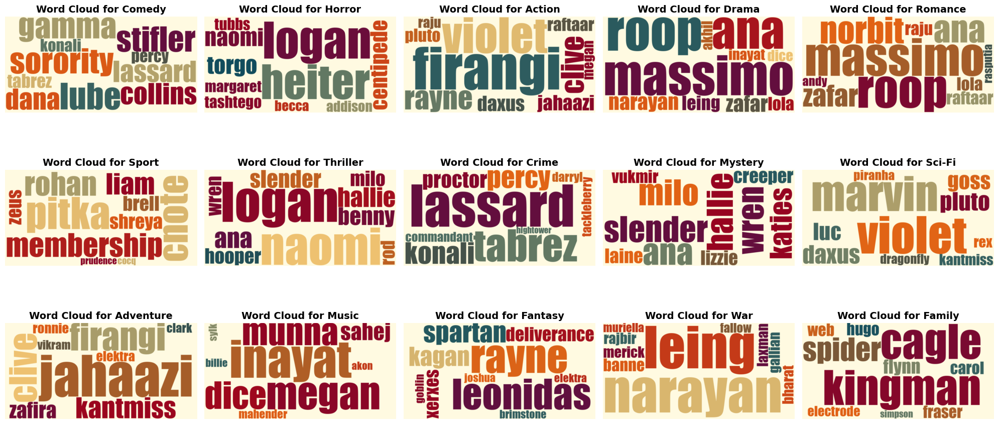

In [85]:
# Number of genres
num_genres = len(top_words_tfidf)

# Determine the number of rows and columns for the subplots
cols = 5
rows = (num_genres + cols - 1) // cols  # Proper ceiling division

# Create a figure and a set of subplots
fig, axs = plt.subplots(rows, cols, figsize=(20, 10))

# Flatten the axs array for easy iteration
axs = axs.flatten()

# Define custom colors
cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#5F0F40", "#9A031E", "#E36414", "#0F4C5C", "#EEC170"])

# Generate word clouds
for i, (genre, top_words) in enumerate(top_words_tfidf.items()):
    # Prepare a single string with each word repeated according to its TF-IDF score
    wordcloud_input = ' '.join([word for word, score in top_words for _ in range(int(score))])
    
    # Create the word cloud with custom font, color map, and background
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='#FFFAE1',
        colormap=cmap,
        font_path='C:/Users/nerea/Documents/MasterDTU/SocialGraphs_fall24/Projects/socialGraphs_fall24/impact.ttf',  # Replace with a path to a custom font (optional)
        collocations=False
    ).generate(wordcloud_input)
    
    # Display the word cloud
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')
    axs[i].set_title(f"Word Cloud for {genre}", fontsize=14, fontweight='bold')

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

Now with the Louvain communities.

In [86]:
synopsis = False

# Initialize stop words and lemmatizer
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

community_text = {}

# Iterate over nodes in the graph and extract text data
for community_id, nodes in community_groups.items():
    community_text[community_id] = ""

    for node in nodes:
        metadata_file = os.path.join(metadata_folder, f"{node}.txt")
        
        # If the file doesn't exist, try replacing ":", "?" and "/" with "_"
        if not os.path.exists(metadata_file):
            if node == "Naked Gun 33 1/3: The Final Insult":
                sanitized_node = "Naked Gun 33 1_3_ The Final Insult"
                metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
            elif node == "The Room Actors: Where Are They Now?":
                sanitized_node = "The Room Actors_ Where Are They Now_"
                metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
            elif node == "Enes Batur: Imagination or Reality?":
                sanitized_node = "Enes Batur_ Imagination or Reality_"
                metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
            else:
                for char in [':', '?', '/']:
                    sanitized_node = node.replace(char, '_')
                    metadata_file = os.path.join(metadata_folder, f"{sanitized_node}.txt")
                    if os.path.exists(metadata_file):
                        break
        
        # If the file exists, parse the metadata and add it to the node
        if os.path.exists(metadata_file):
            with open(metadata_file, 'r', encoding='utf-8') as file:
                lines = file.readlines()
                for line in lines:
                    if synopsis:
                        synopsis_text = line.strip()
                        synopsis_text = re.sub(r'[^\w\s]', '', synopsis_text) # Remove punctuation
                        synopsis_text = synopsis_text.lower() # Convert to lowercase
                        synopsis_text = re.sub(r"[^a-zA-Z\s]", " ", synopsis_text)  # Remove all non-alphabetic characters
                        synopsis_text = synopsis_text.lower()  # Convert text to lowercase
                        synopsis_text = re.sub(r"\b\w{1,2}\b", "", synopsis_text)  # Remove very short words (1-2 characters)
                        synopsis_text = re.sub(r"\s+", " ", synopsis_text).strip()  # Remove extra whitespace

                        # Remove stop words and lemmatize the words
                        words = word_tokenize(synopsis_text)
                        words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]
                        synopsis_text = " ".join(words)

                        # Agregate text for each community
                        community_text[community_id] += " " + synopsis_text
                        synopsis = False
                    elif line.strip().startswith("Synopsis:"):
                        synopsis = True

print("Community's text length:")
for community, text in community_text.items():
    print(f"{community}: {len(text)}")

Community's text length:
0: 51009
1: 100714
2: 45648
3: 55002
4: 52323
5: 7357
6: 5826
7: 26541
8: 39327
9: 6122
10: 38908
11: 20318
12: 29445
13: 3696


In [87]:
# Tokenize the text for each community
community_tokens = {community: word_tokenize(text) for community, text in community_text.items()}
community_word_counts = {community: Counter(tokens) for community, tokens in community_tokens.items()}
community_word_counts = {community: {word: count for word, count in counts.items() if count >= 5} for community, counts in community_word_counts.items()}

In [88]:
comunity_tf = {community: {word: count for word, count in counts.items()} for community, counts in community_word_counts.items()}

In [89]:
# log-normalize Tf for all the communities
tf_scores = {}
for community, word_list in comunity_tf.items():
    tf_scores[community] = {}  # Initialize an empty dictionary for each community
    for word, count in word_list.items():
        tf_scores[community][word] = 1 + math.log(count)

In [90]:
# Calculate the inverse document frequency (IDF) for each word
N = len(comunity_tf)  # Total number of communities
df_counts = Counter()  # Initialize a Counter to store document frequencies

# Calculate document frequency for each word
for community, word_list in comunity_tf.items():
    df_counts.update(word_list.keys())

# Calculate IDF for each word
idf_scores = {}
for word, df in df_counts.items():
    idf_scores[word] = math.log(N / df)

# Calculate TF-IDF scores for each word in each community
tfidf_scores = {}
for community, word_list in comunity_tf.items():
    tfidf_scores[community] = {word: tf_scores[community][word] * idf_scores[word] for word in word_list}

# Print the TF-IDF scores for the communities
# for community, scores in tfidf_scores.items():
    # print(f"TF-IDF scores for {community}:")
    # for word, score in scores.items():
        # print(f"{word}: {score:.4f}")
    # print("\n")

In [91]:
top_words_tfidf = {}
for community, scores in tfidf_scores.items():
    # Sort words by TF-IDF score and get the top 10
    top_words = sorted(scores.items(), key=lambda x: x[1], reverse=True)[:10]
    top_words_tfidf[community] = top_words

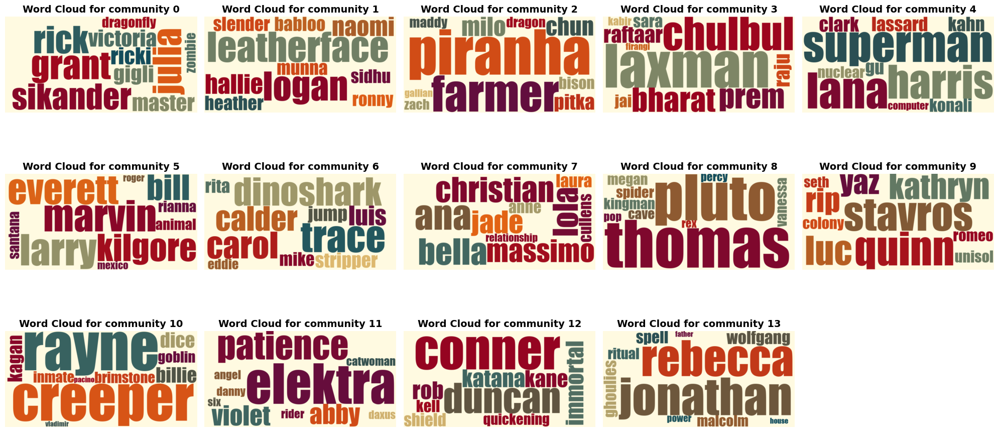

In [92]:

# Number of genres
num_communities = len(top_words_tfidf)

# Determine the number of rows and columns for the subplots
cols = 5
rows = (num_communities + cols - 1) // cols  # Proper ceiling division

# Create a figure and a set of subplots
fig, axs = plt.subplots(rows, cols, figsize=(20, 10))

# Flatten the axs array for easy iteration
axs = axs.flatten()

# Define custom colors
cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#5F0F40", "#9A031E", "#E36414", "#0F4C5C", "#EEC170"])

# Generate word clouds
for i, (community, top_words) in enumerate(top_words_tfidf.items()):
    # Prepare a single string with each word repeated according to its TF-IDF score
    wordcloud_input = ' '.join([word for word, score in top_words for _ in range(int(score))])
    
    # Create the word cloud with custom font, color map, and background
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='#FFFAE1',
        colormap=cmap,
        font_path='C:/Users/nerea/Documents/MasterDTU/SocialGraphs_fall24/Projects/socialGraphs_fall24/impact.ttf',  # Replace with a path to a custom font (optional)
        collocations=False
    ).generate(wordcloud_input)
    
    # Display the word cloud
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')
    axs[i].set_title(f"Word Cloud for community {community}", fontsize=14, fontweight='bold')

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

### Sentiment Analysis
The sentiment score is calculated for each movie.

In [142]:
# Path to the folder containing Wikipedia text files
movies_folder = "bottom_net_movies_info"

stop_words = set(stopwords.words('english'))

# Function to extract the synopsis from a file
def extract_synopsis(file_path):
    with open(file_path, 'r', encoding='utf-8') as file:
        content = file.read()

    # Use a regular expression to extract the synopsis (assuming it's between "Synopsis:" and "]")
    match = re.search(r'Synopsis:\s*\[(.*?)\]', content, re.DOTALL)
    if match:
        synopsis = match.group(1)
        return synopsis
    else:
        return ""

# Calculate sentiment scores for the network
for node in M2.nodes():
    movie_title = node.replace(":", "_").replace("?", "_").replace("/", "_")
    movie_file_path = os.path.join(movies_folder, f"{movie_title}.txt")
    synopsis = extract_synopsis(movie_file_path)
    tokens = word_tokenize(synopsis.lower()) # Convert tokens to lowercase
    tokens = [token for token in tokens if token.isalpha() and token not in stop_words] # Remove non-alphabetic tokens and stopwords
    sentiment = calculate_sentiment(tokens, labmt_dict, movie_title)
    M2.nodes[node]["Sentiment"] = sentiment
    

No valid tokens found for artist: Camouflage
No valid tokens found for artist: Raw Justice
No valid tokens found for artist: Witless Protection
No valid tokens found for artist: Ballistic_ Ecks vs. Sever
No valid tokens found for artist: Dinocroc vs. Supergator
No valid tokens found for artist: Open Graves
No valid tokens found for artist: The Redemption_ Kickboxer 5
No valid tokens found for artist: Barbarian Queen
No valid tokens found for artist: Survive the Night
No valid tokens found for artist: Enes Batur_ Imagination or Reality_
No valid tokens found for artist: A Haunted House
No valid tokens found for artist: Left Behind_ The Movie
No valid tokens found for artist: Sky Sharks
No valid tokens found for artist: Ghoulies IV
No valid tokens found for artist: 365 Days_ This Day
No valid tokens found for artist: Battle of the Damned
No valid tokens found for artist: Barb Wire
No valid tokens found for artist: Feast II_ Sloppy Seconds
No valid tokens found for artist: American Siege


In [144]:
# Calculate statistics
sentiment_scores = [data['Sentiment'] for _, data in M2.nodes(data=True) if 'Sentiment' in data and data['Sentiment'] is not None]

average_sentiment = np.mean(sentiment_scores)
median_sentiment = np.median(sentiment_scores)
variance_sentiment = np.var(sentiment_scores)
percentile_25_sentiment = np.percentile(sentiment_scores, 25)
percentile_75_sentiment = np.percentile(sentiment_scores, 75)

# Print statistics
print(f"Average sentiment score: {average_sentiment}")
print(f"Median sentiment score: {median_sentiment}")
print(f"Sentiment score variance: {variance_sentiment}")
print(f"25th percentile sentiment score: {percentile_25_sentiment}")
print(f"75th percentile sentiment score: {percentile_75_sentiment}")

Average sentiment score: 5.511177255441052
Median sentiment score: 5.515815972222223
Sentiment score variance: 0.04124411164154483
25th percentile sentiment score: 5.404191027560095
75th percentile sentiment score: 5.632341349174617


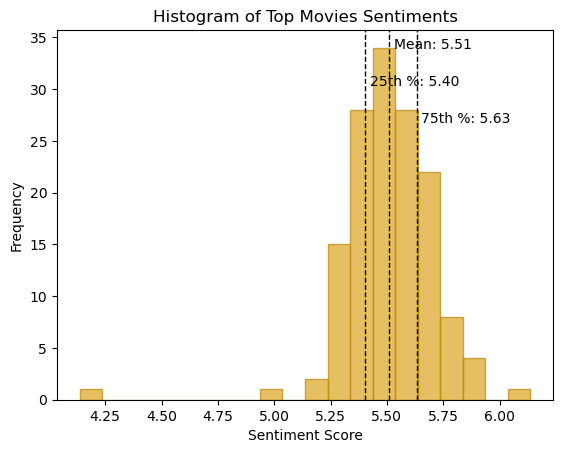

In [145]:
# Plot the histogram of sentiment scores
plt.hist(sentiment_scores, bins=20, alpha=0.7, color='goldenrod', edgecolor='darkgoldenrod')

# Add vertical lines for the mean, median, 25th percentile, and 75th percentile    
plt.axvline(average_sentiment, color='black', linestyle='dashed', linewidth=1)
plt.axvline(percentile_25_sentiment, color='black', linestyle='dashed', linewidth=1)
plt.axvline(percentile_75_sentiment, color='black', linestyle='dashed', linewidth=1)

plt.text(average_sentiment+ 0.02, plt.ylim()[1]*0.95, f"Mean: {average_sentiment:.2f}", color='black')
plt.text(percentile_25_sentiment+ 0.02, plt.ylim()[1]*0.85, f"25th %: {percentile_25_sentiment:.2f}", color='black')
plt.text(percentile_75_sentiment+ 0.02, plt.ylim()[1]*0.75, f"75th %: {percentile_75_sentiment:.2f}", color='black')

plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.title('Histogram of Top Movies Sentiments')

plt.show()

For further analysis, we identify the top happiest and saddest synopsis by collecting and sorting their sentiment scores.

In [146]:
# Collect sentiment scores and corresponding movies names
movie_sentiment = {
    node: data['Sentiment']
    for node, data in M2.nodes(data=True) if 'Sentiment' in data
}

# Convert to a list of tuples for sorting
sentiment_list = [(movie, score) for movie, score in movie_sentiment.items() if score is not None]

# Sort by sentiment scores (happiest first)
sorted_sentiment = sorted(sentiment_list, key=lambda x: x[1], reverse=True)

# Get the top 10 happiest
happiest_movies = sorted_sentiment[:10]

# Get the top 10 saddest
saddest_movies = sorted_sentiment[-10:][::-1]

# Display results
print("Top 10 Happiest Movies:")
for artist, score in happiest_movies:
    print(f"{artist}: {score:.3f}")

print("\nTop 10 Saddest Movies:")
for artist, score in saddest_movies:
    print(f"{artist}: {score:.3f}")

Top 10 Happiest Movies:
Goal! III: 6.137
Bharat: 5.910
Student of the Year 2: 5.906
Munna Michael: 5.894
American Pie Presents: The Book of Love: 5.869
Fifty Shades of Grey: 5.833
Action Replayy: 5.808
Street Dancer 3D: 5.803
Mother of the Bride: 5.778
Jack and Jill: 5.771

Top 10 Saddest Movies:
Legend of the Bog: 4.136
The Human Centipede III (Final Sequence): 4.950
Delta Farce: 5.212
House of the Dead: 5.228
Shriek If You Know What I Did Last Friday the Thirteenth: 5.255
Dragonball Evolution: 5.260
Ultraviolet: 5.263
The Human Centipede 2 (Full Sequence): 5.278
Highlander: Endgame: 5.288
The Human Centipede (First Sequence): 5.294


# Sentiment analysis of both TOP and BOTTOM movies
Create dictionary: 

1. Input Data: The process starts with a CSV file (top_250_scraped_keywords_with_names.csv) containing movie names and their associated keywords.

2. Genre Information: Each movie in the dataset is linked to a network, where its genres are stored. For example, a movie might belong to genres like Drama and Thriller.

3. Counting Keywords by Genre: For every movie:
    - Its keywords are extracted and split into a list.
    - Each keyword is counted under the genres associated with that movie. 
    - For example, if the keyword "prison" appears in a movie tagged with Drama and Thriller, it increases the count of Drama and Thriller for the keyword.

4. Building the Dictionary: A dictionary is constructed where:
    - Each keyword is a key.
    - The value is another dictionary with genres as keys and their respective counts as values.
    - This dictionary is then converted into a tabular format (DataFrame) for easier analysis and storage.

5. Output: The final dictionary is saved as a CSV file (top_250_dictionary.csv) for further use.

Purpose: This dictionary enables us to associate keywords with the genres they frequently occur in, helping in genre prediction and analysis for movies based on their keywords.

| **Keyword** | **Drama** | **Action** | **Thriller** | **Romance** |
|-------------|-----------|------------|--------------|-------------|
| **prison**  | 17.0      | 3.0        | 5.0          | 0.0         |
| **love**    | 10.0      | 0.0        | 0.0          | 10.0        |
| **survival**| 0.0       | 10.0       | 10.0         | 0.0         |


First for the top movies.

In [93]:
# Load the CSV containing movie names and keywords
keywords_df = pd.read_csv("top_250_scraped_keywords_with_names.csv")

# Initialize a dictionary to store keyword counts by genre
keyword_genre_counts = defaultdict(lambda: defaultdict(int))  # {keyword: {genre: count}}

# Loop through each movie in the CSV
for _, row in keywords_df.iterrows():
    movie_name = row['Name']  # Name of the movie
    keywords = row['keywords'].split(", ")  # List of keywords for the movie

    # Get the genres associated with the movie from G2
    if movie_name in G2.nodes:
        genres = G2.nodes[movie_name].get("Genres", [])  # Get genres as a list
    else:
        print(f"Movie '{movie_name}' not found. Skipping...")
        continue  # Skip if the movie is not in the graph

    # Count each keyword under the appropriate genres
    for keyword in keywords:
        for genre in genres:
            keyword_genre_counts[keyword][genre] += 1

# Create a list of rows to build the DataFrame
rows = []
for keyword, genre_counts in keyword_genre_counts.items():
    row = {"Keyword": keyword}
    row.update(genre_counts)  # Add genre counts for this keyword
    rows.append(row)

# Convert the list of dictionaries into a DataFrame
genre_counts_df = pd.DataFrame(rows)

# Fill missing values with 0 (keywords that don't appear in some genres)
genre_counts_df.fillna(0, inplace=True)

# Save the resulting DataFrame to a new CSV file
genre_counts_df.to_csv("top_250_dictionary.csv", index=False)
print("Length of the dataframe:", len(rows))


Movie 'The Good, the Bad and the Ugly' not found. Skipping...
Movie 'Gladiator' not found. Skipping...
Movie 'Alien' not found. Skipping...
Movie 'Grave of the Fireflies' not found. Skipping...
Movie 'Joker' not found. Skipping...
Movie 'Inside Out' not found. Skipping...
Movie 'The Wild Robot' not found. Skipping...
Movie 'Ikiru' not found. Skipping...
Movie 'The Kid' not found. Skipping...
Movie 'The Wages of Fear' not found. Skipping...
Movie 'The Passion of Joan of Arc' not found. Skipping...
Length of the dataframe: 10022


Now with the bottom movies.

In [94]:
# Load the CSV containing movie names and keywords
keywords_df = pd.read_csv("bottom_250_scraped_keywords_with_names.csv")

# Initialize a dictionary to store keyword counts by genre
keyword_genre_counts = defaultdict(lambda: defaultdict(int))  # {keyword: {genre: count}}

# Loop through each movie in the CSV
for _, row in keywords_df.iterrows():
    movie_name = row['Name']  # Name of the movie
    keywords = row['keywords'].split(", ")  # List of keywords for the movie

    # Get the genres associated with the movie from G2
    if movie_name in M2.nodes:
        genres = M2.nodes[movie_name].get("Genres", [])  # Get genres as a list
    else:
        print(f"Movie '{movie_name}' not found. Skipping...")
        continue  # Skip if the movie is not in the graph

    # Count each keyword under the appropriate genres
    for keyword in keywords:
        for genre in genres:
            keyword_genre_counts[keyword][genre] += 1

# Create a list of rows to build the DataFrame
rows = []
for keyword, genre_counts in keyword_genre_counts.items():
    row = {"Keyword": keyword}
    row.update(genre_counts)  # Add genre counts for this keyword
    rows.append(row)

# Convert the list of dictionaries into a DataFrame
genre_counts_df = pd.DataFrame(rows)

# Fill missing values with 0 (keywords that don't appear in some genres)
genre_counts_df.fillna(0, inplace=True)

# Save the resulting DataFrame to a new CSV file
genre_counts_df.to_csv("bottom_250_dictionary.csv", index=False)
print(f"Lenght of the dataframe: {len(rows)}")

Movie 'Home Alone 3' not found. Skipping...
Movie 'Aliens vs. Predator: Requiem' not found. Skipping...
Movie 'Alvin and the Chipmunks: The Squeakquel' not found. Skipping...
Movie 'Death Note' not found. Skipping...
Movie 'Jason X' not found. Skipping...
Movie 'Ouija' not found. Skipping...
Movie 'Friday the 13th Part VIII: Jason Takes Manhattan' not found. Skipping...
Movie 'Species II' not found. Skipping...
Movie 'Rings' not found. Skipping...
Movie 'Skyline' not found. Skipping...
Movie 'Kangaroo Jack' not found. Skipping...
Movie 'xXx: State of the Union' not found. Skipping...
Movie 'The Butterfly Effect 2' not found. Skipping...
Movie 'Movie 43' not found. Skipping...
Movie 'Basic Instinct 2' not found. Skipping...
Movie 'He's All That' not found. Skipping...
Movie 'Alvin and the Chipmunks: Chipwrecked' not found. Skipping...
Movie 'Escape Plan: The Extractors' not found. Skipping...
Movie 'The Grudge' not found. Skipping...
Movie 'Cell' not found. Skipping...
Movie 'Bio-Dome' 

Join both dictionaries into one merged dictionary containing all the keywords.

In [96]:
# Join top movies dictionary with the bottom movies dictionary
df1 = pd.read_csv("top_250_dictionary.csv")
df2 = pd.read_csv("bottom_250_dictionary.csv")

# Ensure both datasets have the same columns
all_genres = sorted(set(df1.columns).union(set(df2.columns)) - {'Keyword'})
df1 = df1.set_index('Keyword').reindex(columns=all_genres, fill_value=0.0).reset_index()
df2 = df2.set_index('Keyword').reindex(columns=all_genres, fill_value=0.0).reset_index()

# Combine the datasets and sum values for overlapping keywords and genres
merged_df = pd.concat([df1, df2]).groupby('Keyword', as_index=False).sum()

# Export to a new CSV file
merged_df.to_csv('unified_dictionary.csv', index=False)

# Preview the merged DataFrame head
print(merged_df.head())

            Keyword  Action  Adventure  Animation  Biography  Comedy  Crime  \
0       10 year old     0.0        1.0        1.0        0.0     0.0    0.0   
1       11 year old     0.0        0.0        0.0        0.0     0.0    0.0   
2  12 gauge shotgun     0.0        0.0        0.0        0.0     0.0    1.0   
3       12 year old     0.0        1.0        0.0        0.0     1.0    0.0   
4   12 year old boy     0.0        1.0        0.0        0.0     1.0    0.0   

   Documentary  Drama  Family  ...  Music  Musical  Mystery  Romance  Sci-Fi  \
0          0.0    0.0     1.0  ...    0.0      0.0      1.0      0.0     0.0   
1          0.0    1.0     0.0  ...    0.0      0.0      0.0      0.0     0.0   
2          0.0    1.0     0.0  ...    0.0      0.0      0.0      0.0     0.0   
3          0.0    2.0     0.0  ...    0.0      0.0      0.0      0.0     0.0   
4          0.0    2.0     0.0  ...    0.0      0.0      0.0      0.0     0.0   

   Short  Sport  Thriller  War  Western  
0 

Analyse the dictionary.

In [97]:
# In the merged dictionary, find the top 10 keywords for each genre
top_keywords_by_genre = {}

# Iterate over each genre
for genre in all_genres:
    # Sort the keywords for this genre by count in descending order
    top_keywords = merged_df.sort_values(by=genre, ascending=False)['Keyword'].head(10).tolist()
    
    # Add the top keywords to the dictionary
    top_keywords_by_genre[genre] = top_keywords

# Display the top keywords for each genre
for genre, keywords in top_keywords_by_genre.items():
    print(f"{genre}: {keywords}")


Action: ['blockbuster', 'battle', 'rescue', 'sequel', 'good versus evil', 'famous score', 'hero', 'fight', 'explosion', 'cult film']
Adventure: ['blockbuster', 'famous score', 'national film registry', 'rescue', 'good versus evil', 'no opening credits', 'battle', 'sequel', 'chase', 'hero']
Animation: ['blockbuster', 'friendship', 'surrealism', 'father son relationship', 'flying', 'computer animation', 'cgi animation', 'no opening credits', 'dog', 'flashback']
Biography: ['based on true story', 'father son relationship', 'betrayal', 'period drama', 'docudrama drama', 'based on book', 'national film registry', 'brutality', 'male nudity', 'based on real person']
Comedy: ['friendship', 'national film registry', 'father son relationship', 'cult film', 'dog', 'male protagonist', 'cigarette smoking', 'character name in title', 'flashback', 'mother son relationship']
Crime: ['murder', 'neo noir', 'police', 'national film registry', 'organized crime', 'gangster', 'based on novel', 'police offic

In [98]:
# Sum counts for each genre (column) excluding the "Keyword" column
genre_totals = merged_df.drop(columns=["Keyword"]).sum(axis=0)

# Sort the genres by their total counts in descending order
sorted_genre_totals = genre_totals.sort_values(ascending=False)

# Print the genres and their total counts   
print("Total counts for each genre:")
for genre, total in sorted_genre_totals.items():
    print(f"{genre}: {total}")

Total counts for each genre:
Drama: 15138.0
Adventure: 5892.0
Action: 5371.0
Thriller: 5346.0
Comedy: 5120.0
Crime: 4534.0
Sci-Fi: 3563.0
Fantasy: 3268.0
Mystery: 3190.0
Romance: 2826.0
War: 2537.0
Biography: 2299.0
Family: 2299.0
Animation: 1999.0
Horror: 1042.0
Music: 728.0
Sport: 648.0
History: 600.0
Musical: 460.0
Western: 370.0
Film-Noir: 200.0
Short: 100.0
Documentary: 100.0


#### Extract the synopses of all movies and clean them.
Get synopses for TOP movies

In [99]:
# Path to the directory containing text files
dir_path = "top_net_movies_info"
titles_file = "top_net_movies_titles.txt"

# Load the list of movie titles
with open(titles_file, 'r', encoding='utf-8') as file:
    movie_titles = [line.strip() for line in file.readlines()]

# Function to sanitize movie titles for matching file names
def sanitize_title(title):
    # Replace special characters like ":" and "?" with underscores "_"
    return title.replace(":", "_").replace("?", "_").replace("/", "_")

# Sanitize all movie titles
sanitized_titles = {sanitize_title(title): title for title in movie_titles}
print(f"Sanitized titles for {len(sanitized_titles)} movies.")

# Function to extract the synopsis from a file
def extract_synopsis(file_path):
    with open(file_path, 'r', encoding='utf-8') as file:
        content = file.read()

    # Use a regular expression to extract the synopsis (assuming it's between "Synopsis:" and "]")
    match = re.search(r'Synopsis:\s*\[(.*?)\]', content, re.DOTALL)
    if match:
        synopsis = match.group(1)
        return synopsis
    else:
        return ""

# Get a list of all files in the directory
files = os.listdir(dir_path)

# Extract synopses for movies in the list
synopses_top = {}
for file in files:
    file_name_without_ext = os.path.splitext(file)[0]  # Get the file name without extension
    
    # Check if the file corresponds to a sanitized title
    if file_name_without_ext in sanitized_titles:
        original_title = sanitized_titles[file_name_without_ext]  # Get the original movie title
        file_path = os.path.join(dir_path, file)
        synopsis = extract_synopsis(file_path)
        synopses_top[original_title] = synopsis


# Preview the extracted synopses with a example
print(synopses_top['A Beautiful Mind'])


Sanitized titles for 391 movies.
'In 1947, John Nash (Russell Crowe) arrives at Princeton University. He is a co-recipient, with Martin Hansen (Josh Lucas), of the prestigious Carnegie Scholarship for mathematics. At a reception, he meets a group of other promising math and science graduate students, Richard Sol (Adam Goldberg), Ainsley (Jason Gray-Stanford), and Bender (Anthony Rapp). He also meets his roommate Charles Herman (Paul Bettany), a literature student.\nNash is under extreme pressure to publish, but he wants to publish his own original idea. His inspiration comes when he and his fellow graduate students discuss how to approach a group of women at a bar. Hansen quotes Adam Smith and advocates "every man for himself," but Nash argues that a cooperative approach would lead to better chances of success. Nash develops a new concept of governing dynamics and publishes an article on this. On the strength of this, he is offered an appointment at MIT where Sol and Bender join him.So

In [101]:
# Function to clean and preprocess the text
def clean_text(text):
    text = text.lower()  # Convert to lowercase
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    return text

# Clean all synopses
for movie, synopsis in synopses_top.items():
    synopses_top[movie] = clean_text(synopsis)

# Preview the cleaned synopses in a example
print(synopses_top['A Beautiful Mind'])


in 1947 john nash russell crowe arrives at princeton university he is a corecipient with martin hansen josh lucas of the prestigious carnegie scholarship for mathematics at a reception he meets a group of other promising math and science graduate students richard sol adam goldberg ainsley jason graystanford and bender anthony rapp he also meets his roommate charles herman paul bettany a literature studentnnash is under extreme pressure to publish but he wants to publish his own original idea his inspiration comes when he and his fellow graduate students discuss how to approach a group of women at a bar hansen quotes adam smith and advocates every man for himself but nash argues that a cooperative approach would lead to better chances of success nash develops a new concept of governing dynamics and publishes an article on this on the strength of this he is offered an appointment at mit where sol and bender join himsome years later nash is invited to the pentagon to crack encrypted enemy

Get synopses for BOTTOM  movies

In [102]:
# Path to the directory containing text files
dir_path = "bottom_net_movies_info"
titles_file = "bottom_net_movies_titles.txt"

# Load the list of movie titles
with open(titles_file, 'r', encoding='utf-8') as file:
    movie_titles = [line.strip() for line in file.readlines()]

# Sanitize all movie titles
sanitized_titles = {sanitize_title(title): title for title in movie_titles}
print(f"Sanitized titles for {len(sanitized_titles)} movies.")

# Get a list of all files in the directory
files = os.listdir(dir_path)

# Extract synopses for movies in the list
synopses_bottom = {}
for file in files:
    file_name_without_ext = os.path.splitext(file)[0]  # Get the file name without extension
    
    # Check if the file corresponds to a sanitized title
    if file_name_without_ext in sanitized_titles:
        original_title = sanitized_titles[file_name_without_ext]  # Get the original movie title
        file_path = os.path.join(dir_path, file)
        synopsis = extract_synopsis(file_path)
        synopses_bottom[original_title] = synopsis

# Clean all synopses
for movie, synopsis in synopses_bottom.items():
    synopses_bottom[movie] = clean_text(synopsis)

# Preview the extracted synopses with a example
print(synopses_bottom['Battlefield Earth'])


Sanitized titles for 243 movies.
in the year 3000 earth has been ruled for 1000 years by the psychlos a brutal race of giant humanoid aliens the remnants of humanity are either enslaved by the psychlos and used for manual labor or survive in primitive tribes living in remote areas outside psychlo control jonnie goodboy tyler barry pepper a member of one such tribe leaves his home in the rocky mountains on a journey of exploration he joins forces with carlo kim coates a hunter but both men are captured by a psychlo raiding party and transported to a slave camp at the psychlos main base on earth a giant dome built over the ruins of denver coloradonterl john travolta the psychlo security chief on earth has been condemned by his superiors to remain indefinitely at his post on earth as punishment for an unclear incident involving the senators daughter aided by his deputy ker forest whitaker terl devises a plan to buy his way off the planet by making a fortune using human slaves to mine gold

#### Mapping

**Step1: Normalize the Genre Values**

For each keyword in the dataset, normalize the genre values so their total adds up to **1**. This ensures that each keyword contributes proportionally to its associated genres.

Example Dataset:
| Keyword  | Drama | Biography | Crime | Thriller | Short | Action | Sci-Fi | War | Mystery | Comedy | Adventure | Fantasy | Horror |
|----------|-------|-----------|-------|----------|-------|--------|--------|-----|---------|--------|-----------|---------|--------|
| prison   | 18.0  | 5.0       | 10.0  | 5.0      | 1.0   | 2.0    | 2.0    | 4.0 | 2.0     | 4.0    | 3.0       | 1.0     | 1.0    |
| action   | 2.0   | 0.0       | 4.0   | 3.0      | 0.0   | 5.0    | 6.0    | 0.0 | 1.0     | 2.0    | 7.0       | 1.0     | 3.0    |

1. Calculate the Total for Each Keyword:  
   - **prison**: $18 + 5 + 10 + 5 + 1 + 2 + 2 + 4 + 2 + 4 + 3 + 1 + 1 = 58$
   - **action**: $2 + 0 + 4 + 3 + 0 + 5 + 6 + 0 + 1 + 2 + 7 + 1 + 3 = 34$
   
2. Normalize Each Value for Each Keyword:  
   - For **prison**:  
     - Drama: $\frac{18}{58} = 0.310$ 
     - Biography: $\frac{5}{58} = 0.086$  
     - Crime: $\frac{10}{58} = 0.172$ 
     - And so on...

   - For **action**:  
     - Drama: $\frac{2}{34} = 0.059$  
     - Biography: $\frac{0}{34} = 0.0$
     - Crime: $\frac{4}{34} = 0.118$ 
     - And so on...

Normalized Dataset:
| Keyword  | Drama  | Biography | Crime  | Thriller | Short  | Action | Sci-Fi | War   | Mystery | Comedy | Adventure | Fantasy | Horror |
|----------|--------|-----------|--------|----------|--------|--------|--------|-------|---------|--------|-----------|---------|--------|
| prison   | 0.310  | 0.086     | 0.172  | 0.086    | 0.017  | 0.034  | 0.034  | 0.069 | 0.034   | 0.069  | 0.052     | 0.017   | 0.017  |
| action   | 0.059  | 0.000     | 0.118  | 0.088    | 0.000  | 0.147  | 0.176  | 0.000 | 0.029   | 0.059  | 0.206     | 0.029   | 0.088  |


**Step 2: Process the Synopsis**
1. Split the synopsis into individual words.
2. For each word in the synopsis:
   - If it matches a keyword in the dataset, retrieve its normalized genre values.
   - Add these normalized values to the running total for each genre.

Example:

Synopsis:  *"prison action prison"*

- The word "prison" appears **twice**.
- The word "action" appears **once**.

Add Contributions for 'prison' (twice):  
- Drama: $2 \times 0.310 = 0.620$
- Biography: $2 \times 0.086 = 0.172$
- Crime: $2 \times 0.172 = 0.344$
- And so on...

Add Contributions for 'action' (once):  
- Drama: $0.059$  
- Biography: $0.000$ 
- Crime: $0.118$
- And so on...

Total Contributions:
| Genre     | Total Contribution |
|-----------|---------------------|
| Drama     | 0.620 + 0.059 = 0.679 |
| Biography | 0.172 + 0.000 = 0.172 |
| Crime     | 0.344 + 0.118 = 0.462 |
| And so on...


**Step 3: Calculate Genre Percentages**
1. Sum All Contributions:  
   $\text{Total} = 0.679 + 0.172 + 0.462 + 0.260 + 0.034 + 0.215 + 0.244 + \dots$
   
2. Calculate the Percentage for Each Genre:  
   - Drama: $\frac{0.679}{\text{Total}} \times 100$ 
   - Biography: $\frac{0.172}{\text{Total}} \times 100$ 
   - Crime: $\frac{0.462}{\text{Total}} \times 100$  
   - And so on...

Final Genre Percentages:
| Genre     | Percentage |
|-----------|------------|
| Drama     | 43.9%      |
| Biography | 12.2%      |
| Crime     | 24.4%      |
| Thriller  | 12.2%      |
| Short     | 2.4%       |
| Action    | 4.9%       |


In [107]:
# Step 1: Normalize the genre values for each keyword
def normalize_genres(df):
    normalized_mapping = {}
    for _, row in df.iterrows():
        keyword = row['Keyword']
        genre_values = row.iloc[1:]  # Exclude 'Keyword'
        genre_values = genre_values[genre_values > 0]  # Keep only non-zero genres
        total = genre_values.sum()
        normalized_mapping[keyword] = (genre_values / total).to_dict()  # Normalize
    return normalized_mapping

# Step 2: Process synopsis to calculate genre percentages
def calculate_genre_percentages(synopsis, keyword_genre_mapping):
    words = synopsis.split()  # Split synopsis into words
    genre_totals = Counter()
    
    # For each word in the synopsis
    for word in words:
        if word in keyword_genre_mapping:  # If the word is in the mapping
            for genre, value in keyword_genre_mapping[word].items():
                genre_totals[genre] += value  # Add the genre contribution
    
    # Convert totals into percentages
    total_contributions = sum(genre_totals.values())
    genre_percentages = {genre: (count / total_contributions) * 100 for genre, count in genre_totals.items()}
    return genre_percentages

# Step 3: Process all synopses and calculate genre percentage
def process_and_save_genre_percentages(synopses, keyword_genre_mapping, output_file):
    movie_genre_percentages = []

    for movie_name, synopsis in synopses.items():
        # Calculate percentages for the movie
        genre_percentages = calculate_genre_percentages(synopsis, keyword_genre_mapping)
        # Sort genres by percentage in descending order
        sorted_genres = sorted(genre_percentages.items(), key=lambda x: x[1], reverse=True)
        # Prepare data for saving
        movie_genre_percentages.append({
            "Movie": movie_name,
            "Top Genre": sorted_genres[0][0] if sorted_genres else None,  # Highest percentage genre
            "Top Percentage": sorted_genres[0][1] if sorted_genres else 0,  # Highest percentage
            "All Genres": ", ".join([f"{genre}: {percentage:.2f}%" for genre, percentage in sorted_genres])  # Full list
        })

    # Convert to DataFrame and save
    result_df = pd.DataFrame(movie_genre_percentages)
    result_df.to_csv(output_file, index=False)
    print(f"Genre percentages saved to {output_file}")

In [108]:
# Normalize the genre values
genre_df = pd.read_csv('merged_dictionary.csv')
normalized_mapping = normalize_genres(genre_df)

# Calculate genre percentages for a synopsis and save top movies
output_file_top = "NEW_top_movie_genre_percentages.csv"
process_and_save_genre_percentages(synopses_top, normalized_mapping, output_file_top)

# Check for example movie
movie_name = "12 Angry Men"
genre_percentages = calculate_genre_percentages(synopses_top[movie_name], normalized_mapping)
total_percentage = sum(genre_percentages.values())
print(f"Total percentage for '{movie_name}': {total_percentage:.2f}%")
print(f"Percentage for each genre: {genre_percentages}")

Genre percentages saved to NEW_top_movie_genre_percentages.csv
Total percentage for '12 Angry Men': 100.00%
Percentage for each genre: {'Drama': 26.381568015279, 'Biography': 2.3461602425532275, 'Crime': 11.128055825822877, 'Thriller': 8.960673261475536, 'Action': 4.304284413721322, 'Sci-Fi': 4.582361212785851, 'Mystery': 5.429027672960514, 'War': 2.4771309941270077, 'Comedy': 7.725559573346804, 'Adventure': 7.54522978509525, 'Fantasy': 4.887186783884123, 'Music': 0.7899018005514952, 'Animation': 3.2949282548164134, 'Family': 3.7841824876577967, 'Horror': 1.4215355487066015, 'Romance': 3.0769512733201188, 'History': 0.5663415758985628, 'Sport': 0.9933670671049956, 'Film-Noir': 0.10530736036476146, 'Western': 0.15401557711950975, 'Musical': 0.046231273408239716}


In [109]:
# Calculate genre percentages for a synopsis and save bottom movies
output_file_bottom = "NEW_bottom_movie_genre_percentages.csv"
process_and_save_genre_percentages(synopses_bottom, normalized_mapping, output_file_bottom)

# Check for example movie
movie_name = "Alone in the Dark"
genre_percentages = calculate_genre_percentages(synopses_bottom[movie_name], normalized_mapping)
total_percentage = sum(genre_percentages.values())
print(f"Total percentage for '{movie_name}': {total_percentage:.2f}%")
print(f"Percentage for each genre: {genre_percentages}")

Genre percentages saved to NEW_bottom_movie_genre_percentages.csv
Total percentage for 'Alone in the Dark': 100.00%
Percentage for each genre: {'Drama': 20.708174945864894, 'Romance': 4.018118325880846, 'Thriller': 7.222221248666262, 'Action': 8.232783298438177, 'Sci-Fi': 7.742528572349491, 'Adventure': 9.029854727763517, 'Fantasy': 5.330464338143604, 'War': 4.832293221617036, 'Mystery': 7.185236035205388, 'Biography': 1.455713558102795, 'Crime': 4.643772855221432, 'Comedy': 5.968018555878848, 'History': 0.5727581291642535, 'Horror': 5.072556760737612, 'Animation': 2.327935443752423, 'Family': 3.0589804226265125, 'Musical': 0.19316749763059976, 'Western': 1.4479802151035035, 'Sport': 0.15245409081025524, 'Music': 0.31694966626473486, 'Film-Noir': 0.48803809077781707}


Consider the top genre of each movie as its definitive genre. This means we use the "Top Genre" column from the datasets as the primary genre for each movie. 
Then, we calculate the total count of movies for each genre in both datasets: TOP and BOTTOM.
The chart shows how genres are distributed between the top and bottom movie categories.

Counter({'Drama': 308, 'Adventure': 5, 'Thriller': 2, 'Comedy': 1})
Counter({'Drama': 138, 'Comedy': 3, 'Fantasy': 1, 'Adventure': 1})


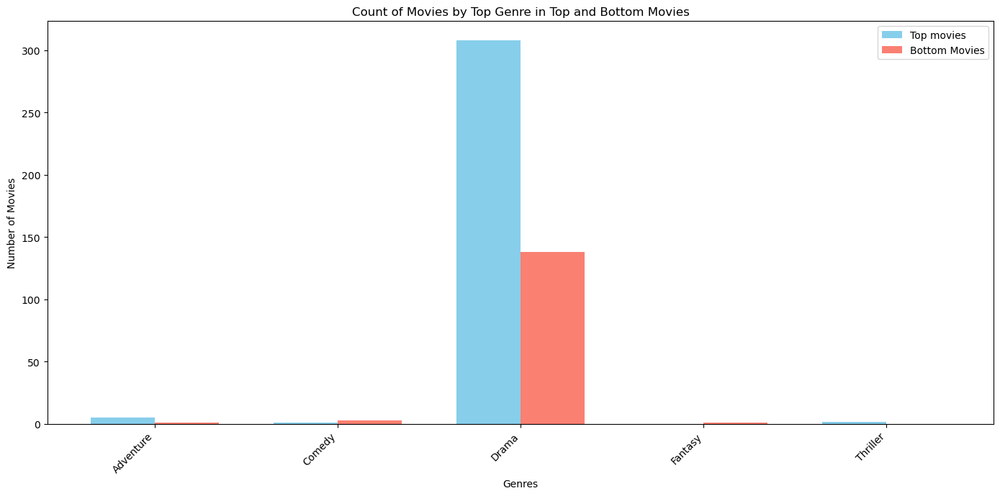

In [110]:
df1 = pd.read_csv("NEW_top_movie_genre_percentages.csv")
df2 = pd.read_csv("NEW_bottom_movie_genre_percentages.csv")

# Function to calculate top genre counts
def calculate_top_genre_counts(df):
    genre_counts = Counter()
    
    # Count occurrences of top genres
    for _, row in df.iterrows():
        top_genre = row["Top Genre"]
        if pd.notna(top_genre):  # Ensure there's a valid genre
            genre_counts[top_genre] += 1
    
    return genre_counts

# Calculate top genre counts for both datasets
top_genre_counts_1 = calculate_top_genre_counts(df1)  # For top movies
top_genre_counts_2 = calculate_top_genre_counts(df2)  # For bottom movies
print(top_genre_counts_1)
print(top_genre_counts_2)

# Align genres for consistent plotting
all_genres = sorted(set(top_genre_counts_1.keys()).union(top_genre_counts_2.keys()))
counts_1 = [top_genre_counts_1.get(genre, 0) for genre in all_genres]
counts_2 = [top_genre_counts_2.get(genre, 0) for genre in all_genres]

# Plotting
x = np.arange(len(all_genres))  # X-axis positions
width = 0.35  # Width of the bars

plt.figure(figsize=(14, 7))

# Bars for the first dataset (top movies)
plt.bar(x - width / 2, counts_1, width, label='Top movies', color='skyblue')

# Bars for the second dataset (bottom movies)
plt.bar(x + width / 2, counts_2, width, label='Bottom Movies', color='salmon')

# Labels and formatting
plt.xticks(x, all_genres, rotation=45, ha='right')
plt.title('Count of Movies by Top Genre in Top and Bottom Movies')
plt.xlabel('Genres')
plt.ylabel('Number of Movies')
plt.legend()
plt.tight_layout()
plt.show()

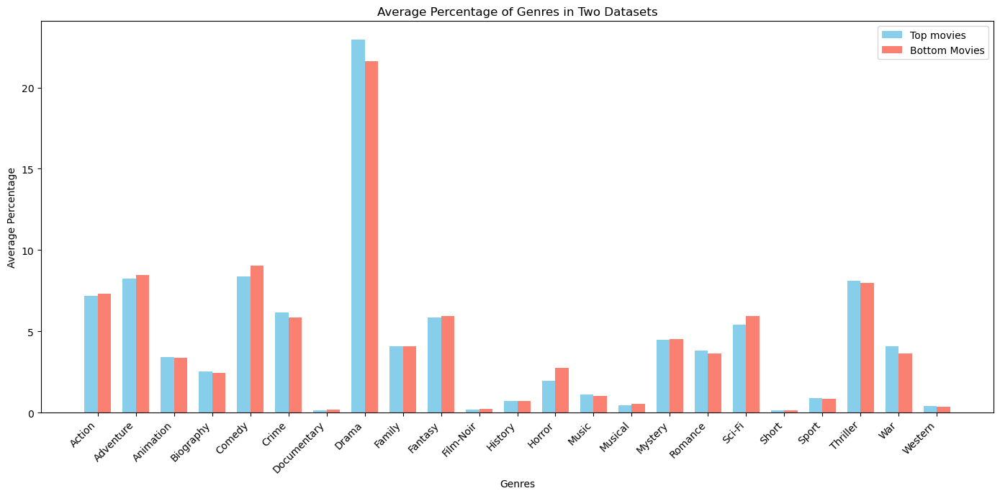

In [111]:
# Function to parse the 'All Genres' column into a dictionary
def parse_all_genres(row):
    if pd.isna(row):  # Handle empty or NaN cells
        return {}
    genre_dict = {}
    for item in row.split(', '):
        genre, percentage = item.split(': ')
        genre_dict[genre] = float(percentage.strip('%'))
    return genre_dict

# Load and process the first CSV file
df1 = pd.read_csv("NEW_top_movie_genre_percentages.csv")
df2 = pd.read_csv("NEW_bottom_movie_genre_percentages.csv")

df1['Parsed Genres'] = df1['All Genres'].apply(parse_all_genres)
df2['Parsed Genres'] = df2['All Genres'].apply(parse_all_genres)

# Function to calculate average percentages
def calculate_avg_genres(df):
    all_genres = {}
    for genres in df['Parsed Genres']:
        for genre, percentage in genres.items():
            all_genres[genre] = all_genres.get(genre, []) + [percentage]
    avg_genres = {genre: sum(percentages) / len(percentages) for genre, percentages in all_genres.items()}
    return avg_genres

# Calculate averages for both datasets
avg_genres_1 = calculate_avg_genres(df1)
avg_genres_2 = calculate_avg_genres(df2)

# Align genres for consistent plotting
all_genres = sorted(set(avg_genres_1.keys()).union(avg_genres_2.keys()))
avg_1 = [avg_genres_1.get(genre, 0) for genre in all_genres]
avg_2 = [avg_genres_2.get(genre, 0) for genre in all_genres]

# Plotting
x = np.arange(len(all_genres))  # X-axis positions
width = 0.35  # Width of the bars

plt.figure(figsize=(14, 7))

# Bars for the first dataset
plt.bar(x - width/2, avg_1, width, label='Top movies', color='skyblue')

# Bars for the second dataset
plt.bar(x + width/2, avg_2, width, label='Bottom Movies', color='salmon')

# Labels and formatting
plt.xticks(x, all_genres, rotation=45, ha='right')
plt.title('Average Percentage of Genres in Two Datasets')
plt.xlabel('Genres')
plt.ylabel('Average Percentage')
plt.legend()
plt.tight_layout()
plt.show()

Compare obtained genres with the real genres in the movies.

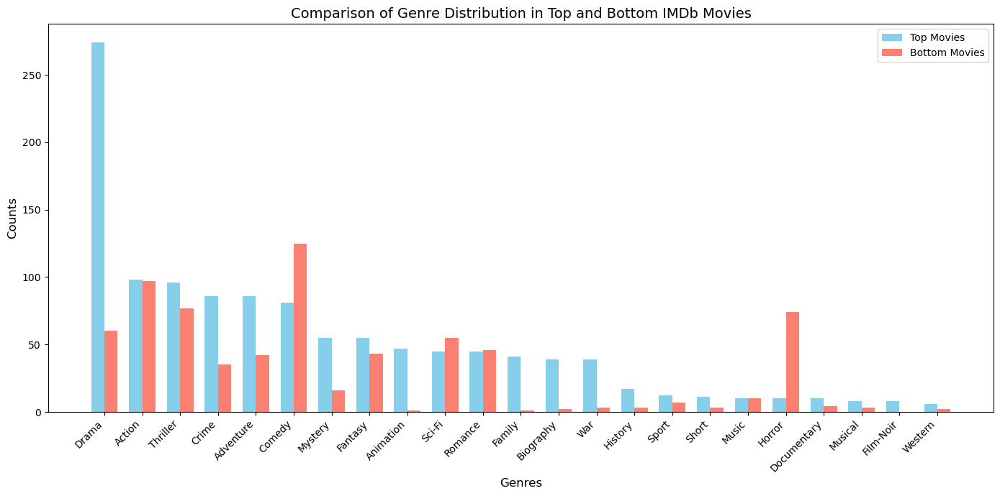

In [112]:
# Convert data into DataFrames
df_top = pd.DataFrame(common_genres_top, columns=['Genre', 'Top_Count'])
df_bottom = pd.DataFrame(common_genres_bottom, columns=['Genre', 'Bottom_Count'])

# Merge the DataFrames
df = pd.merge(df_top, df_bottom, on='Genre', how='outer').fillna(0)

# Sort by Top movie counts for better visualization
df = df.sort_values(by='Top_Count', ascending=False)

# Plot the bar chart
fig, ax = plt.subplots(figsize=(14, 7))
width = 0.35  # Width of the bars

# Bar positions
x = range(len(df))

# Create bars for Top and Bottom
ax.bar(x, df['Top_Count'], width, label='Top Movies', color='skyblue')
ax.bar([p + width for p in x], df['Bottom_Count'], width, label='Bottom Movies', color='salmon')

# Add labels, title, and legend
ax.set_xlabel('Genres', fontsize=12)
ax.set_ylabel('Counts', fontsize=12)
ax.set_title('Comparison of Genre Distribution in Top and Bottom IMDb Movies', fontsize=14)
ax.set_xticks([p + width/2 for p in x])
ax.set_xticklabels(df['Genre'], rotation=45, ha='right')
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()